## Germany Offwind Cut Scenario with 130 €/t CO2 price

In [1]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [2]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_DE\\26032024_5nodes_co2price\\elec_s_5_ec_lv1.5_Ep-3h.nc")


INFO:pypsa.io:Imported network elec_s_5_ec_lv1.5_Ep-3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [3]:
n.global_constraints

,type,carrier_attribute,sense,constant,mu,investment_period
GlobalConstraint,,,,,,
lv_limit,transmission_volume_expansion_limit,"AC, DC",<=,4.555356e+07,-0.000006,NaN


In [4]:
#n.global_constraints.loc['CO2Limit','constant'] = 184500000 #TCO2 184500000

In [5]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 10 entries
Component 'Carrier' has 23 entries
Component 'GlobalConstraint' has 1 entries
Component 'Line' has 6 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 13 entries
Component 'Load' has 5 entries
Component 'Generator' has 71 entries
Component 'StorageUnit' has 12 entries
Component 'Store' has 5 entries


In [6]:
#remove nuclear fleet from germany
n.generators.loc[n.generators.index.str.endswith('nuclear'), 'p_nom'] = 0


In [7]:
# set marginal cost of load shedding to 3000€/MWh
for bus in n.generators.bus:
    for index in n.generators.index:
        if not bus.endswith('H2') and index.endswith('load'):
            n.generators.loc[index, 'marginal_cost'] = 3000

#edit load shedding's unit from kW to MW
for index in n.generators.index:
    if index.endswith('load') and not index.endswith('H2 load'):
        n.generators.loc[index, 'sign'] = 1

In [8]:
#solve network
n.optimize(solver_name='gurobi')
#n.lopf(solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:01<00:00,  9.33it/s]
INFO:linopy.io: Writing time: 11.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-48izxowe.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-48izxowe.lp


Reading time = 3.14 seconds


INFO:gurobipy:Reading time = 3.14 seconds


obj: 849796 rows, 402989 columns, 1564774 nonzeros


INFO:gurobipy:obj: 849796 rows, 402989 columns, 1564774 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 849796 rows, 402989 columns and 1564774 nonzeros


INFO:gurobipy:Optimize a model with 849796 rows, 402989 columns and 1564774 nonzeros


Model fingerprint: 0x16f49233


INFO:gurobipy:Model fingerprint: 0x16f49233


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 9e+09]


INFO:gurobipy:  Bounds range     [1e+01, 9e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 593259 rows and 102680 columns


INFO:gurobipy:Presolve removed 593259 rows and 102680 columns


Presolve time: 2.30s


INFO:gurobipy:Presolve time: 2.30s


Presolved: 256537 rows, 300309 columns, 900956 nonzeros


INFO:gurobipy:Presolved: 256537 rows, 300309 columns, 900956 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.44s


INFO:gurobipy:Ordering time: 0.44s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 50


INFO:gurobipy: Dense cols : 50


 AA' NZ     : 8.547e+05


INFO:gurobipy: AA' NZ     : 8.547e+05


 Factor NZ  : 4.351e+06 (roughly 260 MB of memory)


INFO:gurobipy: Factor NZ  : 4.351e+06 (roughly 260 MB of memory)


 Factor Ops : 2.620e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.620e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.40430298e+17 -2.10608191e+18  4.74e+09 6.74e+04  5.90e+13     4s


INFO:gurobipy:   0   1.40430298e+17 -2.10608191e+18  4.74e+09 6.74e+04  5.90e+13     4s


   1   1.28811434e+17 -7.71653628e+17  4.16e+09 2.23e+04  3.53e+13     4s


INFO:gurobipy:   1   1.28811434e+17 -7.71653628e+17  4.16e+09 2.23e+04  3.53e+13     4s


   2   1.10815641e+17 -5.63579573e+17  3.15e+09 1.47e+04  2.59e+13     5s


INFO:gurobipy:   2   1.10815641e+17 -5.63579573e+17  3.15e+09 1.47e+04  2.59e+13     5s


   3   8.95648266e+16 -2.46894881e+17  1.67e+09 3.49e+03  1.27e+13     5s


INFO:gurobipy:   3   8.95648266e+16 -2.46894881e+17  1.67e+09 3.49e+03  1.27e+13     5s


   4   5.66617263e+16 -4.44806663e+16  3.40e+08 5.68e+02  2.65e+12     6s


INFO:gurobipy:   4   5.66617263e+16 -4.44806663e+16  3.40e+08 5.68e+02  2.65e+12     6s


   5   1.08671966e+16 -6.73515126e+15  1.41e+07 1.22e+02  1.65e+11     6s


INFO:gurobipy:   5   1.08671966e+16 -6.73515126e+15  1.41e+07 1.22e+02  1.65e+11     6s


   6   3.06484666e+15 -5.35894392e+14  2.66e+05 7.42e+00  9.29e+09     7s


INFO:gurobipy:   6   3.06484666e+15 -5.35894392e+14  2.66e+05 7.42e+00  9.29e+09     7s


   7   7.02933108e+14 -1.49793777e+14  4.23e+04 1.02e+00  1.70e+09     8s


INFO:gurobipy:   7   7.02933108e+14 -1.49793777e+14  4.23e+04 1.02e+00  1.70e+09     8s


   8   5.75476116e+14 -5.03421530e+13  3.44e+04 1.34e-01  1.16e+09     8s


INFO:gurobipy:   8   5.75476116e+14 -5.03421530e+13  3.44e+04 1.34e-01  1.16e+09     8s


   9   2.52738528e+13 -2.35961249e+13  7.30e+02 2.63e-04  7.86e+07     8s


INFO:gurobipy:   9   2.52738528e+13 -2.35961249e+13  7.30e+02 2.63e-04  7.86e+07     8s


  10   1.97709852e+12 -1.85419968e+12  5.49e+01 1.07e-05  5.95e+06     9s


INFO:gurobipy:  10   1.97709852e+12 -1.85419968e+12  5.49e+01 1.07e-05  5.95e+06     9s


  11   1.45638002e+12 -3.42393380e+11  4.00e+01 1.31e-06  2.78e+06    10s


INFO:gurobipy:  11   1.45638002e+12 -3.42393380e+11  4.00e+01 1.31e-06  2.78e+06    10s


  12   7.90244175e+11 -1.40732608e+11  2.13e+01 5.13e-07  1.44e+06    10s


INFO:gurobipy:  12   7.90244175e+11 -1.40732608e+11  2.13e+01 5.13e-07  1.44e+06    10s


  13   5.19368497e+11 -1.10575631e+11  1.37e+01 4.16e-07  9.71e+05    10s


INFO:gurobipy:  13   5.19368497e+11 -1.10575631e+11  1.37e+01 4.16e-07  9.71e+05    10s


  14   2.68500686e+11 -6.25119720e+10  6.33e+00 2.50e-07  5.10e+05    11s


INFO:gurobipy:  14   2.68500686e+11 -6.25119720e+10  6.33e+00 2.50e-07  5.10e+05    11s


  15   1.04598599e+11 -4.03747837e+10  2.02e+00 1.74e-07  2.23e+05    11s


INFO:gurobipy:  15   1.04598599e+11 -4.03747837e+10  2.02e+00 1.74e-07  2.23e+05    11s


  16   8.01214864e+10  1.79321030e+09  1.46e+00 4.31e-08  1.21e+05    12s


INFO:gurobipy:  16   8.01214864e+10  1.79321030e+09  1.46e+00 4.31e-08  1.21e+05    12s


  17   6.07588109e+10  8.40357702e+09  1.01e+00 2.54e-08  8.06e+04    13s


INFO:gurobipy:  17   6.07588109e+10  8.40357702e+09  1.01e+00 2.54e-08  8.06e+04    13s


  18   5.20446532e+10  1.01253991e+10  7.88e-01 2.16e-08  6.45e+04    13s


INFO:gurobipy:  18   5.20446532e+10  1.01253991e+10  7.88e-01 2.16e-08  6.45e+04    13s


  19   4.55508249e+10  1.32237857e+10  6.23e-01 1.46e-08  4.98e+04    13s


INFO:gurobipy:  19   4.55508249e+10  1.32237857e+10  6.23e-01 1.46e-08  4.98e+04    13s


  20   4.48695392e+10  1.42725426e+10  6.06e-01 1.25e-08  4.71e+04    14s


INFO:gurobipy:  20   4.48695392e+10  1.42725426e+10  6.06e-01 1.25e-08  4.71e+04    14s


  21   4.24993741e+10  1.54402477e+10  5.43e-01 1.03e-08  4.16e+04    14s


INFO:gurobipy:  21   4.24993741e+10  1.54402477e+10  5.43e-01 1.03e-08  4.16e+04    14s


  22   3.46691199e+10  1.67372773e+10  3.59e-01 8.00e-09  2.76e+04    15s


INFO:gurobipy:  22   3.46691199e+10  1.67372773e+10  3.59e-01 8.00e-09  2.76e+04    15s


  23   3.23867474e+10  1.80972693e+10  3.01e-01 5.96e-09  2.20e+04    16s


INFO:gurobipy:  23   3.23867474e+10  1.80972693e+10  3.01e-01 5.96e-09  2.20e+04    16s


  24   2.95944639e+10  1.90911379e+10  2.27e-01 4.45e-09  1.62e+04    16s


INFO:gurobipy:  24   2.95944639e+10  1.90911379e+10  2.27e-01 4.45e-09  1.62e+04    16s


  25   2.77835578e+10  1.96838628e+10  1.71e-01 3.60e-09  1.25e+04    17s


INFO:gurobipy:  25   2.77835578e+10  1.96838628e+10  1.71e-01 3.60e-09  1.25e+04    17s


  26   2.65400420e+10  2.01902887e+10  1.31e-01 2.90e-09  9.77e+03    17s


INFO:gurobipy:  26   2.65400420e+10  2.01902887e+10  1.31e-01 2.90e-09  9.77e+03    17s


  27   2.54575659e+10  2.06390227e+10  9.64e-02 2.30e-09  7.42e+03    18s


INFO:gurobipy:  27   2.54575659e+10  2.06390227e+10  9.64e-02 2.30e-09  7.42e+03    18s


  28   2.49305912e+10  2.08864533e+10  8.06e-02 2.10e-09  6.22e+03    19s


INFO:gurobipy:  28   2.49305912e+10  2.08864533e+10  8.06e-02 2.10e-09  6.22e+03    19s


  29   2.43325675e+10  2.11902787e+10  6.23e-02 1.61e-09  4.84e+03    19s


INFO:gurobipy:  29   2.43325675e+10  2.11902787e+10  6.23e-02 1.61e-09  4.84e+03    19s


  30   2.40723100e+10  2.13208321e+10  5.37e-02 1.46e-09  4.23e+03    20s


INFO:gurobipy:  30   2.40723100e+10  2.13208321e+10  5.37e-02 1.46e-09  4.23e+03    20s


  31   2.39528496e+10  2.13705623e+10  4.97e-02 1.40e-09  3.97e+03    21s


INFO:gurobipy:  31   2.39528496e+10  2.13705623e+10  4.97e-02 1.40e-09  3.97e+03    21s


  32   2.37537621e+10  2.14773416e+10  4.30e-02 2.12e-09  3.50e+03    21s


INFO:gurobipy:  32   2.37537621e+10  2.14773416e+10  4.30e-02 2.12e-09  3.50e+03    21s


  33   2.34798528e+10  2.15659215e+10  3.37e-02 1.14e-09  2.95e+03    22s


INFO:gurobipy:  33   2.34798528e+10  2.15659215e+10  3.37e-02 1.14e-09  2.95e+03    22s


  34   2.33192079e+10  2.16680799e+10  2.84e-02 1.30e-09  2.54e+03    23s


INFO:gurobipy:  34   2.33192079e+10  2.16680799e+10  2.84e-02 1.30e-09  2.54e+03    23s


  35   2.31787399e+10  2.17312745e+10  2.36e-02 1.73e-09  2.23e+03    23s


INFO:gurobipy:  35   2.31787399e+10  2.17312745e+10  2.36e-02 1.73e-09  2.23e+03    23s


  36   2.31244944e+10  2.18662557e+10  2.17e-02 7.82e-10  1.94e+03    24s


INFO:gurobipy:  36   2.31244944e+10  2.18662557e+10  2.17e-02 7.82e-10  1.94e+03    24s


  37   2.30037961e+10  2.19054082e+10  1.77e-02 1.11e-09  1.69e+03    24s


INFO:gurobipy:  37   2.30037961e+10  2.19054082e+10  1.77e-02 1.11e-09  1.69e+03    24s


  38   2.29354707e+10  2.19704527e+10  1.54e-02 1.34e-09  1.49e+03    25s


INFO:gurobipy:  38   2.29354707e+10  2.19704527e+10  1.54e-02 1.34e-09  1.49e+03    25s


  39   2.29099850e+10  2.20543218e+10  1.45e-02 5.46e-10  1.32e+03    25s


INFO:gurobipy:  39   2.29099850e+10  2.20543218e+10  1.45e-02 5.46e-10  1.32e+03    25s


  40   2.28719946e+10  2.20737560e+10  1.32e-02 6.13e-10  1.23e+03    26s


INFO:gurobipy:  40   2.28719946e+10  2.20737560e+10  1.32e-02 6.13e-10  1.23e+03    26s


  41   2.28279479e+10  2.21198536e+10  1.18e-02 6.33e-10  1.09e+03    26s


INFO:gurobipy:  41   2.28279479e+10  2.21198536e+10  1.18e-02 6.33e-10  1.09e+03    26s


  42   2.27792002e+10  2.21421313e+10  1.03e-02 6.18e-10  9.80e+02    27s


INFO:gurobipy:  42   2.27792002e+10  2.21421313e+10  1.03e-02 6.18e-10  9.80e+02    27s


  43   2.27520148e+10  2.21695186e+10  9.49e-03 4.20e-10  8.96e+02    27s


INFO:gurobipy:  43   2.27520148e+10  2.21695186e+10  9.49e-03 4.20e-10  8.96e+02    27s


  44   2.27154370e+10  2.21867500e+10  8.34e-03 4.95e-10  8.14e+02    28s


INFO:gurobipy:  44   2.27154370e+10  2.21867500e+10  8.34e-03 4.95e-10  8.14e+02    28s


  45   2.26790797e+10  2.22085228e+10  7.14e-03 1.14e-09  7.24e+02    28s


INFO:gurobipy:  45   2.26790797e+10  2.22085228e+10  7.14e-03 1.14e-09  7.24e+02    28s


  46   2.26405169e+10  2.22314144e+10  5.90e-03 6.40e-10  6.30e+02    29s


INFO:gurobipy:  46   2.26405169e+10  2.22314144e+10  5.90e-03 6.40e-10  6.30e+02    29s


  47   2.26127364e+10  2.22483298e+10  5.02e-03 1.02e-09  5.61e+02    29s


INFO:gurobipy:  47   2.26127364e+10  2.22483298e+10  5.02e-03 1.02e-09  5.61e+02    29s


  48   2.25930361e+10  2.22756090e+10  4.39e-03 8.51e-10  4.88e+02    30s


INFO:gurobipy:  48   2.25930361e+10  2.22756090e+10  4.39e-03 8.51e-10  4.88e+02    30s


  49   2.25803713e+10  2.22859197e+10  3.97e-03 8.59e-10  4.53e+02    31s


INFO:gurobipy:  49   2.25803713e+10  2.22859197e+10  3.97e-03 8.59e-10  4.53e+02    31s


  50   2.25588491e+10  2.23047546e+10  3.26e-03 1.27e-09  3.91e+02    31s


INFO:gurobipy:  50   2.25588491e+10  2.23047546e+10  3.26e-03 1.27e-09  3.91e+02    31s


  51   2.25533849e+10  2.23206993e+10  3.07e-03 8.88e-10  3.58e+02    32s


INFO:gurobipy:  51   2.25533849e+10  2.23206993e+10  3.07e-03 8.88e-10  3.58e+02    32s


  52   2.25478002e+10  2.23251461e+10  2.89e-03 5.20e-10  3.43e+02    32s


INFO:gurobipy:  52   2.25478002e+10  2.23251461e+10  2.89e-03 5.20e-10  3.43e+02    32s


  53   2.25382956e+10  2.23374740e+10  2.57e-03 5.31e-10  3.09e+02    33s


INFO:gurobipy:  53   2.25382956e+10  2.23374740e+10  2.57e-03 5.31e-10  3.09e+02    33s


  54   2.25328804e+10  2.23387004e+10  2.39e-03 9.60e-10  2.99e+02    34s


INFO:gurobipy:  54   2.25328804e+10  2.23387004e+10  2.39e-03 9.60e-10  2.99e+02    34s


  55   2.25270864e+10  2.23473815e+10  2.20e-03 3.86e-10  2.77e+02    34s


INFO:gurobipy:  55   2.25270864e+10  2.23473815e+10  2.20e-03 3.86e-10  2.77e+02    34s


  56   2.25177683e+10  2.23570413e+10  1.91e-03 4.25e-10  2.47e+02    35s


INFO:gurobipy:  56   2.25177683e+10  2.23570413e+10  1.91e-03 4.25e-10  2.47e+02    35s


  57   2.25118709e+10  2.23607745e+10  1.71e-03 6.77e-10  2.33e+02    35s


INFO:gurobipy:  57   2.25118709e+10  2.23607745e+10  1.71e-03 6.77e-10  2.33e+02    35s


  58   2.25071537e+10  2.23772078e+10  1.55e-03 8.80e-10  2.00e+02    36s


INFO:gurobipy:  58   2.25071537e+10  2.23772078e+10  1.55e-03 8.80e-10  2.00e+02    36s


  59   2.25051797e+10  2.23798007e+10  1.49e-03 9.24e-10  1.93e+02    36s


INFO:gurobipy:  59   2.25051797e+10  2.23798007e+10  1.49e-03 9.24e-10  1.93e+02    36s


  60   2.25005281e+10  2.23850941e+10  1.34e-03 8.29e-10  1.78e+02    37s


INFO:gurobipy:  60   2.25005281e+10  2.23850941e+10  1.34e-03 8.29e-10  1.78e+02    37s


  61   2.24976723e+10  2.23897528e+10  1.25e-03 9.17e-10  1.66e+02    37s


INFO:gurobipy:  61   2.24976723e+10  2.23897528e+10  1.25e-03 9.17e-10  1.66e+02    37s


  62   2.24931076e+10  2.23927797e+10  1.11e-03 1.21e-09  1.54e+02    38s


INFO:gurobipy:  62   2.24931076e+10  2.23927797e+10  1.11e-03 1.21e-09  1.54e+02    38s


  63   2.24905098e+10  2.23997609e+10  1.02e-03 9.31e-10  1.40e+02    39s


INFO:gurobipy:  63   2.24905098e+10  2.23997609e+10  1.02e-03 9.31e-10  1.40e+02    39s


  64   2.24889783e+10  2.24009816e+10  9.76e-04 7.17e-10  1.35e+02    39s


INFO:gurobipy:  64   2.24889783e+10  2.24009816e+10  9.76e-04 7.17e-10  1.35e+02    39s


  65   2.24861025e+10  2.24062986e+10  8.87e-04 1.32e-09  1.23e+02    40s


INFO:gurobipy:  65   2.24861025e+10  2.24062986e+10  8.87e-04 1.32e-09  1.23e+02    40s


  66   2.24826955e+10  2.24105729e+10  7.71e-04 5.60e-10  1.11e+02    40s


INFO:gurobipy:  66   2.24826955e+10  2.24105729e+10  7.71e-04 5.60e-10  1.11e+02    40s


  67   2.24802030e+10  2.24152409e+10  6.90e-04 1.41e-09  1.00e+02    41s


INFO:gurobipy:  67   2.24802030e+10  2.24152409e+10  6.90e-04 1.41e-09  1.00e+02    41s


  68   2.24792875e+10  2.24176024e+10  6.60e-04 3.53e-10  9.49e+01    41s


INFO:gurobipy:  68   2.24792875e+10  2.24176024e+10  6.60e-04 3.53e-10  9.49e+01    41s


  69   2.24782973e+10  2.24217105e+10  6.21e-04 5.97e-10  8.71e+01    42s


INFO:gurobipy:  69   2.24782973e+10  2.24217105e+10  6.21e-04 5.97e-10  8.71e+01    42s


  70   2.24755952e+10  2.24243708e+10  5.30e-04 8.22e-10  7.88e+01    42s


INFO:gurobipy:  70   2.24755952e+10  2.24243708e+10  5.30e-04 8.22e-10  7.88e+01    42s


  71   2.24740635e+10  2.24290398e+10  4.74e-04 1.18e-09  6.93e+01    43s


INFO:gurobipy:  71   2.24740635e+10  2.24290398e+10  4.74e-04 1.18e-09  6.93e+01    43s


  72   2.24714592e+10  2.24307939e+10  3.89e-04 6.91e-10  6.26e+01    43s


INFO:gurobipy:  72   2.24714592e+10  2.24307939e+10  3.89e-04 6.91e-10  6.26e+01    43s


  73   2.24701487e+10  2.24331610e+10  3.46e-04 3.93e-10  5.69e+01    44s


INFO:gurobipy:  73   2.24701487e+10  2.24331610e+10  3.46e-04 3.93e-10  5.69e+01    44s


  74   2.24690097e+10  2.24347374e+10  3.05e-04 1.04e-09  5.27e+01    44s


INFO:gurobipy:  74   2.24690097e+10  2.24347374e+10  3.05e-04 1.04e-09  5.27e+01    44s


  75   2.24678315e+10  2.24373077e+10  2.66e-04 5.57e-10  4.70e+01    45s


INFO:gurobipy:  75   2.24678315e+10  2.24373077e+10  2.66e-04 5.57e-10  4.70e+01    45s


  76   2.24667173e+10  2.24387625e+10  2.28e-04 4.37e-10  4.30e+01    45s


INFO:gurobipy:  76   2.24667173e+10  2.24387625e+10  2.28e-04 4.37e-10  4.30e+01    45s


  77   2.24662277e+10  2.24402216e+10  2.12e-04 8.73e-10  4.00e+01    46s


INFO:gurobipy:  77   2.24662277e+10  2.24402216e+10  2.12e-04 8.73e-10  4.00e+01    46s


  78   2.24653492e+10  2.24422439e+10  1.86e-04 6.04e-10  3.56e+01    47s


INFO:gurobipy:  78   2.24653492e+10  2.24422439e+10  1.86e-04 6.04e-10  3.56e+01    47s


  79   2.24650073e+10  2.24430703e+10  1.75e-04 1.34e-09  3.38e+01    47s


INFO:gurobipy:  79   2.24650073e+10  2.24430703e+10  1.75e-04 1.34e-09  3.38e+01    47s


  80   2.24644022e+10  2.24447913e+10  1.55e-04 6.57e-10  3.02e+01    48s


INFO:gurobipy:  80   2.24644022e+10  2.24447913e+10  1.55e-04 6.57e-10  3.02e+01    48s


  81   2.24640896e+10  2.24459186e+10  1.45e-04 1.96e-10  2.80e+01    48s


INFO:gurobipy:  81   2.24640896e+10  2.24459186e+10  1.45e-04 1.96e-10  2.80e+01    48s


  82   2.24639715e+10  2.24461262e+10  1.42e-04 9.75e-10  2.75e+01    49s


INFO:gurobipy:  82   2.24639715e+10  2.24461262e+10  1.42e-04 9.75e-10  2.75e+01    49s


  83   2.24633699e+10  2.24469389e+10  1.24e-04 9.39e-10  2.53e+01    49s


INFO:gurobipy:  83   2.24633699e+10  2.24469389e+10  1.24e-04 9.39e-10  2.53e+01    49s


  84   2.24631093e+10  2.24473669e+10  1.16e-04 1.30e-09  2.42e+01    50s


INFO:gurobipy:  84   2.24631093e+10  2.24473669e+10  1.16e-04 1.30e-09  2.42e+01    50s


  85   2.24626877e+10  2.24479551e+10  1.03e-04 1.37e-09  2.27e+01    50s


INFO:gurobipy:  85   2.24626877e+10  2.24479551e+10  1.03e-04 1.37e-09  2.27e+01    50s


  86   2.24624251e+10  2.24493135e+10  9.51e-05 1.26e-09  2.02e+01    51s


INFO:gurobipy:  86   2.24624251e+10  2.24493135e+10  9.51e-05 1.26e-09  2.02e+01    51s


  87   2.24620647e+10  2.24501349e+10  8.50e-05 4.29e-10  1.84e+01    51s


INFO:gurobipy:  87   2.24620647e+10  2.24501349e+10  8.50e-05 4.29e-10  1.84e+01    51s


  88   2.24619198e+10  2.24513179e+10  8.07e-05 9.60e-10  1.63e+01    52s


INFO:gurobipy:  88   2.24619198e+10  2.24513179e+10  8.07e-05 9.60e-10  1.63e+01    52s


  89   2.24611952e+10  2.24529192e+10  5.60e-05 3.06e-10  1.27e+01    52s


INFO:gurobipy:  89   2.24611952e+10  2.24529192e+10  5.60e-05 3.06e-10  1.27e+01    52s


  90   2.24606221e+10  2.24545249e+10  5.30e-05 9.57e-10  9.38e+00    53s


INFO:gurobipy:  90   2.24606221e+10  2.24545249e+10  5.30e-05 9.57e-10  9.38e+00    53s


  91   2.24603173e+10  2.24547715e+10  4.29e-05 1.50e-10  8.53e+00    53s


INFO:gurobipy:  91   2.24603173e+10  2.24547715e+10  4.29e-05 1.50e-10  8.53e+00    53s


  92   2.24602125e+10  2.24551428e+10  3.98e-05 7.86e-10  7.80e+00    54s


INFO:gurobipy:  92   2.24602125e+10  2.24551428e+10  3.98e-05 7.86e-10  7.80e+00    54s


  93   2.24600794e+10  2.24554512e+10  3.33e-05 8.80e-10  7.12e+00    54s


INFO:gurobipy:  93   2.24600794e+10  2.24554512e+10  3.33e-05 8.80e-10  7.12e+00    54s


  94   2.24600188e+10  2.24558252e+10  2.97e-05 1.19e-09  6.45e+00    55s


INFO:gurobipy:  94   2.24600188e+10  2.24558252e+10  2.97e-05 1.19e-09  6.45e+00    55s


  95   2.24598966e+10  2.24567798e+10  2.51e-05 1.69e-09  4.80e+00    55s


INFO:gurobipy:  95   2.24598966e+10  2.24567798e+10  2.51e-05 1.69e-09  4.80e+00    55s


  96   2.24595036e+10  2.24577096e+10  1.65e-05 9.68e-10  2.76e+00    56s


INFO:gurobipy:  96   2.24595036e+10  2.24577096e+10  1.65e-05 9.68e-10  2.76e+00    56s


  97   2.24594862e+10  2.24579770e+10  1.59e-05 8.88e-10  2.32e+00    57s


INFO:gurobipy:  97   2.24594862e+10  2.24579770e+10  1.59e-05 8.88e-10  2.32e+00    57s


  98   2.24594775e+10  2.24580295e+10  1.56e-05 1.94e-10  2.23e+00    57s


INFO:gurobipy:  98   2.24594775e+10  2.24580295e+10  1.56e-05 1.94e-10  2.23e+00    57s


  99   2.24594659e+10  2.24580496e+10  1.51e-05 8.00e-10  2.18e+00    58s


INFO:gurobipy:  99   2.24594659e+10  2.24580496e+10  1.51e-05 8.00e-10  2.18e+00    58s


 100   2.24594422e+10  2.24581137e+10  1.43e-05 5.38e-10  2.04e+00    59s


INFO:gurobipy: 100   2.24594422e+10  2.24581137e+10  1.43e-05 5.38e-10  2.04e+00    59s


 101   2.24593800e+10  2.24582335e+10  1.24e-05 1.64e-09  1.76e+00    60s


INFO:gurobipy: 101   2.24593800e+10  2.24582335e+10  1.24e-05 1.64e-09  1.76e+00    60s


 102   2.24591267e+10  2.24586413e+10  4.80e-06 9.70e-10  7.47e-01    60s


INFO:gurobipy: 102   2.24591267e+10  2.24586413e+10  4.80e-06 9.70e-10  7.47e-01    60s


 103   2.24591254e+10  2.24587054e+10  4.76e-06 1.34e-09  6.46e-01    61s


INFO:gurobipy: 103   2.24591254e+10  2.24587054e+10  4.76e-06 1.34e-09  6.46e-01    61s


 104   2.24591085e+10  2.24587863e+10  4.24e-06 8.29e-10  4.96e-01    62s


INFO:gurobipy: 104   2.24591085e+10  2.24587863e+10  4.24e-06 8.29e-10  4.96e-01    62s


 105   2.24590851e+10  2.24588566e+10  3.52e-06 8.29e-10  3.52e-01    62s


INFO:gurobipy: 105   2.24590851e+10  2.24588566e+10  3.52e-06 8.29e-10  3.52e-01    62s


 106   2.24590644e+10  2.24588614e+10  2.90e-06 1.03e-09  3.12e-01    62s


INFO:gurobipy: 106   2.24590644e+10  2.24588614e+10  2.90e-06 1.03e-09  3.12e-01    62s


 107   2.24590613e+10  2.24588823e+10  2.81e-06 6.11e-10  2.75e-01    63s


INFO:gurobipy: 107   2.24590613e+10  2.24588823e+10  2.81e-06 6.11e-10  2.75e-01    63s


 108   2.24590522e+10  2.24588944e+10  2.54e-06 1.32e-09  2.43e-01    63s


INFO:gurobipy: 108   2.24590522e+10  2.24588944e+10  2.54e-06 1.32e-09  2.43e-01    63s


 109   2.24590113e+10  2.24589237e+10  1.35e-06 1.76e-09  1.35e-01    64s


INFO:gurobipy: 109   2.24590113e+10  2.24589237e+10  1.35e-06 1.76e-09  1.35e-01    64s


 110   2.24590110e+10  2.24589265e+10  1.35e-06 6.11e-10  1.30e-01    64s


INFO:gurobipy: 110   2.24590110e+10  2.24589265e+10  1.35e-06 6.11e-10  1.30e-01    64s


 111   2.24590099e+10  2.24589294e+10  1.31e-06 5.89e-10  1.24e-01    65s


INFO:gurobipy: 111   2.24590099e+10  2.24589294e+10  1.31e-06 5.89e-10  1.24e-01    65s


 112   2.24590058e+10  2.24589305e+10  1.19e-06 5.46e-10  1.16e-01    65s


INFO:gurobipy: 112   2.24590058e+10  2.24589305e+10  1.19e-06 5.46e-10  1.16e-01    65s


 113   2.24589984e+10  2.24589332e+10  9.81e-07 3.60e-10  1.00e-01    66s


INFO:gurobipy: 113   2.24589984e+10  2.24589332e+10  9.81e-07 3.60e-10  1.00e-01    66s


 114   2.24589842e+10  2.24589454e+10  5.80e-07 1.07e-09  5.98e-02    66s


INFO:gurobipy: 114   2.24589842e+10  2.24589454e+10  5.80e-07 1.07e-09  5.98e-02    66s


 115   2.24589751e+10  2.24589509e+10  4.57e-07 7.13e-10  3.73e-02    66s


INFO:gurobipy: 115   2.24589751e+10  2.24589509e+10  4.57e-07 7.13e-10  3.73e-02    66s


 116   2.24589705e+10  2.24589561e+10  3.70e-07 8.37e-10  2.22e-02    67s


INFO:gurobipy: 116   2.24589705e+10  2.24589561e+10  3.70e-07 8.37e-10  2.22e-02    67s


 117   2.24589684e+10  2.24589583e+10  1.52e-06 8.88e-10  1.54e-02    68s


INFO:gurobipy: 117   2.24589684e+10  2.24589583e+10  1.52e-06 8.88e-10  1.54e-02    68s


 118   2.24589664e+10  2.24589599e+10  9.81e-07 5.13e-10  1.00e-02    68s


INFO:gurobipy: 118   2.24589664e+10  2.24589599e+10  9.81e-07 5.13e-10  1.00e-02    68s


 119   2.24589654e+10  2.24589607e+10  7.36e-07 5.82e-10  7.22e-03    69s


INFO:gurobipy: 119   2.24589654e+10  2.24589607e+10  7.36e-07 5.82e-10  7.22e-03    69s


 120   2.24589645e+10  2.24589617e+10  4.72e-07 7.35e-10  4.40e-03    70s


INFO:gurobipy: 120   2.24589645e+10  2.24589617e+10  4.72e-07 7.35e-10  4.40e-03    70s


 121   2.24589636e+10  2.24589623e+10  9.60e-05 3.93e-10  2.09e-03    70s


INFO:gurobipy: 121   2.24589636e+10  2.24589623e+10  9.60e-05 3.93e-10  2.09e-03    70s


 122   2.24589633e+10  2.24589625e+10  5.33e-05 2.61e-10  1.33e-03    71s


INFO:gurobipy: 122   2.24589633e+10  2.24589625e+10  5.33e-05 2.61e-10  1.33e-03    71s


 123   2.24589632e+10  2.24589626e+10  4.16e-05 1.40e-09  9.19e-04    71s


INFO:gurobipy: 123   2.24589632e+10  2.24589626e+10  4.16e-05 1.40e-09  9.19e-04    71s


 124   2.24589631e+10  2.24589627e+10  3.33e-05 1.90e-09  6.97e-04    72s


INFO:gurobipy: 124   2.24589631e+10  2.24589627e+10  3.33e-05 1.90e-09  6.97e-04    72s


 125   2.24589630e+10  2.24589627e+10  1.42e-05 1.90e-09  3.85e-04    72s


INFO:gurobipy: 125   2.24589630e+10  2.24589627e+10  1.42e-05 1.90e-09  3.85e-04    72s


INFO:gurobipy:


Barrier solved model in 125 iterations and 72.12 seconds (21.74 work units)


INFO:gurobipy:Barrier solved model in 125 iterations and 72.12 seconds (21.74 work units)


Optimal objective 2.24589630e+10


INFO:gurobipy:Optimal objective 2.24589630e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  118081 DPushes remaining with DInf 0.0000000e+00                73s


INFO:gurobipy:  118081 DPushes remaining with DInf 0.0000000e+00                73s


    4556 DPushes remaining with DInf 0.0000000e+00                75s


INFO:gurobipy:    4556 DPushes remaining with DInf 0.0000000e+00                75s


     204 DPushes remaining with DInf 0.0000000e+00                80s


INFO:gurobipy:     204 DPushes remaining with DInf 0.0000000e+00                80s


       0 DPushes remaining with DInf 0.0000000e+00                80s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                80s


INFO:gurobipy:


  187153 PPushes remaining with PInf 0.0000000e+00                81s


INFO:gurobipy:  187153 PPushes remaining with PInf 0.0000000e+00                81s


   16856 PPushes remaining with PInf 3.5301806e-01                85s


INFO:gurobipy:   16856 PPushes remaining with PInf 3.5301806e-01                85s


       0 PPushes remaining with PInf 0.0000000e+00                88s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                88s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.4905497e+05     88s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.4905497e+05     88s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  258793    2.2458963e+10   0.000000e+00   3.490550e+05     88s


INFO:gurobipy:  258793    2.2458963e+10   0.000000e+00   3.490550e+05     88s


  259253    2.2458963e+10   0.000000e+00   2.191190e+04     90s


INFO:gurobipy:  259253    2.2458963e+10   0.000000e+00   2.191190e+04     90s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  260980    2.2458963e+10   0.000000e+00   0.000000e+00     93s


INFO:gurobipy:  260980    2.2458963e+10   0.000000e+00   0.000000e+00     93s


INFO:gurobipy:


Solved in 260980 iterations and 92.52 seconds (30.97 work units)


INFO:gurobipy:Solved in 260980 iterations and 92.52 seconds (30.97 work units)


Optimal objective  2.245896284e+10


INFO:gurobipy:Optimal objective  2.245896284e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 402989 primals, 849796 duals
Objective: 2.25e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [9]:
def system_cost(n): #n.statistics.capex()
    stat = n.statistics()
    tsc = stat['Capital Expenditure'] + stat['Operational Expenditure']
    return tsc.droplevel(0).div(1e6) # million €/a

In [10]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


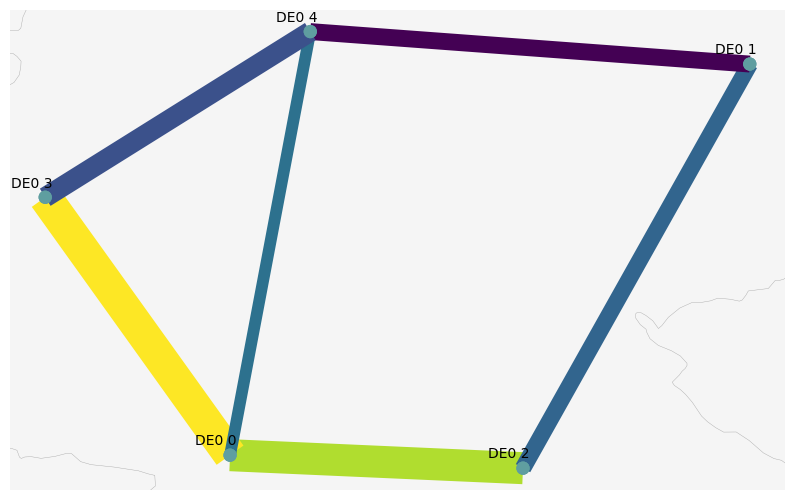

In [11]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [12]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


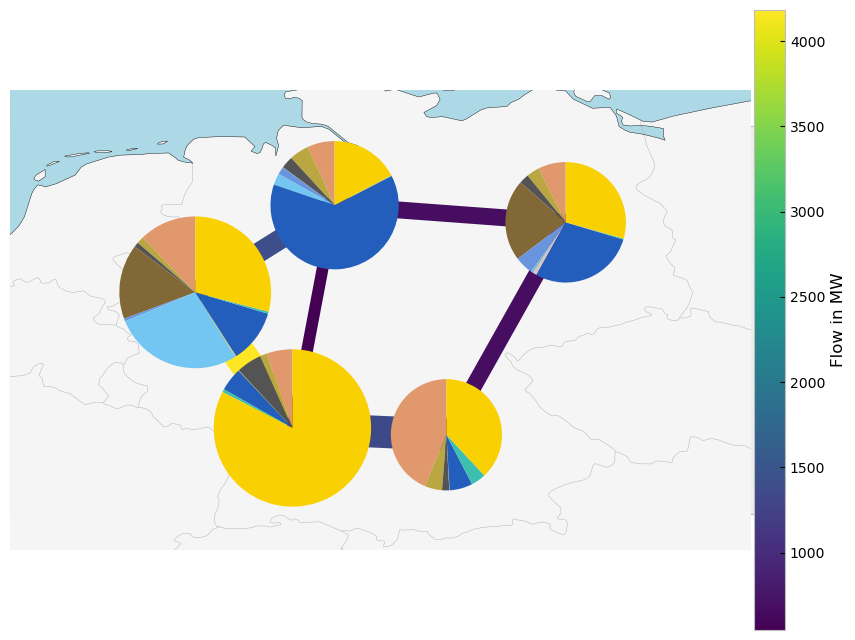

In [13]:
fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [14]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

#Adjust Load shedding's unit to MW from kW
#for column in n.generators_t.p.columns:
#    if column.endswith('load') and not column.endswith('H2 load'):
#        n.generators_t.p[column]/=1e3
        

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\971004373.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


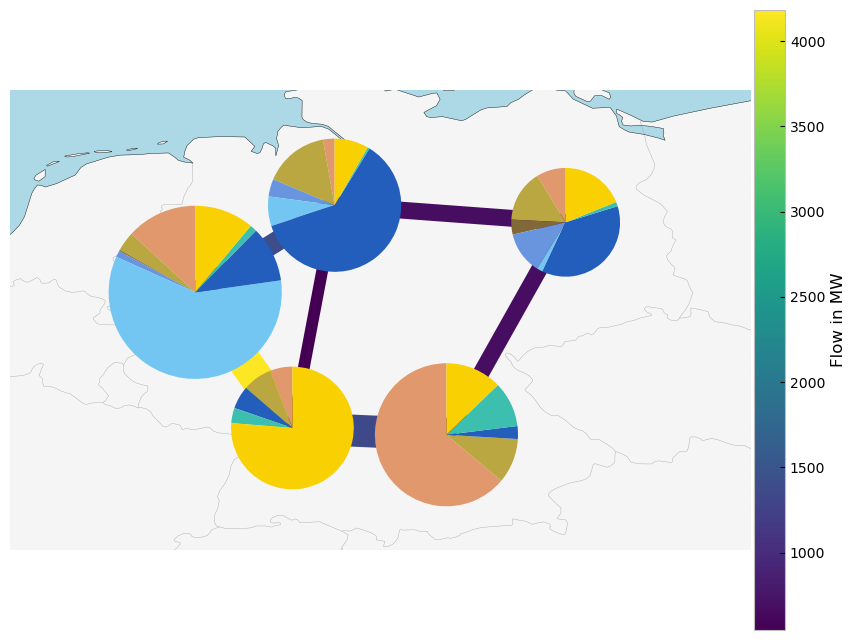

In [15]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

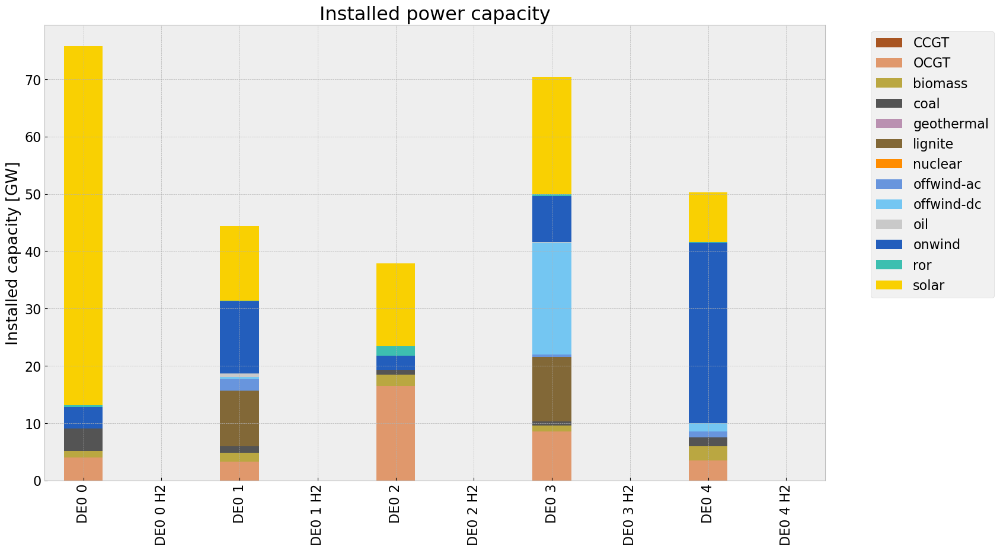

In [16]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)

## Generation

<Figure size 640x480 with 0 Axes>

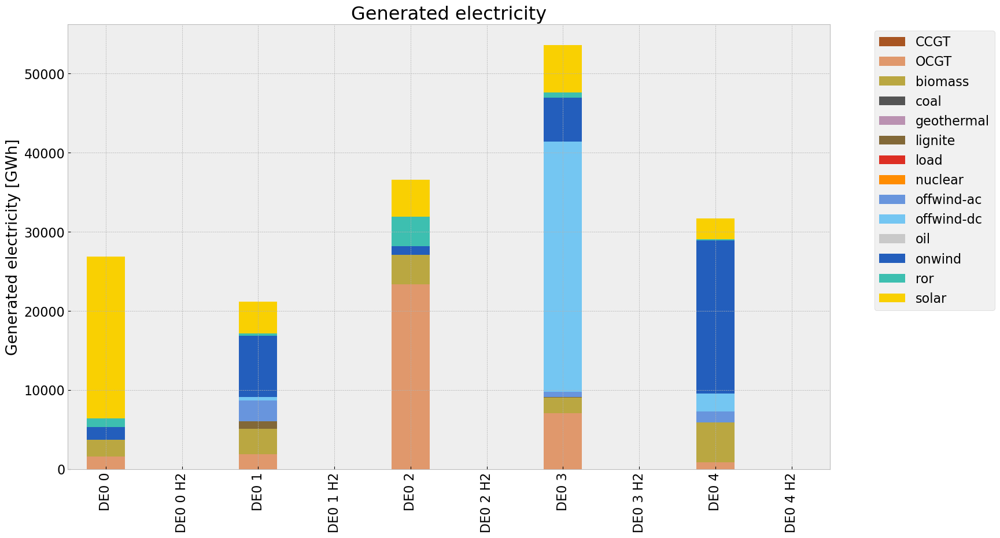

In [17]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated electricity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base = gen_power_table(n,colors_gen_table)

## Snapshot

In [18]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\3551839577.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\3551839577.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\3551839577.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()


In [19]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\3660868222.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [20]:
def gen_curve(n, start, end, colors):

    plt.rcParams.update({'font.size': 16})


    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
    #p_by_carrier['load'] /= 1e3

    #links fuel cell
    links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
    links = links.drop(columns='DC', inplace=False)
    links['H2 fuel cell']*=-1
       
    # join generator, links, and storage unit
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)     
        p_by_carrier = pd.concat([p_by_carrier, sto, links], axis=1)
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_no_H.where(p_no_H>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    loads = n.loads_t.p_set.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,150)

In [21]:
#e_balance = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2)
#e_balance.to_excel('energybalance.xlsx', index=True) 


In [22]:
#tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
#tes.to_csv('energybalance.csv', index=True)

In [23]:
#n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


In [24]:
#p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end=

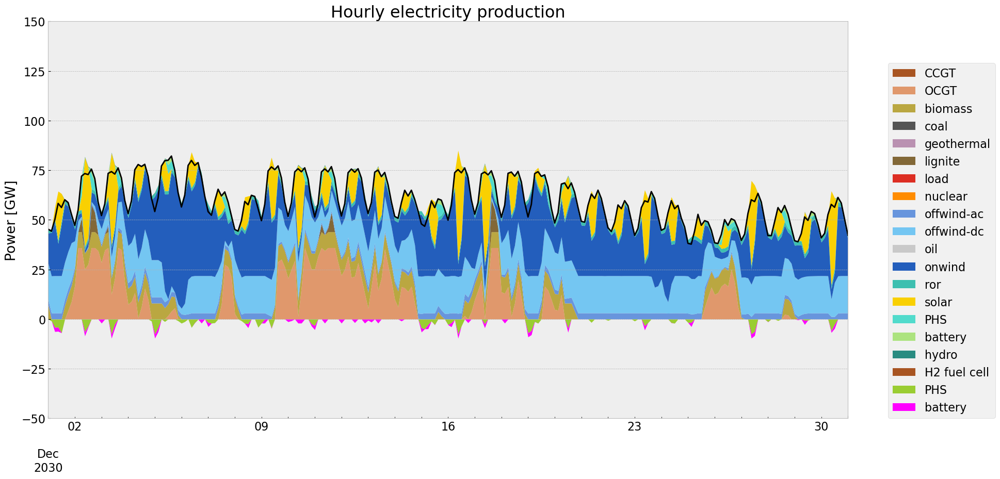

In [25]:
# winter
gen_curve(n, '2030-12-01', '2030-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end=

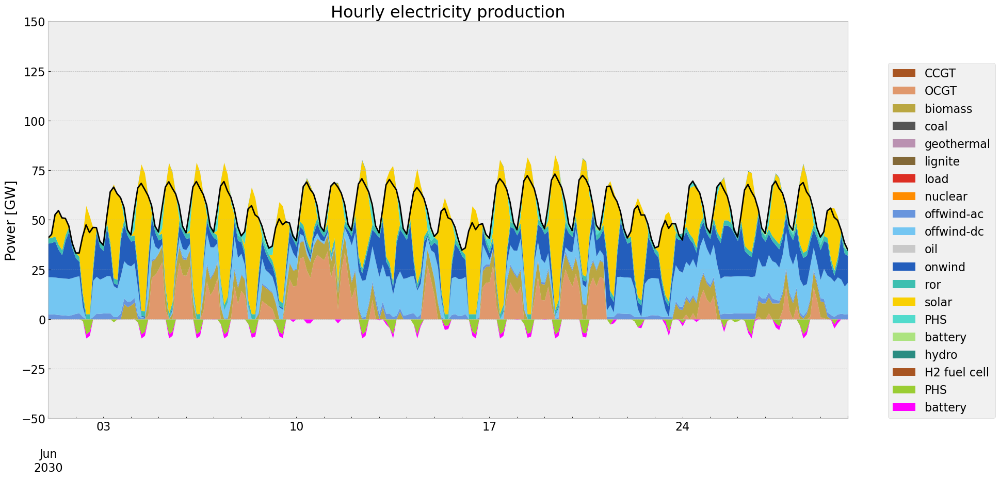

In [26]:
#summer
gen_curve(n, '2030-06-01', '2030-06-30', colors_gen)

## Storage

In [27]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                ylim=[0,20]
    )

    return n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000

carrier,PHS,battery,hydro
bus,,,
DE0 0,2.10300,0.000000,0.1200
DE0 1,0.99980,0.000000,NaN
DE0 2,1.85500,0.000000,0.1695
DE0 3,1.74142,2.054674,NaN
DE0 4,0.90000,0.000000,NaN


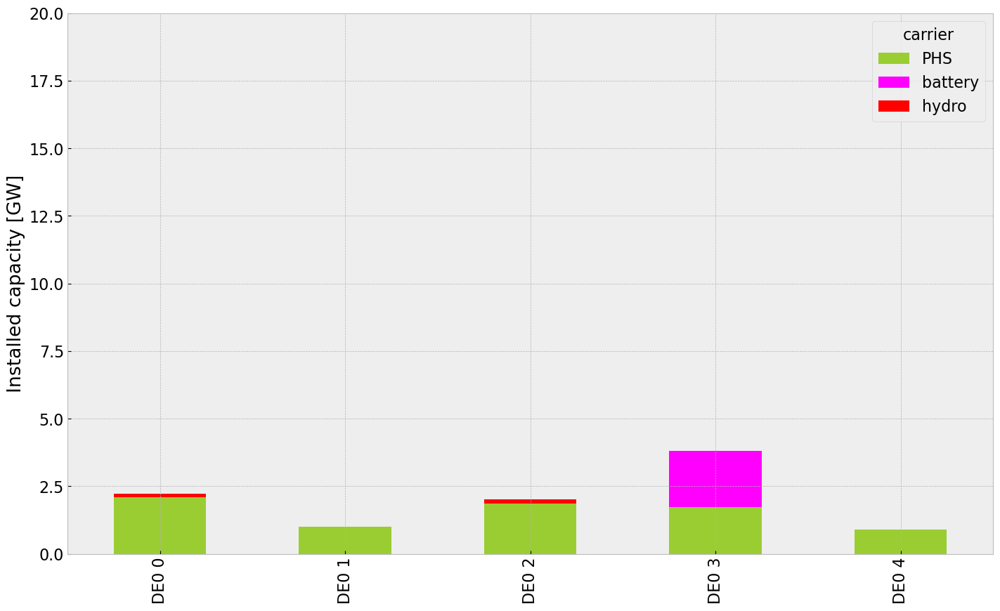

In [28]:
inst_store_table(n)

In [29]:
n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000

carrier,H2
bus,
DE0 0 H2,0.0
DE0 1 H2,0.0
DE0 2 H2,0.0
DE0 3 H2,0.0
DE0 4 H2,0.0


carrier,H2
bus,
DE0 0 H2,0.0
DE0 1 H2,0.0
DE0 2 H2,0.0
DE0 3 H2,0.0
DE0 4 H2,0.0


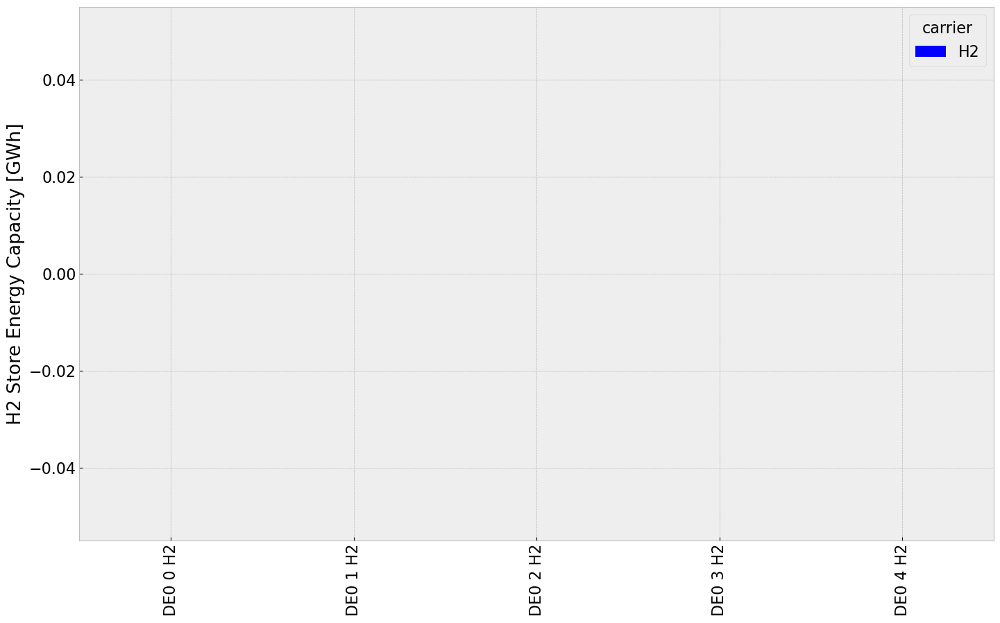

In [30]:
def inst_storeh2_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["blue"],
                                grid=True,
                                xlabel="",
                                ylabel="H2 Store Energy Capacity [GWh]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                #ylim=[0,7500]
    )

    return n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000

inst_storeh2_table(n)

In [31]:
n.stores

,bus,carrier,e_nom_extendable,e_cyclic,capital_cost,marginal_cost,build_year,e_nom_opt,type,e_nom,e_nom_mod,e_nom_min,e_nom_max,e_min_pu,e_max_pu,e_initial,e_initial_per_period,e_cyclic_per_period,p_set,q_set,sign,marginal_cost_quadratic,standing_loss,lifetime
Store,,,,,,,,,,,,,,,,,,,,,,,,
DE0 0 H2,DE0 0 H2,H2,True,True,148.31893,0.009302,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 1 H2,DE0 1 H2,H2,True,True,148.31893,0.009798,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 2 H2,DE0 2 H2,H2,True,True,148.31893,0.009482,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 3 H2,DE0 3 H2,H2,True,True,148.31893,0.009687,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 4 H2,DE0 4 H2,H2,True,True,148.31893,0.010026,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf


In [32]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        #title=f"State of charge of aggregated storage systems in Italy in {year}",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


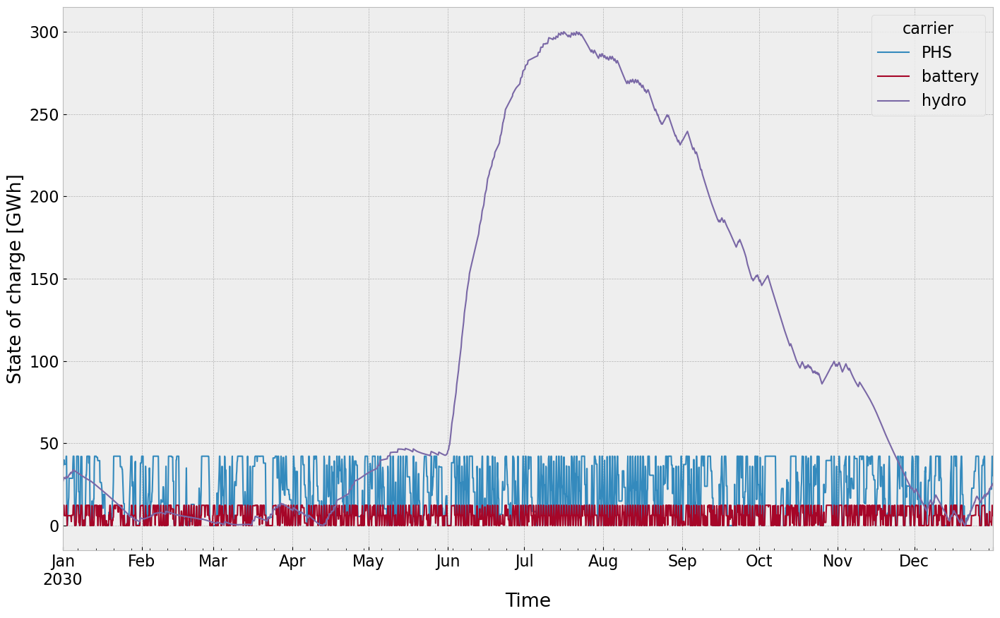

In [33]:
state_of_charge_plot(n)

## Electricity Price

In [34]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [35]:
columns_to_keep =[]

for i in n.buses_t.marginal_price.columns.tolist():
    if not i.endswith('H2'):
        columns_to_keep.append(i)
    


#buses without store
columns_to_keep =[]

price_dur_curve = pd.DataFrame()
for region in columns_to_keep:
    price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


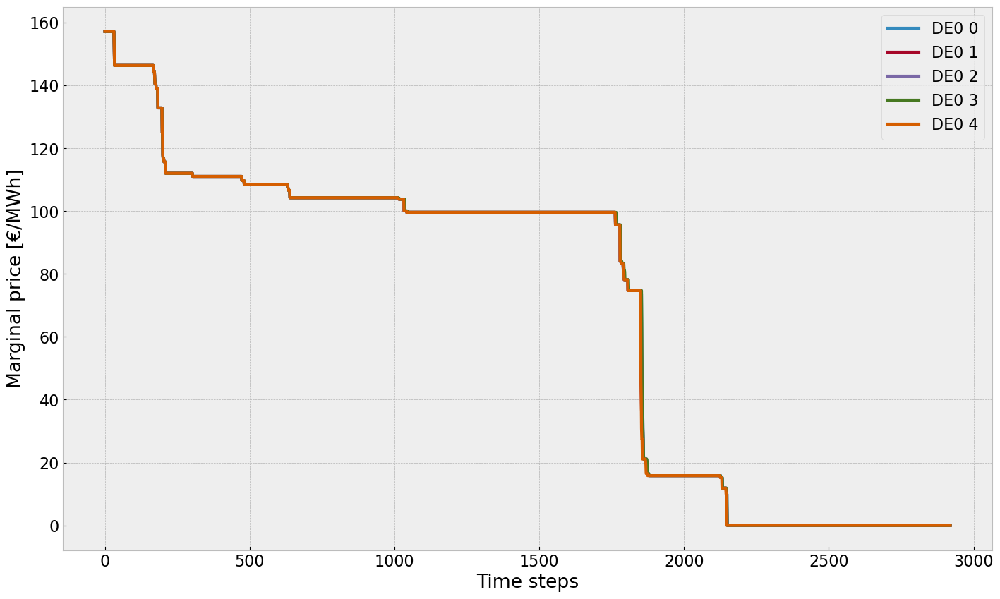

In [36]:
price_dur_curve_plot(n)

In [37]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    #for index, value in region.items():
    #    if index.endswith('H2'):
     #       region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

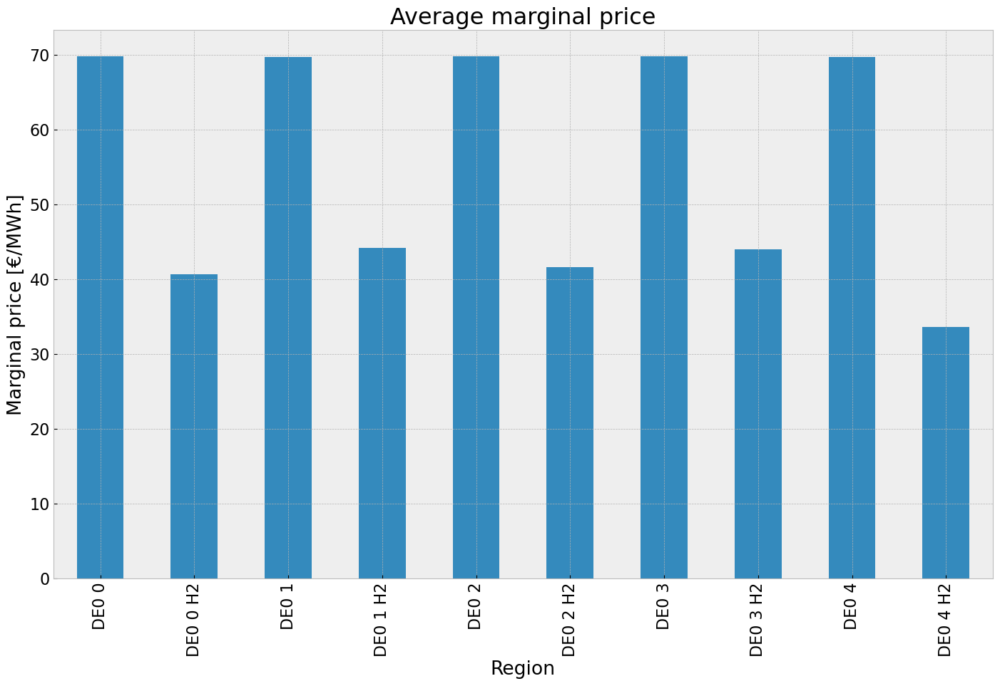

In [38]:
price_regions_table(n)

In [39]:
def price_regions(n):
    # Assuming 'n.buses_t.marginal_price' returns a DataFrame or similar structure with 'mean()' method
    mean_p = n.buses_t.marginal_price.mean()

    hprice = mean_p.filter(like='H2')
    eprice = mean_p.drop(hprice.index)

    # Setup figure and subplots with 1 row and 2 columns
    fig, axs = plt.subplots(1, 2, subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(16, 8))
    
    # Plot for hprice
    hprice_plot = axs[0].hexbin(
        n.buses.x.filter(like='H2'),  # Assuming n.buses.x and n.buses.y hold the coordinates
        n.buses.y.filter(like='H2'),
        gridsize=20,
        C=hprice,
        cmap=plt.cm.jet,
        zorder=3,
    )
    n.plot(ax=axs[0], line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the first subplot
    cb = fig.colorbar(hprice_plot, ax=axs[0], location="bottom")
    cb.set_label("Mean H2 Marginal Price (EUR/MWh) for H2")

    # Plot for eprice
    eprice_plot = axs[1].hexbin(
        n.buses.x[~n.buses.x.index.str.contains('H2')],
        n.buses.y[~n.buses.x.index.str.contains('H2')],
        gridsize=20,
        C=eprice,
        cmap=plt.cm.jet,
        zorder=3,
    )
    n.plot(ax=axs[1], line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the second subplot
    cb = fig.colorbar(eprice_plot, ax=axs[1], location="bottom")
    cb.set_label("Mean Electricity Marginal Price (EUR/MWh)")

    fig.tight_layout()

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


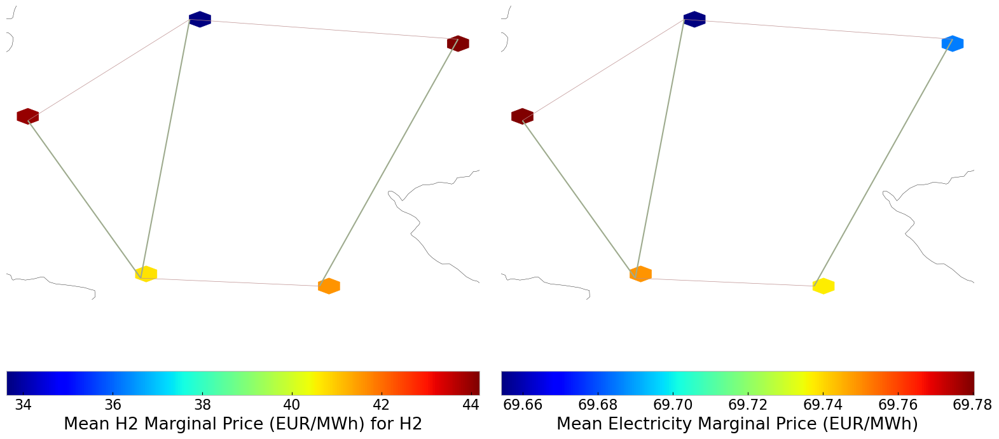

In [40]:
price_regions(n)

## Emission

In [41]:
def em_table(n):
    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack())#MWh

    #mean efficiency of each carrier
    eff = n.generators.groupby('carrier').efficiency.mean()

    e = generations.sum()
    emission = []

    for index in e.index:
        for index_c in n.carriers.index:
            for index_eff in eff.index:
                if index == index_c == index_eff:
                    em = n.carriers.loc[index_c,"co2_emissions"]
                    emission.append(em)

    df = e.to_frame()
    df.rename(columns={0: 'Generation in MWh'}, inplace=True)
    df['efficiency'] = eff
    df['emissions in Tonnes CO2/MWh'] = emission
    df['emissions in Tonnes CO2']= df['Generation in MWh']/df['efficiency']*df['emissions in Tonnes CO2/MWh']
    df['emissions in Tonnes CO2'].sum() 
    return df

em_base =em_table(n)
em_base

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,3.475453e+07,0.499437,0.1980,1.377831e+07
biomass,1.604494e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,1.067147e+06,0.358368,0.4069,1.211667e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,4.633218e+06,1.000000,0.0000,0.000000e+00


# Offwind Cut Scenario
Cut start: 01.01.2013 
Cut end: 30.11.2013
reduction on capacity: 100%


In [42]:
#copy network
n1=n.copy()

#p_max_pu of offwind generators across all regions are subtracted by 10% from 01.06.2013 to 31.12.13
cut_start=pd.to_datetime('2013-01-01 00:00:00')
cut_end = pd.to_datetime('2013-10-31 21:00:00')

for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('offwind-ac') or column.endswith('offwind-dc'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                if new_p_max_pu<0:
                                    n1.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']


#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

                        

## 1. Scenario: allow additional investment of extendable generators and storage

In [43]:
n1.optimize.create_model()


Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [44]:
#solve network
n1.optimize(solver_name='gurobi')

Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')
Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:01<00:00,  9.31it/s]
INFO:linopy.io: Writing time: 10.89s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lgkw60un.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lgkw60un.lp


Reading time = 3.14 seconds


INFO:gurobipy:Reading time = 3.14 seconds


obj: 849796 rows, 402989 columns, 1550697 nonzeros


INFO:gurobipy:obj: 849796 rows, 402989 columns, 1550697 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 849796 rows, 402989 columns and 1550697 nonzeros


INFO:gurobipy:Optimize a model with 849796 rows, 402989 columns and 1550697 nonzeros


Model fingerprint: 0xfb1dee9b


INFO:gurobipy:Model fingerprint: 0xfb1dee9b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 9e+09]


INFO:gurobipy:  Bounds range     [1e+01, 9e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 609749 rows and 116762 columns


INFO:gurobipy:Presolve removed 609749 rows and 116762 columns


Presolve time: 1.66s


INFO:gurobipy:Presolve time: 1.66s


Presolved: 240047 rows, 286227 columns, 853899 nonzeros


INFO:gurobipy:Presolved: 240047 rows, 286227 columns, 853899 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.38s


INFO:gurobipy:Ordering time: 0.38s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 45


INFO:gurobipy: Dense cols : 45


 AA' NZ     : 8.218e+05


INFO:gurobipy: AA' NZ     : 8.218e+05


 Factor NZ  : 4.637e+06 (roughly 250 MB of memory)


INFO:gurobipy: Factor NZ  : 4.637e+06 (roughly 250 MB of memory)


 Factor Ops : 3.939e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.939e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.38279810e+17 -1.33356692e+18  4.61e+09 4.31e+04  3.97e+13     3s


INFO:gurobipy:   0   1.38279810e+17 -1.33356692e+18  4.61e+09 4.31e+04  3.97e+13     3s


   1   1.26941593e+17 -4.79559750e+17  4.05e+09 1.36e+04  2.35e+13     3s


INFO:gurobipy:   1   1.26941593e+17 -4.79559750e+17  4.05e+09 1.36e+04  2.35e+13     3s


   2   1.07529747e+17 -3.30076802e+17  3.01e+09 8.02e+03  1.66e+13     4s


INFO:gurobipy:   2   1.07529747e+17 -3.30076802e+17  3.01e+09 8.02e+03  1.66e+13     4s


   3   8.45189177e+16 -1.22708501e+17  1.56e+09 1.63e+03  8.12e+12     5s


INFO:gurobipy:   3   8.45189177e+16 -1.22708501e+17  1.56e+09 1.63e+03  8.12e+12     5s


   4   4.13083220e+16 -1.75280151e+16  2.91e+08 2.49e+02  1.54e+12     5s


INFO:gurobipy:   4   4.13083220e+16 -1.75280151e+16  2.91e+08 2.49e+02  1.54e+12     5s


   5   7.28927389e+15 -2.67631554e+15  1.30e+07 3.60e+01  8.89e+10     6s


INFO:gurobipy:   5   7.28927389e+15 -2.67631554e+15  1.30e+07 3.60e+01  8.89e+10     6s


   6   1.29760732e+15 -3.09438639e+14  3.98e+05 3.13e+00  5.10e+09     6s


INFO:gurobipy:   6   1.29760732e+15 -3.09438639e+14  3.98e+05 3.13e+00  5.10e+09     6s


   7   2.64976454e+14 -7.01571330e+13  6.37e+04 1.19e-01  8.43e+08     7s


INFO:gurobipy:   7   2.64976454e+14 -7.01571330e+13  6.37e+04 1.19e-01  8.43e+08     7s


   8   1.77699990e+14 -2.16622560e+13  4.21e+04 4.42e-04  4.73e+08     7s


INFO:gurobipy:   8   1.77699990e+14 -2.16622560e+13  4.21e+04 4.42e-04  4.73e+08     7s


   9   2.85055029e+13 -1.32539375e+13  5.84e+03 2.14e-06  8.63e+07     7s


INFO:gurobipy:   9   2.85055029e+13 -1.32539375e+13  5.84e+03 2.14e-06  8.63e+07     7s


  10   1.09006588e+13 -2.44762649e+12  2.15e+03 6.62e-07  2.53e+07     8s


INFO:gurobipy:  10   1.09006588e+13 -2.44762649e+12  2.15e+03 6.62e-07  2.53e+07     8s


  11   2.03807374e+12 -5.22511098e+11  3.92e+02 3.68e-08  4.54e+06     8s


INFO:gurobipy:  11   2.03807374e+12 -5.22511098e+11  3.92e+02 3.68e-08  4.54e+06     8s


  12   1.70915159e+12 -4.24157334e+11  3.30e+02 2.68e-08  3.74e+06     9s


INFO:gurobipy:  12   1.70915159e+12 -4.24157334e+11  3.30e+02 2.68e-08  3.74e+06     9s


  13   8.67356390e+11 -2.98254650e+11  1.64e+02 1.65e-08  2.01e+06     9s


INFO:gurobipy:  13   8.67356390e+11 -2.98254650e+11  1.64e+02 1.65e-08  2.01e+06     9s


  14   6.48551015e+11 -2.55985332e+11  1.21e+02 1.51e-08  1.55e+06     9s


INFO:gurobipy:  14   6.48551015e+11 -2.55985332e+11  1.21e+02 1.51e-08  1.55e+06     9s


  15   5.15604072e+11 -2.35627389e+11  9.25e+01 1.37e-08  1.28e+06    10s


INFO:gurobipy:  15   5.15604072e+11 -2.35627389e+11  9.25e+01 1.37e-08  1.28e+06    10s


  16   3.25901256e+11 -1.81493923e+11  5.28e+01 1.07e-08  8.57e+05    10s


INFO:gurobipy:  16   3.25901256e+11 -1.81493923e+11  5.28e+01 1.07e-08  8.57e+05    10s


  17   2.87726698e+11 -1.51358605e+11  4.44e+01 8.91e-09  7.40e+05    11s


INFO:gurobipy:  17   2.87726698e+11 -1.51358605e+11  4.44e+01 8.91e-09  7.40e+05    11s


  18   2.22462488e+11 -1.30251326e+11  3.34e+01 7.94e-09  5.92e+05    11s


INFO:gurobipy:  18   2.22462488e+11 -1.30251326e+11  3.34e+01 7.94e-09  5.92e+05    11s


  19   1.68409220e+11 -8.52985768e+10  2.42e+01 6.50e-09  4.24e+05    12s


INFO:gurobipy:  19   1.68409220e+11 -8.52985768e+10  2.42e+01 6.50e-09  4.24e+05    12s


  20   1.18345452e+11 -5.70516311e+10  1.61e+01 4.14e-09  2.92e+05    13s


INFO:gurobipy:  20   1.18345452e+11 -5.70516311e+10  1.61e+01 4.14e-09  2.92e+05    13s


  21   8.32855149e+10 -2.20364544e+10  9.75e+00 2.78e-09  1.75e+05    13s


INFO:gurobipy:  21   8.32855149e+10 -2.20364544e+10  9.75e+00 2.78e-09  1.75e+05    13s


  22   7.56385149e+10 -3.41453757e+09  8.43e+00 1.66e-09  1.31e+05    14s


INFO:gurobipy:  22   7.56385149e+10 -3.41453757e+09  8.43e+00 1.66e-09  1.31e+05    14s


  23   6.04047587e+10  4.82718691e+09  5.82e+00 4.81e-10  9.21e+04    14s


INFO:gurobipy:  23   6.04047587e+10  4.82718691e+09  5.82e+00 4.81e-10  9.21e+04    14s


  24   5.31216523e+10  8.22352565e+09  4.51e+00 4.04e-09  7.43e+04    15s


INFO:gurobipy:  24   5.31216523e+10  8.22352565e+09  4.51e+00 4.04e-09  7.43e+04    15s


  25   4.92985537e+10  1.17294708e+10  3.78e+00 2.92e-09  6.22e+04    15s


INFO:gurobipy:  25   4.92985537e+10  1.17294708e+10  3.78e+00 2.92e-09  6.22e+04    15s


  26   4.28279480e+10  1.46439947e+10  2.72e+00 2.57e-09  4.66e+04    15s


INFO:gurobipy:  26   4.28279480e+10  1.46439947e+10  2.72e+00 2.57e-09  4.66e+04    15s


  27   3.83738071e+10  1.58354258e+10  1.91e+00 2.65e-09  3.73e+04    16s


INFO:gurobipy:  27   3.83738071e+10  1.58354258e+10  1.91e+00 2.65e-09  3.73e+04    16s


  28   3.60230447e+10  1.78200961e+10  1.47e+00 2.07e-09  3.01e+04    17s


INFO:gurobipy:  28   3.60230447e+10  1.78200961e+10  1.47e+00 2.07e-09  3.01e+04    17s


  29   3.44614993e+10  1.98840005e+10  1.14e+00 1.99e-09  2.41e+04    17s


INFO:gurobipy:  29   3.44614993e+10  1.98840005e+10  1.14e+00 1.99e-09  2.41e+04    17s


  30   3.30288946e+10  2.12763300e+10  8.67e-01 1.19e-09  1.94e+04    18s


INFO:gurobipy:  30   3.30288946e+10  2.12763300e+10  8.67e-01 1.19e-09  1.94e+04    18s


  31   3.19726390e+10  2.24869929e+10  6.60e-01 1.30e-09  1.57e+04    18s


INFO:gurobipy:  31   3.19726390e+10  2.24869929e+10  6.60e-01 1.30e-09  1.57e+04    18s


  32   3.11586839e+10  2.32147841e+10  5.00e-01 7.78e-10  1.31e+04    19s


INFO:gurobipy:  32   3.11586839e+10  2.32147841e+10  5.00e-01 7.78e-10  1.31e+04    19s


  33   3.07231200e+10  2.38394811e+10  4.18e-01 1.05e-09  1.14e+04    20s


INFO:gurobipy:  33   3.07231200e+10  2.38394811e+10  4.18e-01 1.05e-09  1.14e+04    20s


  34   3.01394085e+10  2.49510140e+10  3.11e-01 7.89e-10  8.57e+03    20s


INFO:gurobipy:  34   3.01394085e+10  2.49510140e+10  3.11e-01 7.89e-10  8.57e+03    20s


  35   2.98094574e+10  2.51779721e+10  2.54e-01 9.05e-10  7.65e+03    21s


INFO:gurobipy:  35   2.98094574e+10  2.51779721e+10  2.54e-01 9.05e-10  7.65e+03    21s


  36   2.95876898e+10  2.54391862e+10  2.17e-01 7.25e-10  6.86e+03    22s


INFO:gurobipy:  36   2.95876898e+10  2.54391862e+10  2.17e-01 7.25e-10  6.86e+03    22s


  37   2.94457327e+10  2.59593372e+10  1.93e-01 6.06e-10  5.76e+03    23s


INFO:gurobipy:  37   2.94457327e+10  2.59593372e+10  1.93e-01 6.06e-10  5.76e+03    23s


  38   2.93084318e+10  2.61031492e+10  1.71e-01 3.38e-10  5.30e+03    23s


INFO:gurobipy:  38   2.93084318e+10  2.61031492e+10  1.71e-01 3.38e-10  5.30e+03    23s


  39   2.91814546e+10  2.64120758e+10  1.51e-01 4.71e-10  4.58e+03    24s


INFO:gurobipy:  39   2.91814546e+10  2.64120758e+10  1.51e-01 4.71e-10  4.58e+03    24s


  40   2.88809742e+10  2.66718078e+10  1.04e-01 6.01e-10  3.65e+03    24s


INFO:gurobipy:  40   2.88809742e+10  2.66718078e+10  1.04e-01 6.01e-10  3.65e+03    24s


  41   2.87545429e+10  2.67849296e+10  8.48e-02 2.69e-10  3.25e+03    25s


INFO:gurobipy:  41   2.87545429e+10  2.67849296e+10  8.48e-02 2.69e-10  3.25e+03    25s


  42   2.86592535e+10  2.69406277e+10  7.03e-02 6.45e-10  2.84e+03    25s


INFO:gurobipy:  42   2.86592535e+10  2.69406277e+10  7.03e-02 6.45e-10  2.84e+03    25s


  43   2.85874408e+10  2.70364214e+10  5.97e-02 4.17e-10  2.56e+03    26s


INFO:gurobipy:  43   2.85874408e+10  2.70364214e+10  5.97e-02 4.17e-10  2.56e+03    26s


  44   2.85398624e+10  2.71251443e+10  5.26e-02 3.72e-10  2.34e+03    26s


INFO:gurobipy:  44   2.85398624e+10  2.71251443e+10  5.26e-02 3.72e-10  2.34e+03    26s


  45   2.85026083e+10  2.71894929e+10  4.73e-02 4.23e-10  2.17e+03    27s


INFO:gurobipy:  45   2.85026083e+10  2.71894929e+10  4.73e-02 4.23e-10  2.17e+03    27s


  46   2.84667183e+10  2.72466571e+10  4.22e-02 2.41e-10  2.02e+03    27s


INFO:gurobipy:  46   2.84667183e+10  2.72466571e+10  4.22e-02 2.41e-10  2.02e+03    27s


  47   2.84294175e+10  2.73270873e+10  3.71e-02 2.55e-10  1.82e+03    28s


INFO:gurobipy:  47   2.84294175e+10  2.73270873e+10  3.71e-02 2.55e-10  1.82e+03    28s


  48   2.83899206e+10  2.74241981e+10  3.19e-02 4.20e-10  1.60e+03    28s


INFO:gurobipy:  48   2.83899206e+10  2.74241981e+10  3.19e-02 4.20e-10  1.60e+03    28s


  49   2.83458467e+10  2.74615431e+10  2.62e-02 3.09e-10  1.46e+03    29s


INFO:gurobipy:  49   2.83458467e+10  2.74615431e+10  2.62e-02 3.09e-10  1.46e+03    29s


  50   2.83216625e+10  2.74930739e+10  2.32e-02 2.30e-10  1.37e+03    29s


INFO:gurobipy:  50   2.83216625e+10  2.74930739e+10  2.32e-02 2.30e-10  1.37e+03    29s


  51   2.83074989e+10  2.76238072e+10  2.14e-02 5.03e-10  1.13e+03    30s


INFO:gurobipy:  51   2.83074989e+10  2.76238072e+10  2.14e-02 5.03e-10  1.13e+03    30s


  52   2.82854278e+10  2.76682041e+10  1.87e-02 4.12e-10  1.02e+03    31s


INFO:gurobipy:  52   2.82854278e+10  2.76682041e+10  1.87e-02 4.12e-10  1.02e+03    31s


  53   2.82665930e+10  2.77069057e+10  1.65e-02 2.08e-10  9.25e+02    31s


INFO:gurobipy:  53   2.82665930e+10  2.77069057e+10  1.65e-02 2.08e-10  9.25e+02    31s


  54   2.82520285e+10  2.77687558e+10  1.46e-02 1.88e-10  7.99e+02    32s


INFO:gurobipy:  54   2.82520285e+10  2.77687558e+10  1.46e-02 1.88e-10  7.99e+02    32s


  55   2.82341542e+10  2.77979305e+10  1.26e-02 2.96e-10  7.21e+02    32s


INFO:gurobipy:  55   2.82341542e+10  2.77979305e+10  1.26e-02 2.96e-10  7.21e+02    32s


  56   2.82290350e+10  2.78155099e+10  1.20e-02 1.89e-10  6.83e+02    33s


INFO:gurobipy:  56   2.82290350e+10  2.78155099e+10  1.20e-02 1.89e-10  6.83e+02    33s


  57   2.82141854e+10  2.78439641e+10  1.04e-02 2.17e-10  6.12e+02    33s


INFO:gurobipy:  57   2.82141854e+10  2.78439641e+10  1.04e-02 2.17e-10  6.12e+02    33s


  58   2.82051290e+10  2.78572215e+10  9.35e-03 2.55e-10  5.75e+02    34s


INFO:gurobipy:  58   2.82051290e+10  2.78572215e+10  9.35e-03 2.55e-10  5.75e+02    34s


  59   2.81940580e+10  2.78802931e+10  8.16e-03 4.29e-10  5.18e+02    34s


INFO:gurobipy:  59   2.81940580e+10  2.78802931e+10  8.16e-03 4.29e-10  5.18e+02    34s


  60   2.81849935e+10  2.79103133e+10  7.17e-03 2.62e-10  4.54e+02    35s


INFO:gurobipy:  60   2.81849935e+10  2.79103133e+10  7.17e-03 2.62e-10  4.54e+02    35s


  61   2.81790322e+10  2.79244260e+10  6.49e-03 3.40e-10  4.21e+02    35s


INFO:gurobipy:  61   2.81790322e+10  2.79244260e+10  6.49e-03 3.40e-10  4.21e+02    35s


  62   2.81718769e+10  2.79308621e+10  5.61e-03 1.48e-10  3.98e+02    36s


INFO:gurobipy:  62   2.81718769e+10  2.79308621e+10  5.61e-03 1.48e-10  3.98e+02    36s


  63   2.81702172e+10  2.79426808e+10  5.42e-03 3.18e-10  3.76e+02    36s


INFO:gurobipy:  63   2.81702172e+10  2.79426808e+10  5.42e-03 3.18e-10  3.76e+02    36s


  64   2.81676954e+10  2.79455317e+10  5.11e-03 2.36e-10  3.67e+02    37s


INFO:gurobipy:  64   2.81676954e+10  2.79455317e+10  5.11e-03 2.36e-10  3.67e+02    37s


  65   2.81622994e+10  2.79597850e+10  4.48e-03 1.97e-10  3.35e+02    37s


INFO:gurobipy:  65   2.81622994e+10  2.79597850e+10  4.48e-03 1.97e-10  3.35e+02    37s


  66   2.81568349e+10  2.79681740e+10  3.85e-03 2.06e-10  3.12e+02    38s


INFO:gurobipy:  66   2.81568349e+10  2.79681740e+10  3.85e-03 2.06e-10  3.12e+02    38s


  67   2.81503250e+10  2.79758522e+10  3.13e-03 5.57e-10  2.88e+02    38s


INFO:gurobipy:  67   2.81503250e+10  2.79758522e+10  3.13e-03 5.57e-10  2.88e+02    38s


  68   2.81497624e+10  2.79841825e+10  3.08e-03 2.43e-10  2.74e+02    39s


INFO:gurobipy:  68   2.81497624e+10  2.79841825e+10  3.08e-03 2.43e-10  2.74e+02    39s


  69   2.81465538e+10  2.80036982e+10  2.76e-03 1.93e-10  2.36e+02    39s


INFO:gurobipy:  69   2.81465538e+10  2.80036982e+10  2.76e-03 1.93e-10  2.36e+02    39s


  70   2.81446890e+10  2.80109617e+10  2.55e-03 4.34e-10  2.21e+02    40s


INFO:gurobipy:  70   2.81446890e+10  2.80109617e+10  2.55e-03 4.34e-10  2.21e+02    40s


  71   2.81417626e+10  2.80164668e+10  2.26e-03 1.44e-10  2.07e+02    40s


INFO:gurobipy:  71   2.81417626e+10  2.80164668e+10  2.26e-03 1.44e-10  2.07e+02    40s


  72   2.81402010e+10  2.80267546e+10  2.05e-03 9.31e-11  1.87e+02    41s


INFO:gurobipy:  72   2.81402010e+10  2.80267546e+10  2.05e-03 9.31e-11  1.87e+02    41s


  73   2.81375667e+10  2.80333145e+10  1.78e-03 2.54e-10  1.72e+02    41s


INFO:gurobipy:  73   2.81375667e+10  2.80333145e+10  1.78e-03 2.54e-10  1.72e+02    41s


  74   2.81363517e+10  2.80382825e+10  1.63e-03 3.22e-10  1.62e+02    41s


INFO:gurobipy:  74   2.81363517e+10  2.80382825e+10  1.63e-03 3.22e-10  1.62e+02    41s


  75   2.81352940e+10  2.80486630e+10  1.50e-03 2.26e-10  1.43e+02    42s


INFO:gurobipy:  75   2.81352940e+10  2.80486630e+10  1.50e-03 2.26e-10  1.43e+02    42s


  76   2.81339185e+10  2.80499685e+10  1.37e-03 1.04e-10  1.39e+02    42s


INFO:gurobipy:  76   2.81339185e+10  2.80499685e+10  1.37e-03 1.04e-10  1.39e+02    42s


  77   2.81323660e+10  2.80573916e+10  1.19e-03 2.55e-10  1.24e+02    43s


INFO:gurobipy:  77   2.81323660e+10  2.80573916e+10  1.19e-03 2.55e-10  1.24e+02    43s


  78   2.81311021e+10  2.80627216e+10  1.07e-03 1.28e-10  1.13e+02    43s


INFO:gurobipy:  78   2.81311021e+10  2.80627216e+10  1.07e-03 1.28e-10  1.13e+02    43s


  79   2.81300447e+10  2.80665838e+10  9.56e-04 2.23e-10  1.05e+02    44s


INFO:gurobipy:  79   2.81300447e+10  2.80665838e+10  9.56e-04 2.23e-10  1.05e+02    44s


  80   2.81296486e+10  2.80700536e+10  9.07e-04 3.18e-10  9.85e+01    45s


INFO:gurobipy:  80   2.81296486e+10  2.80700536e+10  9.07e-04 3.18e-10  9.85e+01    45s


  81   2.81283855e+10  2.80777977e+10  7.75e-04 2.31e-10  8.36e+01    45s


INFO:gurobipy:  81   2.81283855e+10  2.80777977e+10  7.75e-04 2.31e-10  8.36e+01    45s


  82   2.81275335e+10  2.80800439e+10  6.87e-04 1.93e-10  7.85e+01    45s


INFO:gurobipy:  82   2.81275335e+10  2.80800439e+10  6.87e-04 1.93e-10  7.85e+01    45s


  83   2.81269468e+10  2.80833706e+10  6.36e-04 1.29e-10  7.20e+01    46s


INFO:gurobipy:  83   2.81269468e+10  2.80833706e+10  6.36e-04 1.29e-10  7.20e+01    46s


  84   2.81264116e+10  2.80854725e+10  5.80e-04 2.54e-10  6.76e+01    46s


INFO:gurobipy:  84   2.81264116e+10  2.80854725e+10  5.80e-04 2.54e-10  6.76e+01    46s


  85   2.81258237e+10  2.80914211e+10  5.12e-04 1.48e-10  5.68e+01    47s


INFO:gurobipy:  85   2.81258237e+10  2.80914211e+10  5.12e-04 1.48e-10  5.68e+01    47s


  86   2.81251874e+10  2.80944997e+10  4.47e-04 1.73e-10  5.07e+01    47s


INFO:gurobipy:  86   2.81251874e+10  2.80944997e+10  4.47e-04 1.73e-10  5.07e+01    47s


  87   2.81245048e+10  2.80951953e+10  3.81e-04 2.02e-10  4.84e+01    48s


INFO:gurobipy:  87   2.81245048e+10  2.80951953e+10  3.81e-04 2.02e-10  4.84e+01    48s


  88   2.81241002e+10  2.80981710e+10  3.42e-04 3.05e-10  4.28e+01    48s


INFO:gurobipy:  88   2.81241002e+10  2.80981710e+10  3.42e-04 3.05e-10  4.28e+01    48s


  89   2.81238784e+10  2.80987845e+10  3.20e-04 2.60e-10  4.15e+01    49s


INFO:gurobipy:  89   2.81238784e+10  2.80987845e+10  3.20e-04 2.60e-10  4.15e+01    49s


  90   2.81231932e+10  2.81012705e+10  2.43e-04 1.95e-10  3.62e+01    49s


INFO:gurobipy:  90   2.81231932e+10  2.81012705e+10  2.43e-04 1.95e-10  3.62e+01    49s


  91   2.81231001e+10  2.81015378e+10  2.34e-04 2.06e-10  3.56e+01    50s


INFO:gurobipy:  91   2.81231001e+10  2.81015378e+10  2.34e-04 2.06e-10  3.56e+01    50s


  92   2.81229346e+10  2.81038748e+10  2.18e-04 2.24e-10  3.15e+01    50s


INFO:gurobipy:  92   2.81229346e+10  2.81038748e+10  2.18e-04 2.24e-10  3.15e+01    50s


  93   2.81225554e+10  2.81056640e+10  1.81e-04 2.64e-10  2.79e+01    51s


INFO:gurobipy:  93   2.81225554e+10  2.81056640e+10  1.81e-04 2.64e-10  2.79e+01    51s


  94   2.81222343e+10  2.81095489e+10  1.50e-04 1.33e-10  2.10e+01    51s


INFO:gurobipy:  94   2.81222343e+10  2.81095489e+10  1.50e-04 1.33e-10  2.10e+01    51s


  95   2.81219255e+10  2.81102170e+10  1.24e-04 1.55e-10  1.93e+01    52s


INFO:gurobipy:  95   2.81219255e+10  2.81102170e+10  1.24e-04 1.55e-10  1.93e+01    52s


  96   2.81216724e+10  2.81122476e+10  1.02e-04 5.22e-10  1.56e+01    52s


INFO:gurobipy:  96   2.81216724e+10  2.81122476e+10  1.02e-04 5.22e-10  1.56e+01    52s


  97   2.81214279e+10  2.81152691e+10  8.07e-05 3.50e-10  1.02e+01    53s


INFO:gurobipy:  97   2.81214279e+10  2.81152691e+10  8.07e-05 3.50e-10  1.02e+01    53s


  98   2.81213317e+10  2.81154572e+10  7.25e-05 2.53e-10  9.71e+00    54s


INFO:gurobipy:  98   2.81213317e+10  2.81154572e+10  7.25e-05 2.53e-10  9.71e+00    54s


  99   2.81211852e+10  2.81159436e+10  6.11e-05 3.54e-10  8.66e+00    54s


INFO:gurobipy:  99   2.81211852e+10  2.81159436e+10  6.11e-05 3.54e-10  8.66e+00    54s


 100   2.81210789e+10  2.81161298e+10  5.31e-05 3.34e-10  8.18e+00    54s


INFO:gurobipy: 100   2.81210789e+10  2.81161298e+10  5.31e-05 3.34e-10  8.18e+00    54s


 101   2.81210408e+10  2.81162815e+10  5.02e-05 2.07e-10  7.86e+00    55s


INFO:gurobipy: 101   2.81210408e+10  2.81162815e+10  5.02e-05 2.07e-10  7.86e+00    55s


 102   2.81209258e+10  2.81171644e+10  4.15e-05 5.35e-10  6.22e+00    55s


INFO:gurobipy: 102   2.81209258e+10  2.81171644e+10  4.15e-05 5.35e-10  6.22e+00    55s


 103   2.81208642e+10  2.81174787e+10  3.72e-05 2.60e-10  5.59e+00    56s


INFO:gurobipy: 103   2.81208642e+10  2.81174787e+10  3.72e-05 2.60e-10  5.59e+00    56s


 104   2.81207799e+10  2.81181262e+10  3.92e-05 2.30e-10  4.39e+00    56s


INFO:gurobipy: 104   2.81207799e+10  2.81181262e+10  3.92e-05 2.30e-10  4.39e+00    56s


 105   2.81207507e+10  2.81183280e+10  3.68e-05 4.99e-10  4.00e+00    57s


INFO:gurobipy: 105   2.81207507e+10  2.81183280e+10  3.68e-05 4.99e-10  4.00e+00    57s


 106   2.81206932e+10  2.81187087e+10  3.49e-05 3.19e-10  3.28e+00    57s


INFO:gurobipy: 106   2.81206932e+10  2.81187087e+10  3.49e-05 3.19e-10  3.28e+00    57s


 107   2.81206093e+10  2.81192112e+10  2.66e-05 5.35e-10  2.31e+00    58s


INFO:gurobipy: 107   2.81206093e+10  2.81192112e+10  2.66e-05 5.35e-10  2.31e+00    58s


 108   2.81205825e+10  2.81193739e+10  2.51e-05 4.98e-10  2.00e+00    58s


INFO:gurobipy: 108   2.81205825e+10  2.81193739e+10  2.51e-05 4.98e-10  2.00e+00    58s


 109   2.81205578e+10  2.81194246e+10  2.31e-05 3.14e-10  1.87e+00    59s


INFO:gurobipy: 109   2.81205578e+10  2.81194246e+10  2.31e-05 3.14e-10  1.87e+00    59s


 110   2.81205376e+10  2.81194835e+10  2.16e-05 3.54e-10  1.74e+00    60s


INFO:gurobipy: 110   2.81205376e+10  2.81194835e+10  2.16e-05 3.54e-10  1.74e+00    60s


 111   2.81205190e+10  2.81196721e+10  2.02e-05 3.57e-10  1.40e+00    60s


INFO:gurobipy: 111   2.81205190e+10  2.81196721e+10  2.02e-05 3.57e-10  1.40e+00    60s


 112   2.81204629e+10  2.81197525e+10  2.54e-05 6.11e-10  1.17e+00    61s


INFO:gurobipy: 112   2.81204629e+10  2.81197525e+10  2.54e-05 6.11e-10  1.17e+00    61s


 113   2.81204157e+10  2.81198283e+10  2.00e-05 4.36e-10  9.71e-01    62s


INFO:gurobipy: 113   2.81204157e+10  2.81198283e+10  2.00e-05 4.36e-10  9.71e-01    62s


 114   2.81203929e+10  2.81198766e+10  1.71e-05 3.15e-10  8.53e-01    63s


INFO:gurobipy: 114   2.81203929e+10  2.81198766e+10  1.71e-05 3.15e-10  8.53e-01    63s


 115   2.81203777e+10  2.81199474e+10  1.54e-05 4.25e-10  7.11e-01    63s


INFO:gurobipy: 115   2.81203777e+10  2.81199474e+10  1.54e-05 4.25e-10  7.11e-01    63s


 116   2.81203728e+10  2.81199500e+10  1.48e-05 5.01e-10  6.99e-01    64s


INFO:gurobipy: 116   2.81203728e+10  2.81199500e+10  1.48e-05 5.01e-10  6.99e-01    64s


 117   2.81203477e+10  2.81200418e+10  1.20e-05 2.12e-10  5.05e-01    65s


INFO:gurobipy: 117   2.81203477e+10  2.81200418e+10  1.20e-05 2.12e-10  5.05e-01    65s


 118   2.81203313e+10  2.81200682e+10  1.02e-05 4.67e-10  4.35e-01    65s


INFO:gurobipy: 118   2.81203313e+10  2.81200682e+10  1.02e-05 4.67e-10  4.35e-01    65s


 119   2.81203155e+10  2.81200934e+10  8.50e-06 2.75e-10  3.67e-01    66s


INFO:gurobipy: 119   2.81203155e+10  2.81200934e+10  8.50e-06 2.75e-10  3.67e-01    66s


 120   2.81202875e+10  2.81201485e+10  5.35e-06 2.84e-10  2.30e-01    67s


INFO:gurobipy: 120   2.81202875e+10  2.81201485e+10  5.35e-06 2.84e-10  2.30e-01    67s


 121   2.81202787e+10  2.81201574e+10  4.40e-06 2.11e-10  2.00e-01    67s


INFO:gurobipy: 121   2.81202787e+10  2.81201574e+10  4.40e-06 2.11e-10  2.00e-01    67s


 122   2.81202647e+10  2.81201827e+10  2.90e-06 2.55e-10  1.36e-01    68s


INFO:gurobipy: 122   2.81202647e+10  2.81201827e+10  2.90e-06 2.55e-10  1.36e-01    68s


 123   2.81202571e+10  2.81202046e+10  2.08e-06 3.75e-10  8.67e-02    69s


INFO:gurobipy: 123   2.81202571e+10  2.81202046e+10  2.08e-06 3.75e-10  8.67e-02    69s


 124   2.81202490e+10  2.81202107e+10  1.28e-06 2.54e-10  6.34e-02    70s


INFO:gurobipy: 124   2.81202490e+10  2.81202107e+10  1.28e-06 2.54e-10  6.34e-02    70s


 125   2.81202459e+10  2.81202219e+10  9.84e-07 2.30e-10  3.97e-02    70s


INFO:gurobipy: 125   2.81202459e+10  2.81202219e+10  9.84e-07 2.30e-10  3.97e-02    70s


 126   2.81202435e+10  2.81202246e+10  7.50e-07 1.66e-10  3.12e-02    71s


INFO:gurobipy: 126   2.81202435e+10  2.81202246e+10  7.50e-07 1.66e-10  3.12e-02    71s


 127   2.81202410e+10  2.81202284e+10  5.14e-07 1.03e-09  2.08e-02    71s


INFO:gurobipy: 127   2.81202410e+10  2.81202284e+10  5.14e-07 1.03e-09  2.08e-02    71s


 128   2.81202395e+10  2.81202314e+10  3.74e-07 5.03e-10  1.34e-02    72s


INFO:gurobipy: 128   2.81202395e+10  2.81202314e+10  3.74e-07 5.03e-10  1.34e-02    72s


 129   2.81202381e+10  2.81202325e+10  2.36e-07 9.37e-11  9.13e-03    72s


INFO:gurobipy: 129   2.81202381e+10  2.81202325e+10  2.36e-07 9.37e-11  9.13e-03    72s


 130   2.81202371e+10  2.81202339e+10  1.45e-07 3.21e-10  5.26e-03    73s


INFO:gurobipy: 130   2.81202371e+10  2.81202339e+10  1.45e-07 3.21e-10  5.26e-03    73s


 131   2.81202367e+10  2.81202344e+10  5.12e-07 1.50e-10  3.81e-03    74s


INFO:gurobipy: 131   2.81202367e+10  2.81202344e+10  5.12e-07 1.50e-10  3.81e-03    74s


 132   2.81202362e+10  2.81202349e+10  4.44e-07 2.47e-10  2.25e-03    74s


INFO:gurobipy: 132   2.81202362e+10  2.81202349e+10  4.44e-07 2.47e-10  2.25e-03    74s


 133   2.81202358e+10  2.81202352e+10  1.07e-04 6.09e-10  1.11e-03    75s


INFO:gurobipy: 133   2.81202358e+10  2.81202352e+10  1.07e-04 6.09e-10  1.11e-03    75s


 134   2.81202356e+10  2.81202353e+10  4.34e-04 1.67e-09  5.11e-04    75s


INFO:gurobipy: 134   2.81202356e+10  2.81202353e+10  4.34e-04 1.67e-09  5.11e-04    75s


 135   2.81202355e+10  2.81202353e+10  2.32e-04 1.31e-09  2.82e-04    75s


INFO:gurobipy: 135   2.81202355e+10  2.81202353e+10  2.32e-04 1.31e-09  2.82e-04    75s


INFO:gurobipy:


Barrier solved model in 135 iterations and 75.43 seconds (24.17 work units)


INFO:gurobipy:Barrier solved model in 135 iterations and 75.43 seconds (24.17 work units)


Optimal objective 2.81202355e+10


INFO:gurobipy:Optimal objective 2.81202355e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   95526 DPushes remaining with DInf 0.0000000e+00                76s


INFO:gurobipy:   95526 DPushes remaining with DInf 0.0000000e+00                76s


       0 DPushes remaining with DInf 0.0000000e+00                80s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                80s


INFO:gurobipy:


  180520 PPushes remaining with PInf 3.9673814e-04                80s


INFO:gurobipy:  180520 PPushes remaining with PInf 3.9673814e-04                80s


   26948 PPushes remaining with PInf 2.9596613e-01                85s


INFO:gurobipy:   26948 PPushes remaining with PInf 2.9596613e-01                85s


    2141 PPushes remaining with PInf 3.7409343e-01                90s


INFO:gurobipy:    2141 PPushes remaining with PInf 3.7409343e-01                90s


       0 PPushes remaining with PInf 0.0000000e+00                91s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                91s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.6712040e+05     91s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.6712040e+05     91s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  240123    2.8120235e+10   0.000000e+00   3.671204e+05     91s


INFO:gurobipy:  240123    2.8120235e+10   0.000000e+00   3.671204e+05     91s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  242199    2.8120235e+10   0.000000e+00   0.000000e+00     95s


INFO:gurobipy:  242199    2.8120235e+10   0.000000e+00   0.000000e+00     95s


INFO:gurobipy:


Solved in 242199 iterations and 95.46 seconds (31.48 work units)


INFO:gurobipy:Solved in 242199 iterations and 95.46 seconds (31.48 work units)


Optimal objective  2.812023542e+10


INFO:gurobipy:Optimal objective  2.812023542e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 402989 primals, 849796 duals
Objective: 2.81e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [45]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

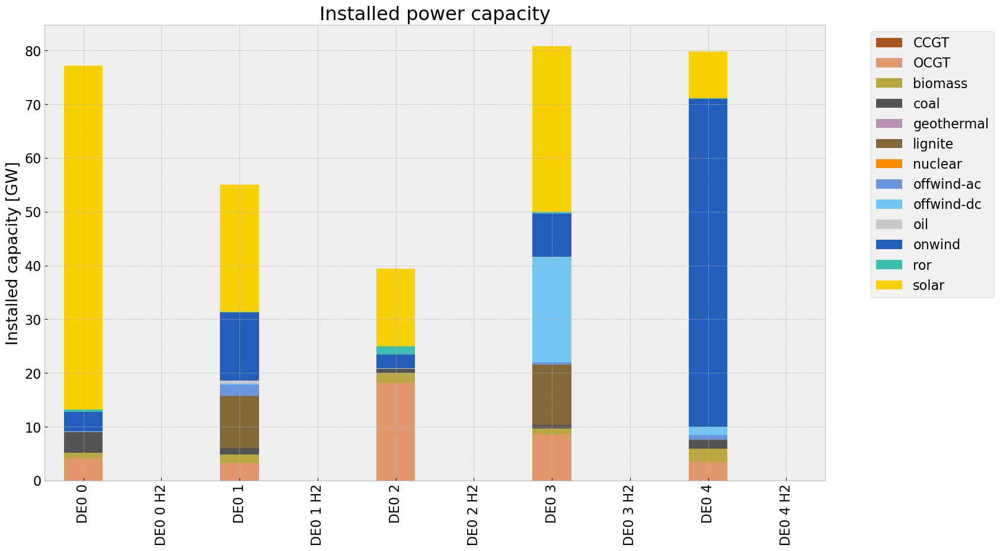

In [46]:
# consolidated istalled cap without load_shedding

capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_inv.fillna(0, inplace=True)
gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_inv = inst_cap_table(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

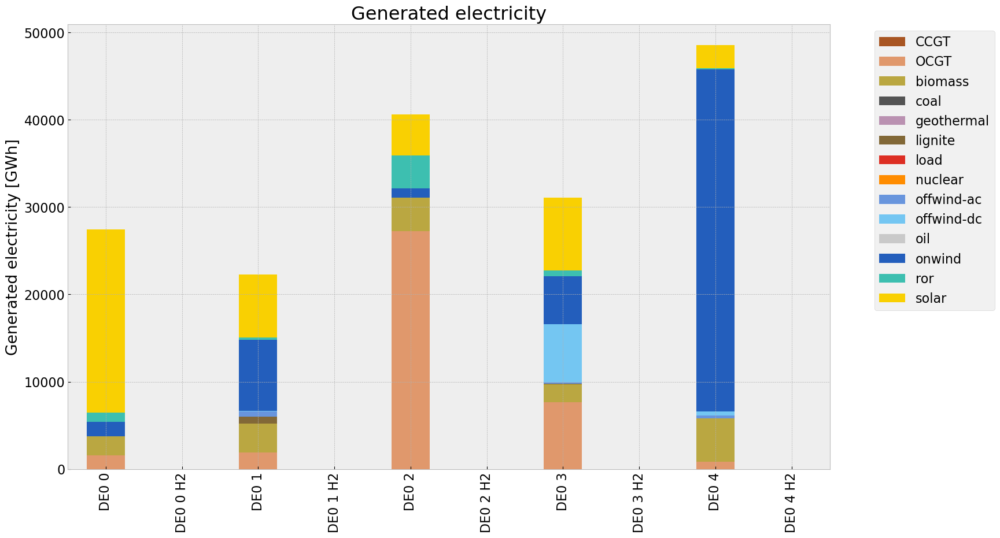

In [47]:
# consolidated generation table
carrier = n1.generators.carrier.unique()
df_tot_generation = n1.generators_t.p.sum()

generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
                
generations.fillna(0, inplace=True)
gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)



## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end=

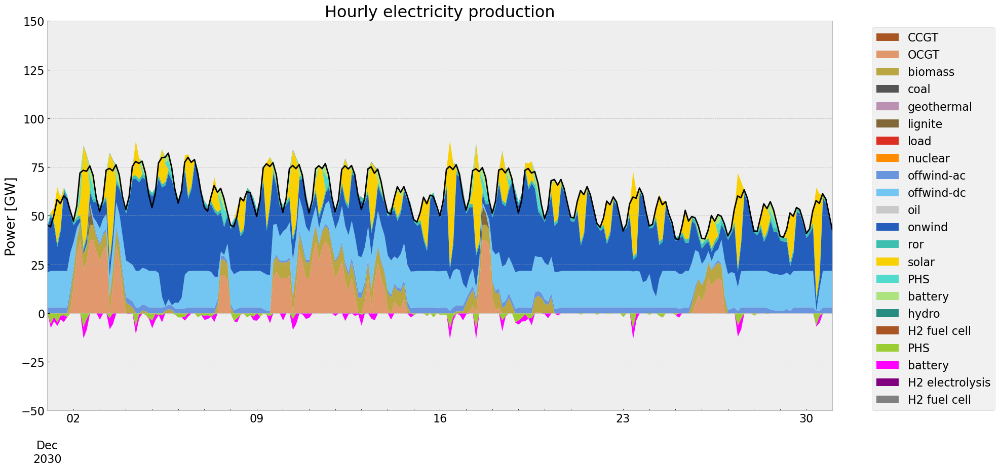

In [48]:
gen_curve(n1, '2030-12-01', '2030-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end=

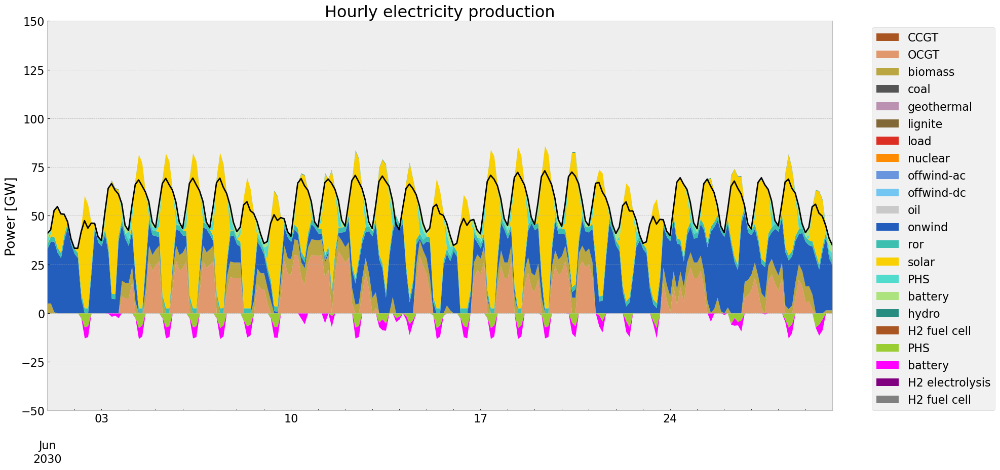

In [49]:
gen_curve(n1, '2030-06-1', '2030-06-30', colors_gen)

## Storage

carrier,PHS,battery,hydro
bus,,,
DE0 0,2.10300,1.849853,0.1200
DE0 1,0.99980,0.000000,NaN
DE0 2,1.85500,0.000000,0.1695
DE0 3,1.74142,2.054674,NaN
DE0 4,0.90000,1.686117,NaN


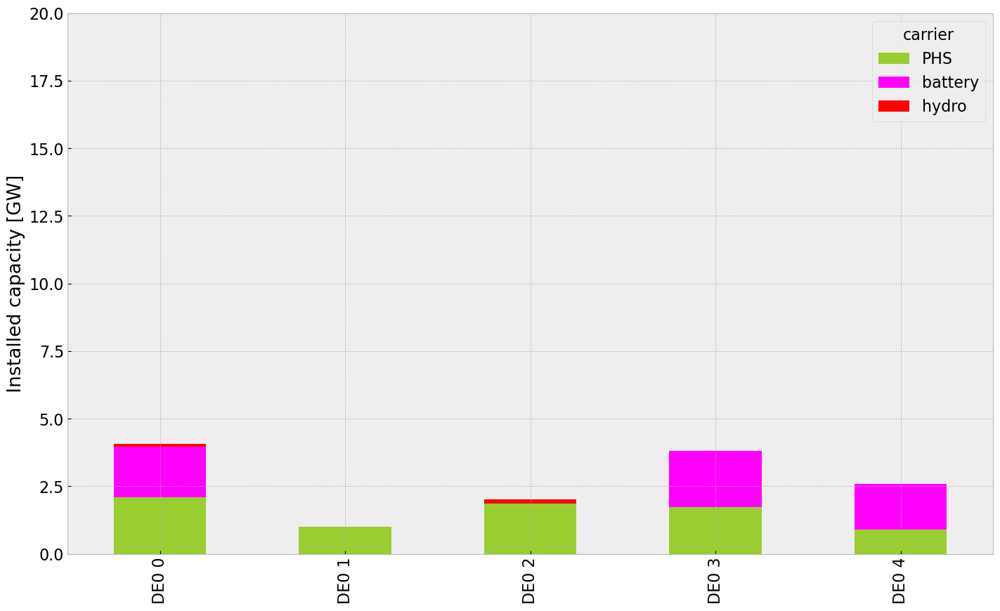

In [50]:
inst_store_table(n1)

carrier,H2
bus,
DE0 0 H2,0.0
DE0 1 H2,0.0
DE0 2 H2,0.0
DE0 3 H2,0.0
DE0 4 H2,0.0


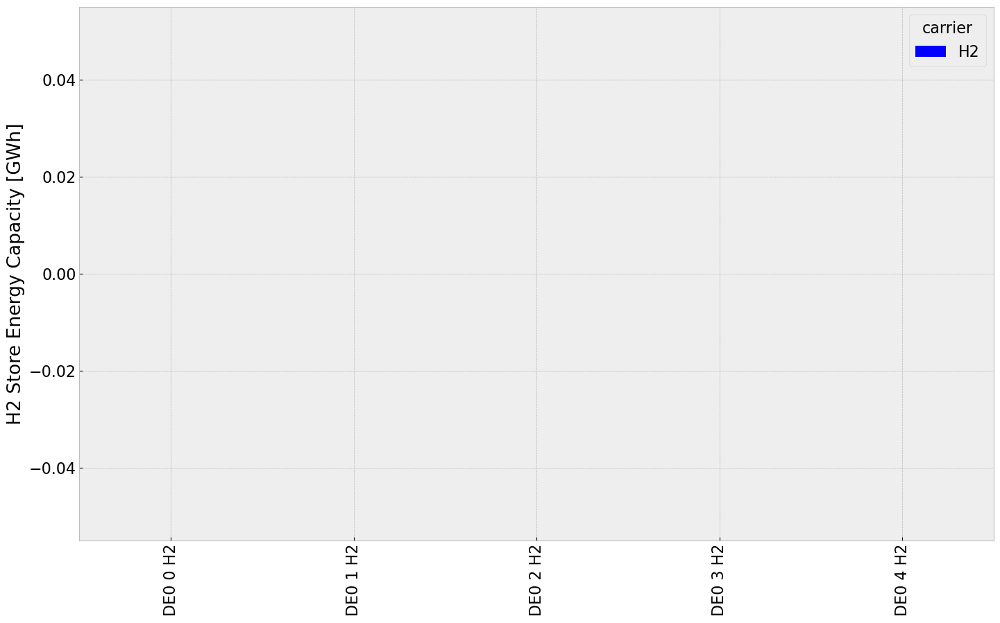

In [51]:
inst_storeh2_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


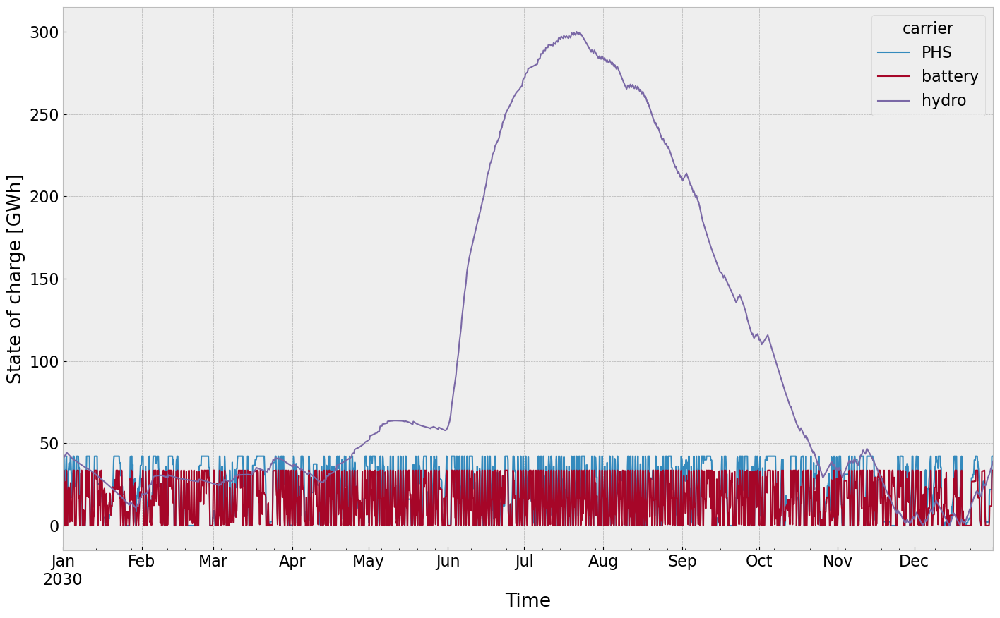

In [52]:
state_of_charge_plot(n1)


## Electricity Price


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


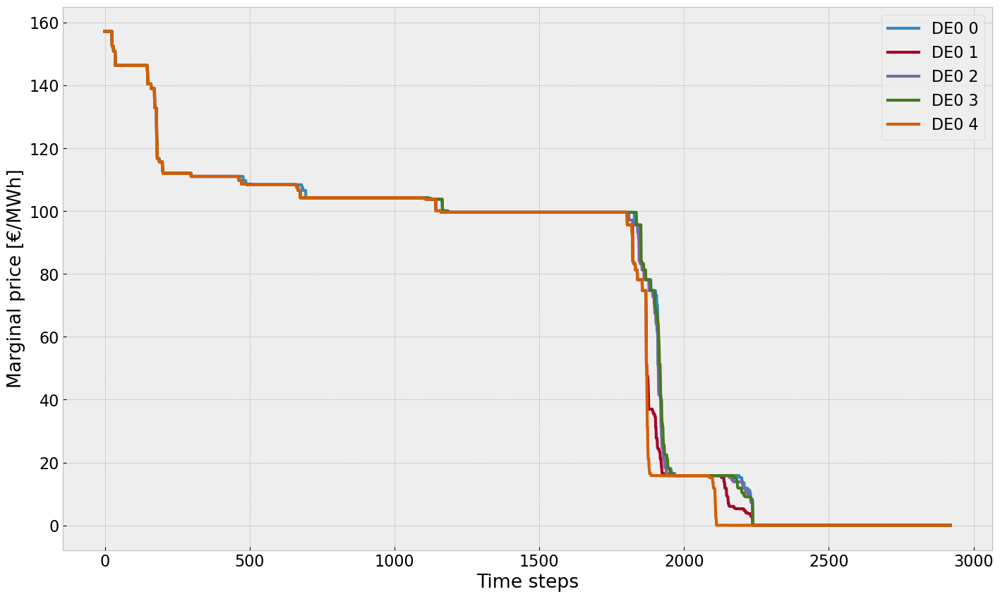

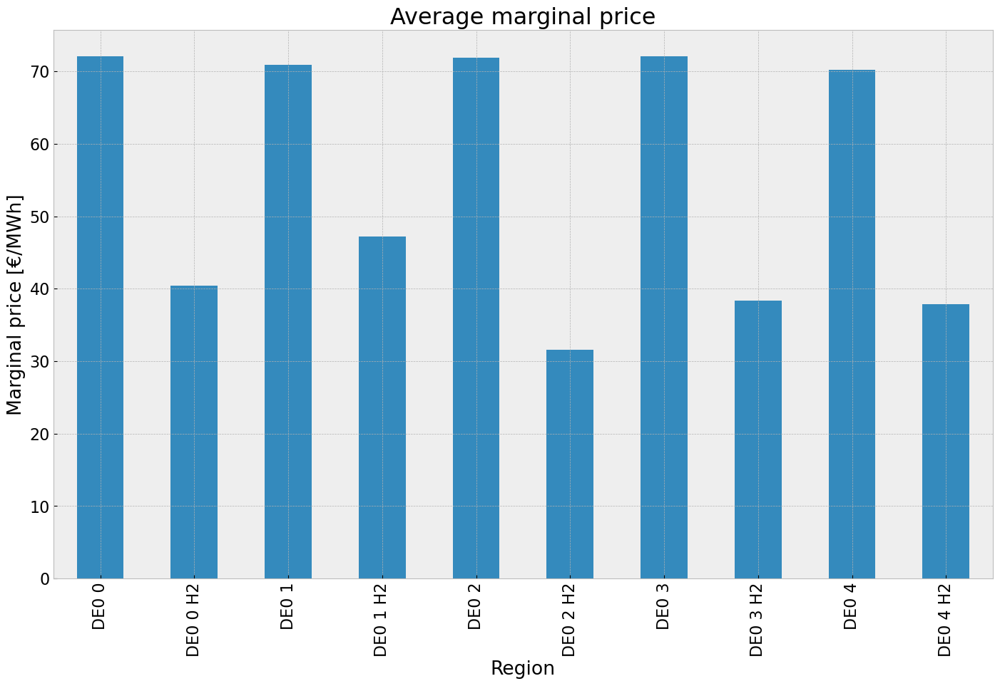

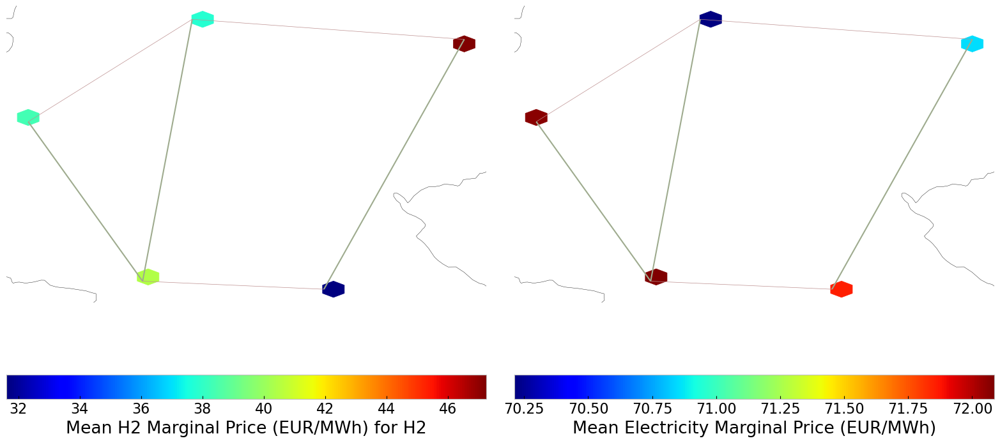

In [53]:
price_dur_curve_plot(n1)
price_regions_table(n1)
price_regions(n1)


## Emission

In [54]:
em_inv =em_table(n1)
em_inv

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,3.923444e+07,0.499437,0.1980,1.555436e+07
biomass,1.633369e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,8.786689e+05,0.358368,0.4069,9.976639e+05
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,1.023135e+06,1.000000,0.0000,0.000000e+00


## 2. Scenario: perfect foresight with no additional investment

In [55]:
#copy network
n2=n.copy()

#offwind cut
for column in n2.generators_t.p_max_pu.columns:
        if column.endswith('offwind-ac') or column.endswith('offwind-dc'):
                for index,row in n2.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index < cut_end:
                                new_p_max_pu = n2.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n2.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                #if new_p_max_pu<0:
                                #    n2.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom'] = n.generators.at[index, 'p_nom_opt']
        #n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index,'p_nom_extendable'] = False

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom'] = n.storage_units.at[index, 'p_nom_opt']
        #n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index,'p_nom_extendable'] = False

#set the optimal capacity of stores from the base scenario as the new minimum capacity 
for index, value in n2.stores.e_nom_extendable.items():
    if value:  
        n2.stores.at[index, 'e_nom'] = n.stores.at[index, 'e_nom_opt']
        #n2.stores.at[index, 'e_nom_max'] = n.stores.at[index, 'e_nom_opt']
        n2.stores.at[index, 'e_nom_extendable'] =False

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom'] = n.lines.at[index, 's_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_extendable'] =False

In [56]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Link-p_nom (Link-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)

Constraints:
------------
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Line-fix-s-lower (snapshot, Line-fix)
 * Line-fix-s-upper (snapshot, Line-fix)
 * Link-ext-p-lower (snapshot, Link-ext)
 * Link-ext-p-upper (snapshot, Link-ext)
 * Store-fix-e-lower (snapshot, Store-fix)
 * Store-fix-e-upper (snapshot, Store-fix)
 * StorageUnit-fix-p_dispatch-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_dispatch-upper (snapshot, StorageUnit-fix)
 * StorageUni

In [57]:
n2.optimize(solver_name ='gurobi')
#optimize.optimize_with_rolling_horizon(n2, horizon=24, overlap=0, solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 10/10 [00:01<00:00,  6.41it/s]
INFO:linopy.io: Writing time: 12.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-af1mgb22.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-af1mgb22.lp


Reading time = 3.27 seconds


INFO:gurobipy:Reading time = 3.27 seconds


obj: 849737 rows, 402951 columns, 1419117 nonzeros


INFO:gurobipy:obj: 849737 rows, 402951 columns, 1419117 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 849737 rows, 402951 columns and 1419117 nonzeros


INFO:gurobipy:Optimize a model with 849737 rows, 402951 columns and 1419117 nonzeros


Model fingerprint: 0xea92aaff


INFO:gurobipy:Model fingerprint: 0xea92aaff


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+02]


INFO:gurobipy:  Bounds range     [1e+01, 5e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 759233 rows and 160550 columns


INFO:gurobipy:Presolve removed 759233 rows and 160550 columns


Presolve time: 1.38s


INFO:gurobipy:Presolve time: 1.38s


Presolved: 90504 rows, 242401 columns, 461372 nonzeros


INFO:gurobipy:Presolved: 90504 rows, 242401 columns, 461372 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.25s


INFO:gurobipy:Ordering time: 0.25s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 13


INFO:gurobipy: Dense cols : 13


 AA' NZ     : 2.219e+05


INFO:gurobipy: AA' NZ     : 2.219e+05


 Factor NZ  : 1.498e+06 (roughly 150 MB of memory)


INFO:gurobipy: Factor NZ  : 1.498e+06 (roughly 150 MB of memory)


 Factor Ops : 3.510e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.510e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.81416477e+18 -9.47603348e+18  2.86e+08 5.18e+06  1.51e+14     2s


INFO:gurobipy:   0   1.81416477e+18 -9.47603348e+18  2.86e+08 5.18e+06  1.51e+14     2s


   1   9.55852631e+17 -8.24700311e+17  1.46e+08 7.96e+05  6.40e+13     3s


INFO:gurobipy:   1   9.55852631e+17 -8.24700311e+17  1.46e+08 7.96e+05  6.40e+13     3s


   2   9.24227333e+17 -4.47056961e+17  1.41e+08 3.75e+05  5.99e+13     3s


INFO:gurobipy:   2   9.24227333e+17 -4.47056961e+17  1.41e+08 3.75e+05  5.99e+13     3s


   3   1.82030539e+17 -2.98682302e+17  2.20e+07 1.80e+05  1.07e+13     3s


INFO:gurobipy:   3   1.82030539e+17 -2.98682302e+17  2.20e+07 1.80e+05  1.07e+13     3s


   4   4.11912502e+16 -3.10678484e+16  7.11e+05 5.19e+03  4.55e+11     4s


INFO:gurobipy:   4   4.11912502e+16 -3.10678484e+16  7.11e+05 5.19e+03  4.55e+11     4s


   5   1.16589330e+16 -9.47895395e+15  5.37e+04 1.50e+03  6.88e+10     4s


INFO:gurobipy:   5   1.16589330e+16 -9.47895395e+15  5.37e+04 1.50e+03  6.88e+10     4s


   6   1.17459489e+15 -8.29078691e+14  2.18e+03 3.49e+01  4.79e+09     4s


INFO:gurobipy:   6   1.17459489e+15 -8.29078691e+14  2.18e+03 3.49e+01  4.79e+09     4s


   7   1.04227204e+14 -9.26953375e+13  1.80e+02 4.65e-01  4.24e+08     4s


INFO:gurobipy:   7   1.04227204e+14 -9.26953375e+13  1.80e+02 4.65e-01  4.24e+08     4s


   8   4.00230691e+13 -2.87694005e+13  6.91e+01 1.19e-01  1.43e+08     4s


INFO:gurobipy:   8   4.00230691e+13 -2.87694005e+13  6.91e+01 1.19e-01  1.43e+08     4s


   9   4.48595568e+12 -6.53838463e+12  7.78e+00 1.93e-02  2.23e+07     4s


INFO:gurobipy:   9   4.48595568e+12 -6.53838463e+12  7.78e+00 1.93e-02  2.23e+07     4s


  10   3.10886226e+11 -1.03676017e+12  5.42e-01 1.60e-03  2.70e+06     5s


INFO:gurobipy:  10   3.10886226e+11 -1.03676017e+12  5.42e-01 1.60e-03  2.70e+06     5s


  11   1.73962959e+11 -5.89943901e+11  2.22e-01 9.21e-04  1.53e+06     5s


INFO:gurobipy:  11   1.73962959e+11 -5.89943901e+11  2.22e-01 9.21e-04  1.53e+06     5s


  12   1.41216133e+11 -3.97297668e+11  1.49e-01 6.41e-04  1.08e+06     5s


INFO:gurobipy:  12   1.41216133e+11 -3.97297668e+11  1.49e-01 6.41e-04  1.08e+06     5s


  13   1.25009401e+11 -2.74701373e+11  1.15e-01 4.65e-04  8.01e+05     5s


INFO:gurobipy:  13   1.25009401e+11 -2.74701373e+11  1.15e-01 4.65e-04  8.01e+05     5s


  14   1.07377118e+11 -1.87455624e+11  8.08e-02 3.32e-04  5.90e+05     5s


INFO:gurobipy:  14   1.07377118e+11 -1.87455624e+11  8.08e-02 3.32e-04  5.90e+05     5s


  15   9.64113387e+10 -1.29832758e+11  6.13e-02 2.48e-04  4.53e+05     6s


INFO:gurobipy:  15   9.64113387e+10 -1.29832758e+11  6.13e-02 2.48e-04  4.53e+05     6s


  16   7.59621053e+10 -8.13411073e+10  3.38e-02 1.75e-04  3.15e+05     6s


INFO:gurobipy:  16   7.59621053e+10 -8.13411073e+10  3.38e-02 1.75e-04  3.15e+05     6s


  17   5.54396797e+10 -4.20615119e+10  1.91e-02 1.09e-04  1.95e+05     6s


INFO:gurobipy:  17   5.54396797e+10 -4.20615119e+10  1.91e-02 1.09e-04  1.95e+05     6s


  18   3.91157514e+10 -1.42388235e+10  9.24e-03 6.07e-05  1.07e+05     6s


INFO:gurobipy:  18   3.91157514e+10 -1.42388235e+10  9.24e-03 6.07e-05  1.07e+05     6s


  19   3.11890113e+10  6.65884530e+08  5.11e-03 3.40e-05  6.11e+04     6s


INFO:gurobipy:  19   3.11890113e+10  6.65884530e+08  5.11e-03 3.40e-05  6.11e+04     6s


  20   2.57609133e+10  8.55857214e+09  2.61e-03 1.95e-05  3.44e+04     7s


INFO:gurobipy:  20   2.57609133e+10  8.55857214e+09  2.61e-03 1.95e-05  3.44e+04     7s


  21   2.36752694e+10  1.02465137e+10  1.74e-03 1.63e-05  2.69e+04     7s


INFO:gurobipy:  21   2.36752694e+10  1.02465137e+10  1.74e-03 1.63e-05  2.69e+04     7s


  22   2.23829687e+10  1.25233477e+10  1.22e-03 1.22e-05  1.97e+04     7s


INFO:gurobipy:  22   2.23829687e+10  1.25233477e+10  1.22e-03 1.22e-05  1.97e+04     7s


  23   2.12608281e+10  1.41475152e+10  8.03e-04 9.06e-06  1.42e+04     7s


INFO:gurobipy:  23   2.12608281e+10  1.41475152e+10  8.03e-04 9.06e-06  1.42e+04     7s


  24   2.03953222e+10  1.51686930e+10  4.85e-04 7.08e-06  1.05e+04     7s


INFO:gurobipy:  24   2.03953222e+10  1.51686930e+10  4.85e-04 7.08e-06  1.05e+04     7s


  25   1.99521883e+10  1.63258254e+10  3.31e-04 4.83e-06  7.26e+03     7s


INFO:gurobipy:  25   1.99521883e+10  1.63258254e+10  3.31e-04 4.83e-06  7.26e+03     7s


  26   1.93007463e+10  1.79082401e+10  1.16e-04 1.68e-06  2.79e+03     8s


INFO:gurobipy:  26   1.93007463e+10  1.79082401e+10  1.16e-04 1.68e-06  2.79e+03     8s


  27   1.90571608e+10  1.85106502e+10  5.18e-05 5.64e-07  1.09e+03     8s


INFO:gurobipy:  27   1.90571608e+10  1.85106502e+10  5.18e-05 5.64e-07  1.09e+03     8s


  28   1.89599332e+10  1.86219354e+10  2.84e-05 3.63e-07  6.77e+02     8s


INFO:gurobipy:  28   1.89599332e+10  1.86219354e+10  2.84e-05 3.63e-07  6.77e+02     8s


  29   1.89321425e+10  1.86886811e+10  2.19e-05 2.45e-07  4.88e+02     8s


INFO:gurobipy:  29   1.89321425e+10  1.86886811e+10  2.19e-05 2.45e-07  4.88e+02     8s


  30   1.89171724e+10  1.87178346e+10  1.85e-05 1.94e-07  3.99e+02     8s


INFO:gurobipy:  30   1.89171724e+10  1.87178346e+10  1.85e-05 1.94e-07  3.99e+02     8s


  31   1.89003944e+10  1.87561911e+10  1.48e-05 1.27e-07  2.89e+02     8s


INFO:gurobipy:  31   1.89003944e+10  1.87561911e+10  1.48e-05 1.27e-07  2.89e+02     8s


  32   1.88795353e+10  1.87820143e+10  1.02e-05 8.26e-08  1.95e+02     9s


INFO:gurobipy:  32   1.88795353e+10  1.87820143e+10  1.02e-05 8.26e-08  1.95e+02     9s


INFO:gurobipy:


Barrier performed 32 iterations in 8.66 seconds (2.92 work units)


INFO:gurobipy:Barrier performed 32 iterations in 8.66 seconds (2.92 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   54529    1.8833345e+10   0.000000e+00   0.000000e+00      9s


INFO:gurobipy:   54529    1.8833345e+10   0.000000e+00   0.000000e+00      9s


INFO:gurobipy:


Solved in 54529 iterations and 9.13 seconds (3.03 work units)


INFO:gurobipy:Solved in 54529 iterations and 9.13 seconds (3.03 work units)


Optimal objective  1.883334477e+10


INFO:gurobipy:Optimal objective  1.883334477e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 402951 primals, 849737 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [58]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

<Figure size 640x480 with 0 Axes>

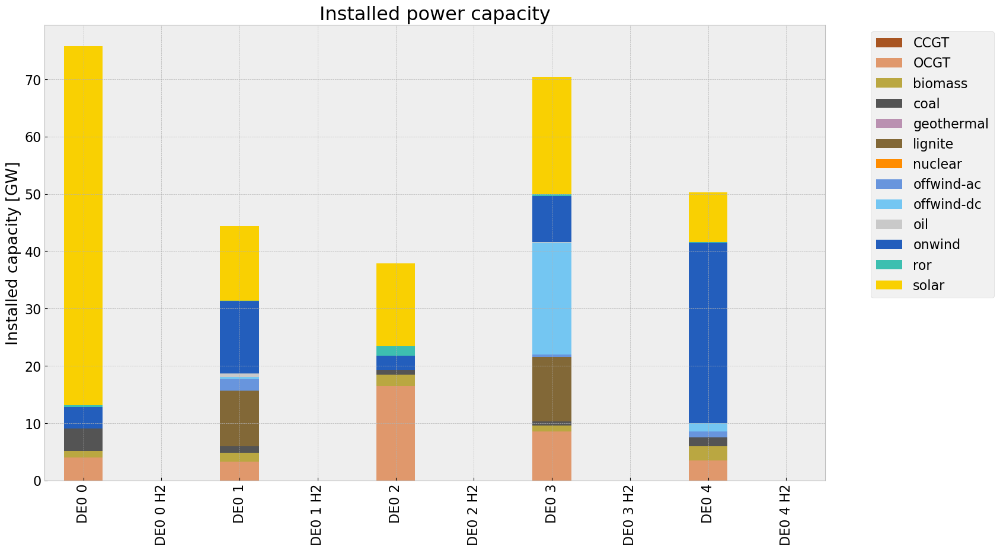

In [59]:
# consolidated istalled cap without load_shedding

capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv.fillna(0, inplace=True)
gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv = inst_cap_table(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

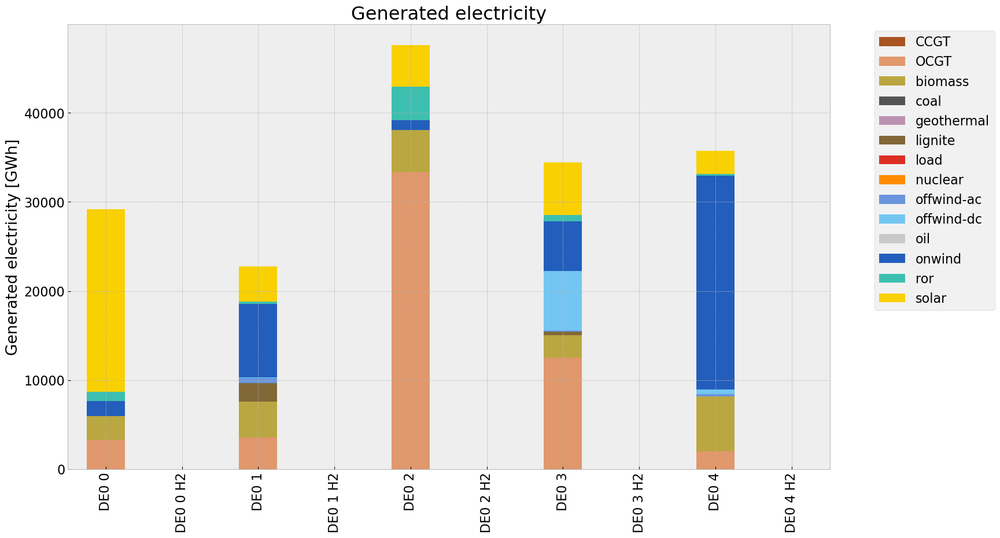

In [60]:
# consolidated generation table
carrier = n2.generators.carrier.unique()
df_tot_generation = n2.generators_t.p.sum()

generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')

generations.fillna(0, inplace=True)
gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)




## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2615338355.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2615338355.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier

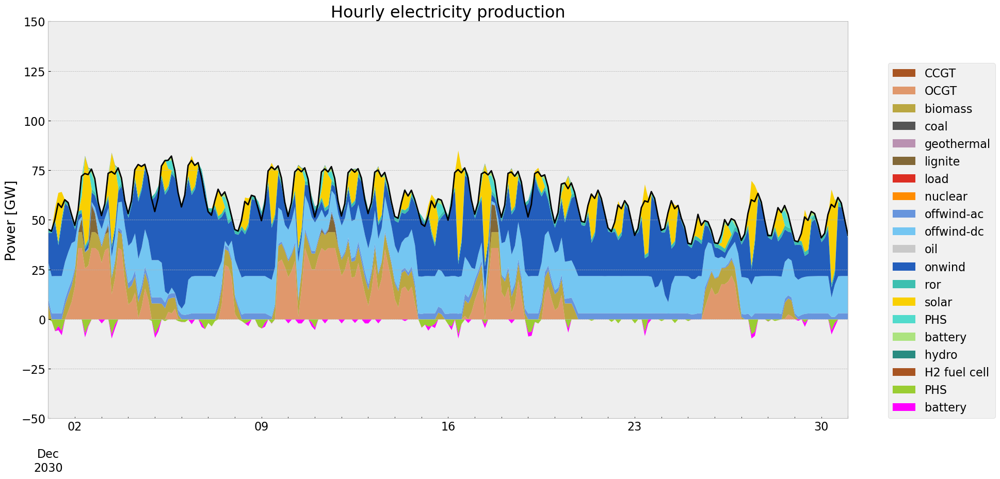

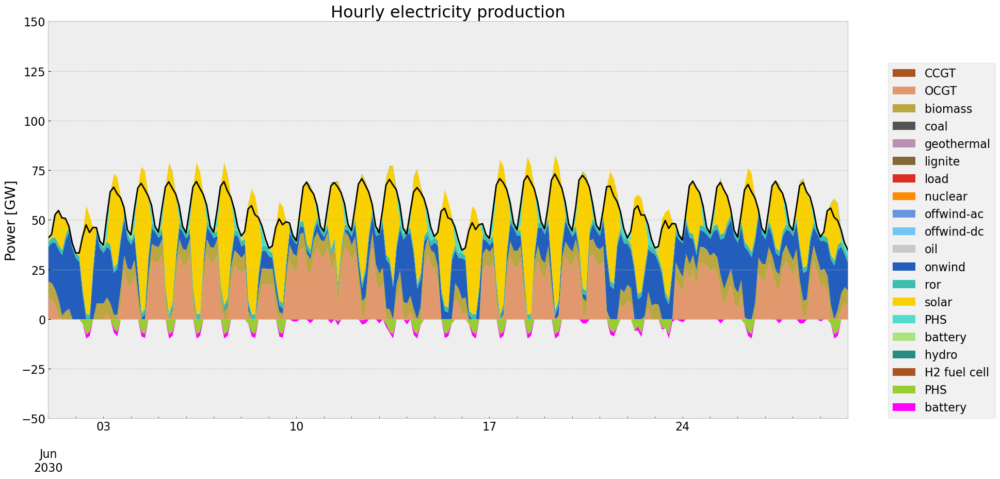

In [61]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n2, '2030-12-01', '2030-12-31', colors_gen)
gen_curve(n2, '2030-06-01', '2030-06-30', colors_gen)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2144961626.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2144961626.py:5: FutureWarning: 'H' is deprecated and will be removed in a future

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.467019e+07,0.499437,0.1980,2.167381e+07
biomass,2.014244e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,2.429932e+06,0.358368,0.4069,2.759009e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,1.030717e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


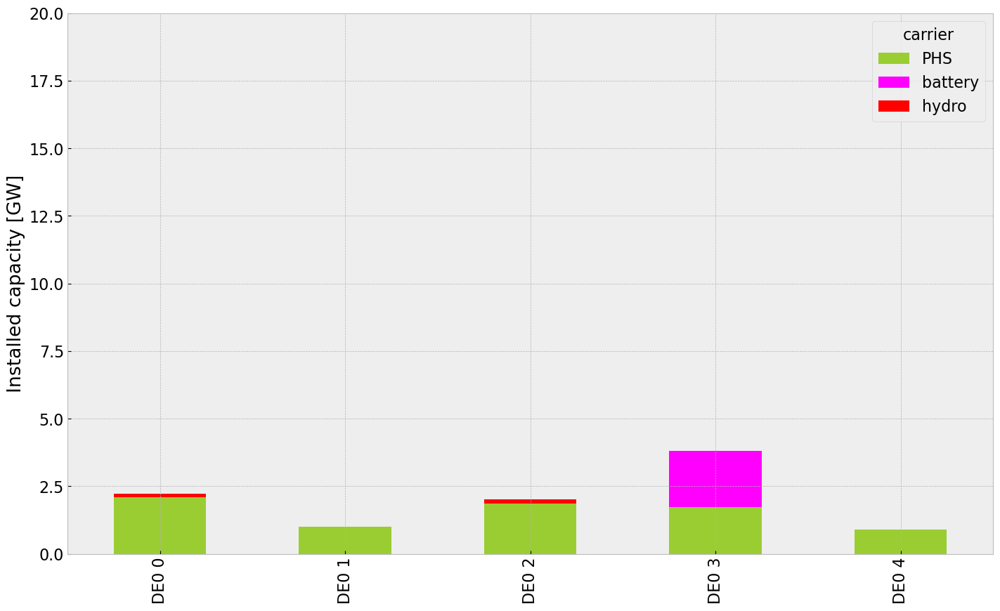

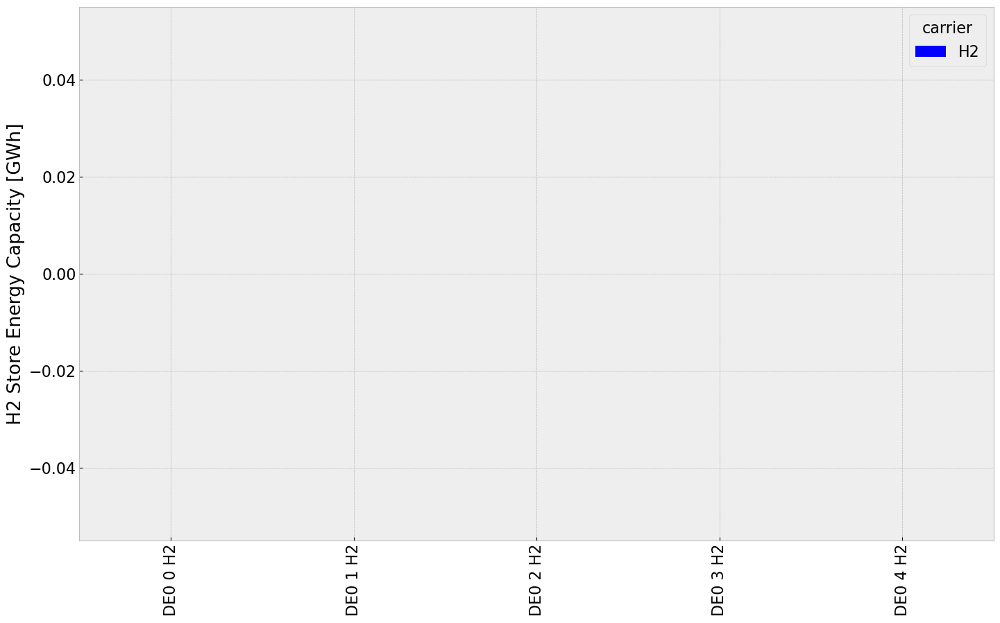

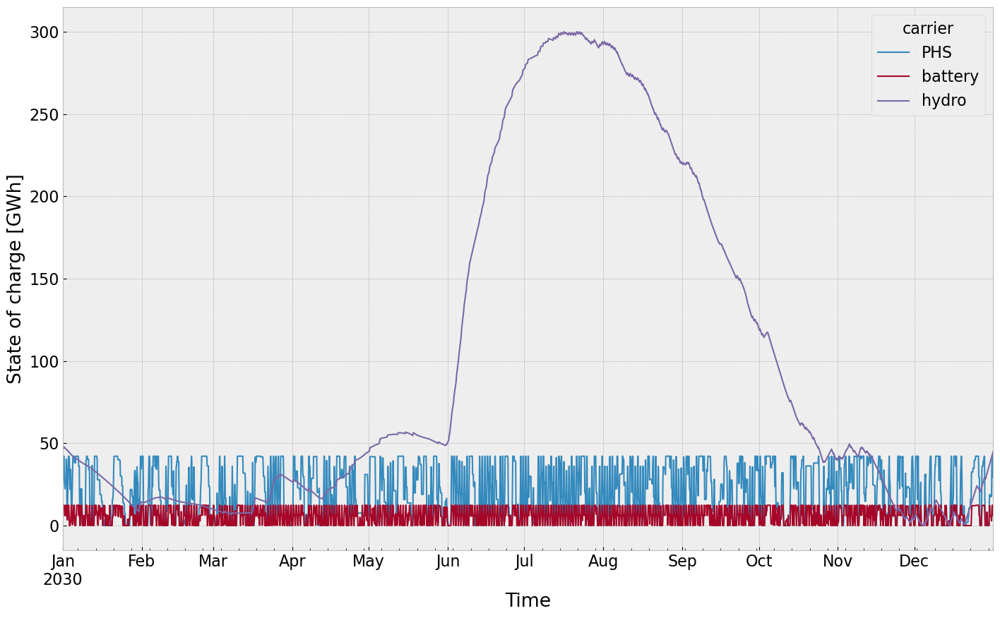

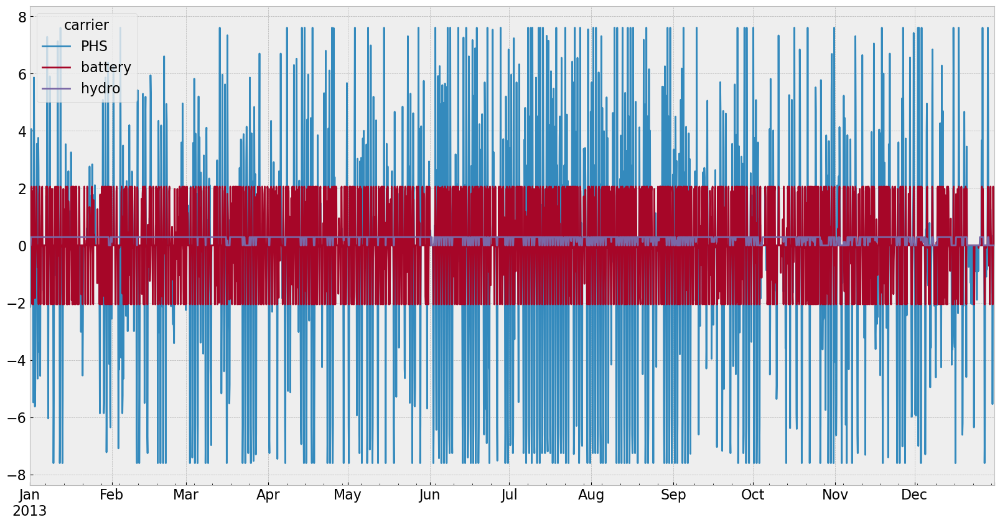

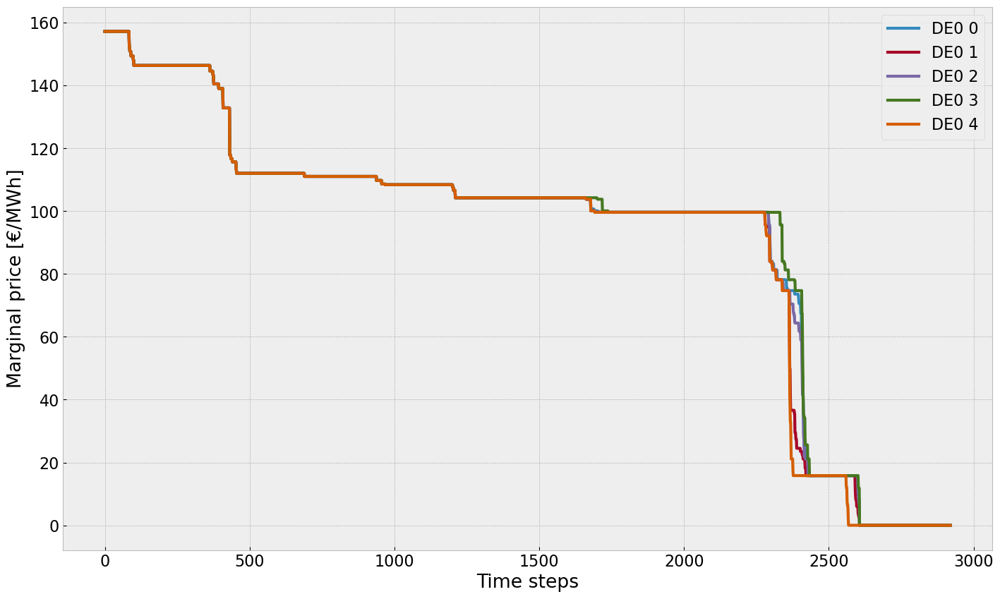

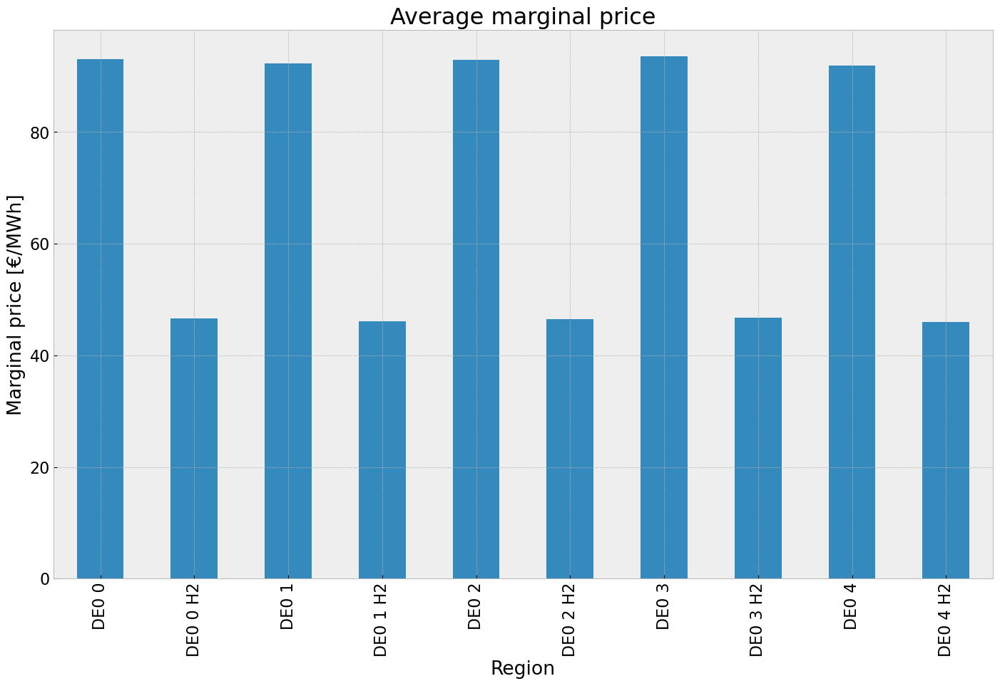

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


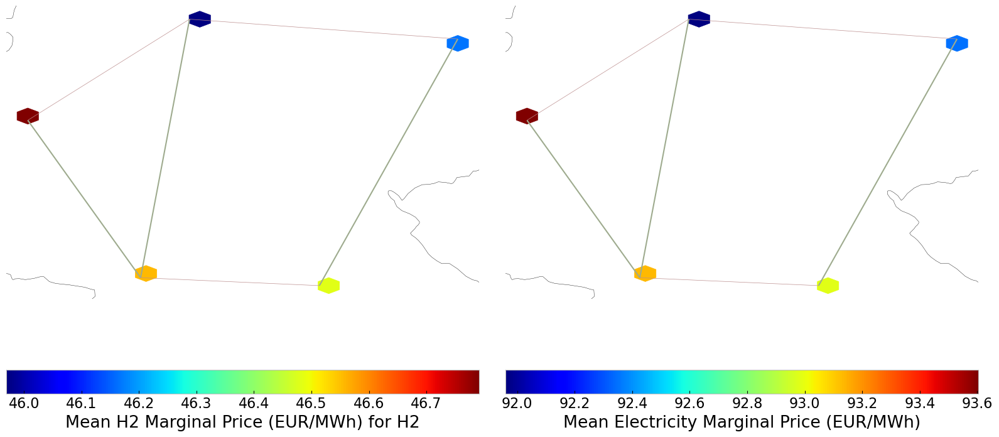

In [62]:
#storage unit & stores
inst_store_table(n2)
inst_storeh2_table(n2)
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
#price
price_dur_curve_plot(n2)
price_regions_table(n2)
price_regions(n2)
#emission
em_noinv =em_table(n2)
em_noinv

## 3. Scenario: rolling horizon foresight with no additional investment

In [63]:
n3= n2.copy()
horizon = 24
#n3.global_constraints.loc['CO2Limit','constant']= n.global_constraints.loc['CO2Limit','constant']/(len(n3.snapshots)/horizon)
n3.optimize.create_model()
optimize.optimize_with_rolling_horizon(n3, horizon=horizon, overlap=0, solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-87tq5u1t.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-87tq5u1t.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3fc680ee


INFO:gurobipy:Model fingerprint: 0x3fc680ee


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1350 columns


INFO:gurobipy:Presolve removed 6257 rows and 1350 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     581    3.4733272e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     581    3.4733272e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 581 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 581 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.473327226e+07


INFO:gurobipy:Optimal objective  3.473327226e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.47e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mpitsajc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mpitsajc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x609c70ed


INFO:gurobipy:Model fingerprint: 0x609c70ed


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1351 columns


INFO:gurobipy:Presolve removed 6257 rows and 1351 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1974 columns, 3761 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1974 columns, 3761 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     496    1.1463521e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     496    1.1463521e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 496 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 496 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.146352074e+08


INFO:gurobipy:Optimal objective  1.146352074e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.15e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-49__57ve.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-49__57ve.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xaf4f32a4


INFO:gurobipy:Model fingerprint: 0xaf4f32a4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1360 columns


INFO:gurobipy:Presolve removed 6257 rows and 1360 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1965 columns, 3752 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1965 columns, 3752 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     516    3.2780426e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     516    3.2780426e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 516 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 516 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.278042604e+08


INFO:gurobipy:Optimal objective  3.278042604e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-28e_abyx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-28e_abyx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf642bcdf


INFO:gurobipy:Model fingerprint: 0xf642bcdf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1364 columns


INFO:gurobipy:Presolve removed 6257 rows and 1364 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1961 columns, 3748 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1961 columns, 3748 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     469    2.7483169e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     469    2.7483169e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 469 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 469 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.748316898e+08


INFO:gurobipy:Optimal objective  2.748316898e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.75e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-17v4wdkl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-17v4wdkl.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x620b679e


INFO:gurobipy:Model fingerprint: 0x620b679e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1357 columns


INFO:gurobipy:Presolve removed 6257 rows and 1357 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1968 columns, 3755 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1968 columns, 3755 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     446    3.4497863e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     446    3.4497863e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 446 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 446 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.449786260e+08


INFO:gurobipy:Optimal objective  3.449786260e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.45e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3vjpffms.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3vjpffms.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc1b5c572


INFO:gurobipy:Model fingerprint: 0xc1b5c572


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1354 columns


INFO:gurobipy:Presolve removed 6257 rows and 1354 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1971 columns, 3758 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1971 columns, 3758 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     448    3.8406156e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     448    3.8406156e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 448 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 448 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.840615560e+08


INFO:gurobipy:Optimal objective  3.840615560e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.84e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-57qmsiiv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-57qmsiiv.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb50cd6dc


INFO:gurobipy:Model fingerprint: 0xb50cd6dc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1358 columns


INFO:gurobipy:Presolve removed 6257 rows and 1358 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1967 columns, 3754 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1967 columns, 3754 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     512    1.7797213e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     512    1.7797213e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 512 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 512 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.779721294e+08


INFO:gurobipy:Optimal objective  1.779721294e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.78e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rr8j0vvg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rr8j0vvg.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf4bee069


INFO:gurobipy:Model fingerprint: 0xf4bee069


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1376 columns


INFO:gurobipy:Presolve removed 6257 rows and 1376 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 744 rows, 1949 columns, 3736 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1949 columns, 3736 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     489    4.2571873e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     489    4.2571873e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 489 iterations and 0.10 seconds (0.01 work units)


INFO:gurobipy:Solved in 489 iterations and 0.10 seconds (0.01 work units)


Optimal objective  4.257187346e+08


INFO:gurobipy:Optimal objective  4.257187346e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 4.26e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jo7_75x8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jo7_75x8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb97bb766


INFO:gurobipy:Model fingerprint: 0xb97bb766


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1356 columns


INFO:gurobipy:Presolve removed 6257 rows and 1356 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1969 columns, 3756 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1969 columns, 3756 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     466    2.0452958e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     466    2.0452958e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 466 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 466 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.045295823e+08


INFO:gurobipy:Optimal objective  2.045295823e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.05e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pm2439kx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pm2439kx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xdf0ff3fb


INFO:gurobipy:Model fingerprint: 0xdf0ff3fb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1343 columns


INFO:gurobipy:Presolve removed 6257 rows and 1343 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     640    6.4361743e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     640    6.4361743e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 640 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 640 iterations and 0.06 seconds (0.01 work units)


Optimal objective  6.436174286e+07


INFO:gurobipy:Optimal objective  6.436174286e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.44e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.36s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gbskpmzj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gbskpmzj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe8eda219


INFO:gurobipy:Model fingerprint: 0xe8eda219


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1340 columns


INFO:gurobipy:Presolve removed 6257 rows and 1340 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1985 columns, 3772 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1985 columns, 3772 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     492    1.0814524e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     492    1.0814524e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 492 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 492 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.081452353e+08


INFO:gurobipy:Optimal objective  1.081452353e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.08e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m1uk85ao.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m1uk85ao.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb1da1ba3


INFO:gurobipy:Model fingerprint: 0xb1da1ba3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     491    5.6408872e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     491    5.6408872e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 491 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 491 iterations and 0.06 seconds (0.01 work units)


Optimal objective  5.640887199e+07


INFO:gurobipy:Optimal objective  5.640887199e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.64e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1qse60j2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1qse60j2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9bb7edbb


INFO:gurobipy:Model fingerprint: 0x9bb7edbb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1335 columns


INFO:gurobipy:Presolve removed 6257 rows and 1335 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     475    3.2773588e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     475    3.2773588e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 475 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 475 iterations and 0.07 seconds (0.01 work units)


Optimal objective  3.277358840e+08


INFO:gurobipy:Optimal objective  3.277358840e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5cmbg874.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5cmbg874.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x90cfb4ba


INFO:gurobipy:Model fingerprint: 0x90cfb4ba


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1356 columns


INFO:gurobipy:Presolve removed 6257 rows and 1356 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1969 columns, 3756 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1969 columns, 3756 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     437    1.7440344e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     437    1.7440344e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 437 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 437 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.744034441e+08


INFO:gurobipy:Optimal objective  1.744034441e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.74e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3_cqqqx2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3_cqqqx2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3a9c79bb


INFO:gurobipy:Model fingerprint: 0x3a9c79bb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1348 columns


INFO:gurobipy:Presolve removed 6257 rows and 1348 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1977 columns, 3764 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1977 columns, 3764 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     441    3.1397297e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     441    3.1397297e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 441 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 441 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.139729660e+08


INFO:gurobipy:Optimal objective  3.139729660e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.14e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fn2bw7ep.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fn2bw7ep.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc1511257


INFO:gurobipy:Model fingerprint: 0xc1511257


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1384 columns


INFO:gurobipy:Presolve removed 6257 rows and 1384 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1941 columns, 3728 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1941 columns, 3728 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     482    3.2201435e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     482    3.2201435e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 482 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 482 iterations and 0.06 seconds (0.01 work units)


Optimal objective  3.220143453e+08


INFO:gurobipy:Optimal objective  3.220143453e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hhzums_a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hhzums_a.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9ee6cf81


INFO:gurobipy:Model fingerprint: 0x9ee6cf81


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1350 columns


INFO:gurobipy:Presolve removed 6257 rows and 1350 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     520    2.6102380e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     520    2.6102380e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 520 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 520 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.610237974e+08


INFO:gurobipy:Optimal objective  2.610237974e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pprn1_6p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pprn1_6p.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xae8dc51f


INFO:gurobipy:Model fingerprint: 0xae8dc51f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     476    2.0045730e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     476    2.0045730e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 476 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 476 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.004572989e+08


INFO:gurobipy:Optimal objective  2.004572989e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.00e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tc12ih3w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tc12ih3w.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x219a8d93


INFO:gurobipy:Model fingerprint: 0x219a8d93


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1338 columns


INFO:gurobipy:Presolve removed 6257 rows and 1338 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     440    2.3897838e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     440    2.3897838e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 440 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 440 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.389783771e+08


INFO:gurobipy:Optimal objective  2.389783771e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.39e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wdwbmog7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wdwbmog7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8eb4c17d


INFO:gurobipy:Model fingerprint: 0x8eb4c17d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1352 columns


INFO:gurobipy:Presolve removed 6257 rows and 1352 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1973 columns, 3760 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1973 columns, 3760 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     437    3.6620543e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     437    3.6620543e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 437 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 437 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.662054312e+08


INFO:gurobipy:Optimal objective  3.662054312e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wff_qshk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wff_qshk.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd55952fd


INFO:gurobipy:Model fingerprint: 0xd55952fd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1350 columns


INFO:gurobipy:Presolve removed 6257 rows and 1350 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     486    1.3591572e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     486    1.3591572e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 486 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 486 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.359157241e+08


INFO:gurobipy:Optimal objective  1.359157241e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.36e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-izq5knwj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-izq5knwj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xcf15ff8c


INFO:gurobipy:Model fingerprint: 0xcf15ff8c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1345 columns


INFO:gurobipy:Presolve removed 6257 rows and 1345 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1980 columns, 3767 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1980 columns, 3767 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     504    1.6988732e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     504    1.6988732e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 504 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 504 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.698873239e+08


INFO:gurobipy:Optimal objective  1.698873239e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.70e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cg93ewau.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cg93ewau.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x72f5acc7


INFO:gurobipy:Model fingerprint: 0x72f5acc7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1334 columns


INFO:gurobipy:Presolve removed 6257 rows and 1334 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     510    5.2367768e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     510    5.2367768e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 510 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 510 iterations and 0.05 seconds (0.01 work units)


Optimal objective  5.236776797e+07


INFO:gurobipy:Optimal objective  5.236776797e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.24e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mmcvpcxo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mmcvpcxo.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xfa76c1a4


INFO:gurobipy:Model fingerprint: 0xfa76c1a4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     437    3.0252639e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     437    3.0252639e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 437 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 437 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.025263887e+08


INFO:gurobipy:Optimal objective  3.025263887e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a3sg1b67.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a3sg1b67.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xabfb7b1e


INFO:gurobipy:Model fingerprint: 0xabfb7b1e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1340 columns


INFO:gurobipy:Presolve removed 6257 rows and 1340 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1985 columns, 3772 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1985 columns, 3772 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     445    1.8983855e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     445    1.8983855e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 445 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 445 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.898385474e+08


INFO:gurobipy:Optimal objective  1.898385474e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.90e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3ht18yy6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3ht18yy6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe1ac06ae


INFO:gurobipy:Model fingerprint: 0xe1ac06ae


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     539    1.1950178e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     539    1.1950178e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 539 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 539 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.195017758e+08


INFO:gurobipy:Optimal objective  1.195017758e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.20e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kh8c01dz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kh8c01dz.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4b8656a3


INFO:gurobipy:Model fingerprint: 0x4b8656a3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     483    2.3069761e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     483    2.3069761e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 483 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 483 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.306976131e+08


INFO:gurobipy:Optimal objective  2.306976131e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.31e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-upq58r5j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-upq58r5j.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7b10b984


INFO:gurobipy:Model fingerprint: 0x7b10b984


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     494    6.8201704e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     494    6.8201704e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 494 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 494 iterations and 0.05 seconds (0.01 work units)


Optimal objective  6.820170364e+06


INFO:gurobipy:Optimal objective  6.820170364e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.82e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gjdwzx7j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gjdwzx7j.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3cbad16e


INFO:gurobipy:Model fingerprint: 0x3cbad16e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1334 columns


INFO:gurobipy:Presolve removed 6257 rows and 1334 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     428    1.4569243e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     428    1.4569243e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 428 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 428 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.456924274e+08


INFO:gurobipy:Optimal objective  1.456924274e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.46e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v5tptua6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v5tptua6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x5878d856


INFO:gurobipy:Model fingerprint: 0x5878d856


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1343 columns


INFO:gurobipy:Presolve removed 6257 rows and 1343 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     429    1.7592086e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     429    1.7592086e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 429 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 429 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.759208597e+08


INFO:gurobipy:Optimal objective  1.759208597e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.76e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8fj9k0ih.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8fj9k0ih.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa3379e2c


INFO:gurobipy:Model fingerprint: 0xa3379e2c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    1.5619907e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    1.5619907e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.561990731e+08


INFO:gurobipy:Optimal objective  1.561990731e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1kybugp6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1kybugp6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x564300e1


INFO:gurobipy:Model fingerprint: 0x564300e1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1333 columns


INFO:gurobipy:Presolve removed 6257 rows and 1333 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1992 columns, 3779 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1992 columns, 3779 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     514    2.4039124e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     514    2.4039124e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 514 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 514 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.403912374e+08


INFO:gurobipy:Optimal objective  2.403912374e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8hq3rhsq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8hq3rhsq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xabb2209e


INFO:gurobipy:Model fingerprint: 0xabb2209e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1341 columns


INFO:gurobipy:Presolve removed 6257 rows and 1341 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1984 columns, 3771 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1984 columns, 3771 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     446    1.6257774e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     446    1.6257774e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 446 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 446 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.625777408e+08


INFO:gurobipy:Optimal objective  1.625777408e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.63e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7abtp81r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7abtp81r.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xcdc0c704


INFO:gurobipy:Model fingerprint: 0xcdc0c704


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     486    2.0684504e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     486    2.0684504e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 486 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 486 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.068450415e+08


INFO:gurobipy:Optimal objective  2.068450415e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.07e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-twaucwib.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-twaucwib.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x5d5d11c6


INFO:gurobipy:Model fingerprint: 0x5d5d11c6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1335 columns


INFO:gurobipy:Presolve removed 6257 rows and 1335 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     483    7.4089030e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     483    7.4089030e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 483 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 483 iterations and 0.04 seconds (0.01 work units)


Optimal objective  7.408902954e+07


INFO:gurobipy:Optimal objective  7.408902954e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.41e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jjiuuxnx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jjiuuxnx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xaffd45f8


INFO:gurobipy:Model fingerprint: 0xaffd45f8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1342 columns


INFO:gurobipy:Presolve removed 6257 rows and 1342 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1983 columns, 3770 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1983 columns, 3770 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     402    1.1300514e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     402    1.1300514e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 402 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 402 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.130051364e+08


INFO:gurobipy:Optimal objective  1.130051364e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.13e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ysepjfyq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ysepjfyq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xca2b6c48


INFO:gurobipy:Model fingerprint: 0xca2b6c48


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1340 columns


INFO:gurobipy:Presolve removed 6257 rows and 1340 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1985 columns, 3772 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1985 columns, 3772 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     431    1.2910653e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     431    1.2910653e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 431 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 431 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.291065254e+08


INFO:gurobipy:Optimal objective  1.291065254e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.29e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jtscf46t.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jtscf46t.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa3f7d7d1


INFO:gurobipy:Model fingerprint: 0xa3f7d7d1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1348 columns


INFO:gurobipy:Presolve removed 6257 rows and 1348 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1977 columns, 3764 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1977 columns, 3764 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     366    1.4501112e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     366    1.4501112e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 366 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 366 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.450111213e+08


INFO:gurobipy:Optimal objective  1.450111213e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.45e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qvz0cyt7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qvz0cyt7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb60fa542


INFO:gurobipy:Model fingerprint: 0xb60fa542


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1346 columns


INFO:gurobipy:Presolve removed 6257 rows and 1346 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1979 columns, 3766 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1979 columns, 3766 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     380    1.8009926e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     380    1.8009926e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 380 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 380 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.800992580e+08


INFO:gurobipy:Optimal objective  1.800992580e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.80e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hw3588xi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hw3588xi.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9adaab1e


INFO:gurobipy:Model fingerprint: 0x9adaab1e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1343 columns


INFO:gurobipy:Presolve removed 6257 rows and 1343 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     395    1.6566904e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     395    1.6566904e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 395 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 395 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.656690371e+08


INFO:gurobipy:Optimal objective  1.656690371e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6st5o8sn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6st5o8sn.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x82fdb460


INFO:gurobipy:Model fingerprint: 0x82fdb460


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     399    1.8169455e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     399    1.8169455e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 399 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 399 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.816945474e+08


INFO:gurobipy:Optimal objective  1.816945474e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h3rz8z9f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h3rz8z9f.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3ab1f9da


INFO:gurobipy:Model fingerprint: 0x3ab1f9da


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1341 columns


INFO:gurobipy:Presolve removed 6257 rows and 1341 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1984 columns, 3771 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1984 columns, 3771 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     379    1.3162812e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     379    1.3162812e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 379 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 379 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.316281223e+08


INFO:gurobipy:Optimal objective  1.316281223e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.32e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-waaf0sq0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-waaf0sq0.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc20d85ee


INFO:gurobipy:Model fingerprint: 0xc20d85ee


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     392    1.6460118e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     392    1.6460118e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 392 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 392 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.646011797e+08


INFO:gurobipy:Optimal objective  1.646011797e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.65e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-89mqugg2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-89mqugg2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1b5428e7


INFO:gurobipy:Model fingerprint: 0x1b5428e7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1327 columns


INFO:gurobipy:Presolve removed 6257 rows and 1327 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1998 columns, 3785 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1998 columns, 3785 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     426    1.1064067e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     426    1.1064067e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 426 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 426 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.106406659e+08


INFO:gurobipy:Optimal objective  1.106406659e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.11e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z3d42lg4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z3d42lg4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7661c562


INFO:gurobipy:Model fingerprint: 0x7661c562


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1320 columns


INFO:gurobipy:Presolve removed 6257 rows and 1320 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2005 columns, 3792 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2005 columns, 3792 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     468    1.3996951e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     468    1.3996951e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 468 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 468 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.399695125e+08


INFO:gurobipy:Optimal objective  1.399695125e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b11rv_ex.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b11rv_ex.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8c57d3a1


INFO:gurobipy:Model fingerprint: 0x8c57d3a1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1324 columns


INFO:gurobipy:Presolve removed 6257 rows and 1324 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2001 columns, 3788 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2001 columns, 3788 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     485    1.8163360e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     485    1.8163360e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 485 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 485 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.816335996e+08


INFO:gurobipy:Optimal objective  1.816335996e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w9tsodmp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w9tsodmp.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x5fd8f0a9


INFO:gurobipy:Model fingerprint: 0x5fd8f0a9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1319 columns


INFO:gurobipy:Presolve removed 6257 rows and 1319 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2006 columns, 3793 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2006 columns, 3793 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     454    1.3428375e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     454    1.3428375e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 454 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 454 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.342837451e+08


INFO:gurobipy:Optimal objective  1.342837451e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.34e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3drezw7i.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3drezw7i.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x82fc0c98


INFO:gurobipy:Model fingerprint: 0x82fc0c98


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1334 columns


INFO:gurobipy:Presolve removed 6257 rows and 1334 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     511    1.8206591e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     511    1.8206591e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 511 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 511 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.820659104e+08


INFO:gurobipy:Optimal objective  1.820659104e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k9ntlew1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k9ntlew1.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x65d3cf15


INFO:gurobipy:Model fingerprint: 0x65d3cf15


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1331 columns


INFO:gurobipy:Presolve removed 6257 rows and 1331 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1994 columns, 3781 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1994 columns, 3781 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     456    9.7415432e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     456    9.7415432e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 456 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 456 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.741543227e+07


INFO:gurobipy:Optimal objective  9.741543227e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.74e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yu0fw2e5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yu0fw2e5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc80b6b5b


INFO:gurobipy:Model fingerprint: 0xc80b6b5b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1343 columns


INFO:gurobipy:Presolve removed 6257 rows and 1343 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1982 columns, 3769 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     457    1.7796246e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     457    1.7796246e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 457 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 457 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.779624587e+08


INFO:gurobipy:Optimal objective  1.779624587e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.78e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7q6u008h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7q6u008h.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf6a91bb6


INFO:gurobipy:Model fingerprint: 0xf6a91bb6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 4e+02]


INFO:gurobipy:  Bounds range     [1e+02, 4e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1323 columns


INFO:gurobipy:Presolve removed 6257 rows and 1323 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2002 columns, 3789 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2002 columns, 3789 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     426    2.6075475e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     426    2.6075475e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 426 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 426 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.607547486e+07


INFO:gurobipy:Optimal objective  2.607547486e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.61e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-omy4inwq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-omy4inwq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x34280ec0


INFO:gurobipy:Model fingerprint: 0x34280ec0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+02, 5e+02]


INFO:gurobipy:  Bounds range     [3e+02, 5e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1321 columns


INFO:gurobipy:Presolve removed 6257 rows and 1321 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2004 columns, 3791 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2004 columns, 3791 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     384    1.0575069e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     384    1.0575069e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 384 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 384 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.057506899e+08


INFO:gurobipy:Optimal objective  1.057506899e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nocfyg7d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nocfyg7d.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x846764fc


INFO:gurobipy:Model fingerprint: 0x846764fc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+02, 5e+02]


INFO:gurobipy:  Bounds range     [3e+02, 5e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1338 columns


INFO:gurobipy:Presolve removed 6257 rows and 1338 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     388    1.2213321e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     388    1.2213321e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 388 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 388 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.221332084e+08


INFO:gurobipy:Optimal objective  1.221332084e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iokdy8mv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iokdy8mv.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x882e1f82


INFO:gurobipy:Model fingerprint: 0x882e1f82


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 4e+02]


INFO:gurobipy:  Bounds range     [2e+02, 4e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1338 columns


INFO:gurobipy:Presolve removed 6257 rows and 1338 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     383    1.8626606e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     383    1.8626606e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 383 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 383 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.862660586e+08


INFO:gurobipy:Optimal objective  1.862660586e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.86e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o7swmvph.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o7swmvph.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xde0c7e5a


INFO:gurobipy:Model fingerprint: 0xde0c7e5a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     375    1.0362502e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     375    1.0362502e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 375 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 375 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.036250248e+08


INFO:gurobipy:Optimal objective  1.036250248e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.04e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rdx0dfde.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rdx0dfde.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2e67d676


INFO:gurobipy:Model fingerprint: 0x2e67d676


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1318 columns


INFO:gurobipy:Presolve removed 6257 rows and 1318 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2007 columns, 3794 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2007 columns, 3794 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     385    8.1208665e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     385    8.1208665e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 385 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 385 iterations and 0.04 seconds (0.01 work units)


Optimal objective  8.120866476e+07


INFO:gurobipy:Optimal objective  8.120866476e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 8.12e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w0ag3gp3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w0ag3gp3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4917e90c


INFO:gurobipy:Model fingerprint: 0x4917e90c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1328 columns


INFO:gurobipy:Presolve removed 6257 rows and 1328 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1997 columns, 3784 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1997 columns, 3784 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     412    1.5122915e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     412    1.5122915e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 412 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 412 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.512291540e+08


INFO:gurobipy:Optimal objective  1.512291540e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.51e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2_7ld7o7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2_7ld7o7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd2f0182d


INFO:gurobipy:Model fingerprint: 0xd2f0182d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1314 columns


INFO:gurobipy:Presolve removed 6257 rows and 1314 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2011 columns, 3798 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2011 columns, 3798 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     402    3.9343573e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     402    3.9343573e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 402 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 402 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.934357284e+07


INFO:gurobipy:Optimal objective  3.934357284e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.93e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_oob5jfm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_oob5jfm.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7d8df067


INFO:gurobipy:Model fingerprint: 0x7d8df067


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1317 columns


INFO:gurobipy:Presolve removed 6257 rows and 1317 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2008 columns, 3795 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2008 columns, 3795 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     430    1.2146670e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     430    1.2146670e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 430 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 430 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.214666957e+08


INFO:gurobipy:Optimal objective  1.214666957e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.21e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r2k7ap5o.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r2k7ap5o.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa99b8ee4


INFO:gurobipy:Model fingerprint: 0xa99b8ee4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1327 columns


INFO:gurobipy:Presolve removed 6257 rows and 1327 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1998 columns, 3785 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1998 columns, 3785 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     432    1.2616647e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     432    1.2616647e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 432 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 432 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.261664746e+08


INFO:gurobipy:Optimal objective  1.261664746e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.26e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hy_mt_ek.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hy_mt_ek.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8dd00ca4


INFO:gurobipy:Model fingerprint: 0x8dd00ca4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1330 columns


INFO:gurobipy:Presolve removed 6257 rows and 1330 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1995 columns, 3782 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1995 columns, 3782 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     384    1.0862725e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     384    1.0862725e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 384 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 384 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.086272479e+08


INFO:gurobipy:Optimal objective  1.086272479e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.09e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-po1atsd0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-po1atsd0.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x013f9e4c


INFO:gurobipy:Model fingerprint: 0x013f9e4c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     388    2.0978753e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     388    2.0978753e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 388 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 388 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.097875323e+08


INFO:gurobipy:Optimal objective  2.097875323e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nyh9tp4o.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nyh9tp4o.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x53375d85


INFO:gurobipy:Model fingerprint: 0x53375d85


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1325 columns


INFO:gurobipy:Presolve removed 6257 rows and 1325 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2000 columns, 3787 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2000 columns, 3787 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     408    1.0121765e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     408    1.0121765e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 408 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 408 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.012176452e+08


INFO:gurobipy:Optimal objective  1.012176452e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.01e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fmdxqmq3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fmdxqmq3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xaaf400ab


INFO:gurobipy:Model fingerprint: 0xaaf400ab


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1317 columns


INFO:gurobipy:Presolve removed 6257 rows and 1317 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2008 columns, 3795 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2008 columns, 3795 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     459    1.2231854e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     459    1.2231854e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 459 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 459 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.223185361e+08


INFO:gurobipy:Optimal objective  1.223185361e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h0etb5dg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h0etb5dg.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb8909f30


INFO:gurobipy:Model fingerprint: 0xb8909f30


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1335 columns


INFO:gurobipy:Presolve removed 6257 rows and 1335 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     447    1.0062031e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     447    1.0062031e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 447 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 447 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.006203136e+08


INFO:gurobipy:Optimal objective  1.006203136e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.01e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tsf1vkcf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tsf1vkcf.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf6586ed3


INFO:gurobipy:Model fingerprint: 0xf6586ed3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1341 columns


INFO:gurobipy:Presolve removed 6257 rows and 1341 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1984 columns, 3771 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1984 columns, 3771 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     434    1.5208927e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     434    1.5208927e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 434 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 434 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.520892664e+08


INFO:gurobipy:Optimal objective  1.520892664e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.52e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-26b4un7h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-26b4un7h.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc5ef353e


INFO:gurobipy:Model fingerprint: 0xc5ef353e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 1e+02]


INFO:gurobipy:  Bounds range     [1e+02, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1323 columns


INFO:gurobipy:Presolve removed 6257 rows and 1323 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2002 columns, 3789 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2002 columns, 3789 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     459    1.1070164e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     459    1.1070164e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 459 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 459 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.107016434e+08


INFO:gurobipy:Optimal objective  1.107016434e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.11e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e89811yn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e89811yn.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x6bbb4532


INFO:gurobipy:Model fingerprint: 0x6bbb4532


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1367 columns


INFO:gurobipy:Presolve removed 6257 rows and 1367 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1958 columns, 3745 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1958 columns, 3745 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     424    1.3753792e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     424    1.3753792e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 424 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 424 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.375379216e+08


INFO:gurobipy:Optimal objective  1.375379216e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.38e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-webdlad2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-webdlad2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x64981a21


INFO:gurobipy:Model fingerprint: 0x64981a21


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1370 columns


INFO:gurobipy:Presolve removed 6257 rows and 1370 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1955 columns, 3742 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1955 columns, 3742 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     480    2.1717189e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     480    2.1717189e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 480 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 480 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.171718904e+08


INFO:gurobipy:Optimal objective  2.171718904e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.17e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-htthe_d7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-htthe_d7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa1f3b48d


INFO:gurobipy:Model fingerprint: 0xa1f3b48d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1342 columns


INFO:gurobipy:Presolve removed 6257 rows and 1342 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1983 columns, 3770 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1983 columns, 3770 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     448    1.6106928e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     448    1.6106928e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 448 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 448 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.610692767e+08


INFO:gurobipy:Optimal objective  1.610692767e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-huqiwp5x.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-huqiwp5x.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x566a3655


INFO:gurobipy:Model fingerprint: 0x566a3655


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1335 columns


INFO:gurobipy:Presolve removed 6257 rows and 1335 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1990 columns, 3777 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     476    1.2466804e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     476    1.2466804e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 476 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 476 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.246680398e+08


INFO:gurobipy:Optimal objective  1.246680398e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.25e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m631n4e_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m631n4e_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7db4a1b1


INFO:gurobipy:Model fingerprint: 0x7db4a1b1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1350 columns


INFO:gurobipy:Presolve removed 6257 rows and 1350 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1975 columns, 3762 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     444    1.0968199e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     444    1.0968199e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 444 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 444 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.096819890e+08


INFO:gurobipy:Optimal objective  1.096819890e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c08i2_zc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c08i2_zc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x41c460cf


INFO:gurobipy:Model fingerprint: 0x41c460cf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1346 columns


INFO:gurobipy:Presolve removed 6257 rows and 1346 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1979 columns, 3766 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1979 columns, 3766 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     435    1.6312778e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     435    1.6312778e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 435 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 435 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.631277760e+08


INFO:gurobipy:Optimal objective  1.631277760e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.63e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-va_xjz09.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-va_xjz09.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xadd974da


INFO:gurobipy:Model fingerprint: 0xadd974da


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1349 columns


INFO:gurobipy:Presolve removed 6257 rows and 1349 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1976 columns, 3763 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1976 columns, 3763 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     473    1.8209606e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     473    1.8209606e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 473 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 473 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.820960573e+08


INFO:gurobipy:Optimal objective  1.820960573e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e65s0jyx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e65s0jyx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2f3d3df3


INFO:gurobipy:Model fingerprint: 0x2f3d3df3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     438    1.0279725e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     438    1.0279725e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 438 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 438 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.027972539e+08


INFO:gurobipy:Optimal objective  1.027972539e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sls7luav.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sls7luav.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x064b3cd5


INFO:gurobipy:Model fingerprint: 0x064b3cd5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 1e+02]


INFO:gurobipy:  Bounds range     [5e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1367 columns


INFO:gurobipy:Presolve removed 6257 rows and 1367 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1958 columns, 3745 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1958 columns, 3745 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     416    1.3443577e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     416    1.3443577e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 416 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 416 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.344357674e+08


INFO:gurobipy:Optimal objective  1.344357674e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.34e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2hz0ybe2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2hz0ybe2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa58f9363


INFO:gurobipy:Model fingerprint: 0xa58f9363


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1338 columns


INFO:gurobipy:Presolve removed 6257 rows and 1338 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     459    1.4710622e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     459    1.4710622e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 459 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 459 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.471062212e+08


INFO:gurobipy:Optimal objective  1.471062212e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.47e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_1dldaw6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_1dldaw6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4edec1c7


INFO:gurobipy:Model fingerprint: 0x4edec1c7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1368 columns


INFO:gurobipy:Presolve removed 6257 rows and 1368 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1957 columns, 3744 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1957 columns, 3744 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    1.8757023e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    1.8757023e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.875702340e+08


INFO:gurobipy:Optimal objective  1.875702340e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.88e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m2qan28w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m2qan28w.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe971f838


INFO:gurobipy:Model fingerprint: 0xe971f838


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     457    9.6430995e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     457    9.6430995e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 457 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 457 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.643099474e+07


INFO:gurobipy:Optimal objective  9.643099474e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.64e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-koibg054.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-koibg054.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x197d2f30


INFO:gurobipy:Model fingerprint: 0x197d2f30


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1338 columns


INFO:gurobipy:Presolve removed 6257 rows and 1338 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1987 columns, 3774 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     459    2.0908759e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     459    2.0908759e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 459 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 459 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.090875856e+08


INFO:gurobipy:Optimal objective  2.090875856e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.09e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-slv7hbfw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-slv7hbfw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0aab4a8b


INFO:gurobipy:Model fingerprint: 0x0aab4a8b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1367 columns


INFO:gurobipy:Presolve removed 6257 rows and 1367 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1958 columns, 3745 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1958 columns, 3745 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     475    1.5549090e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     475    1.5549090e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 475 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 475 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.554908955e+08


INFO:gurobipy:Optimal objective  1.554908955e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.55e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w12izx3p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w12izx3p.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x65a6d04d


INFO:gurobipy:Model fingerprint: 0x65a6d04d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     486    7.7665114e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     486    7.7665114e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 486 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 486 iterations and 0.05 seconds (0.01 work units)


Optimal objective  7.766511400e+07


INFO:gurobipy:Optimal objective  7.766511400e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.77e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m8x8_4c0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m8x8_4c0.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0a10c086


INFO:gurobipy:Model fingerprint: 0x0a10c086


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1352 columns


INFO:gurobipy:Presolve removed 6257 rows and 1352 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1973 columns, 3760 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1973 columns, 3760 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     428    1.4863834e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     428    1.4863834e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 428 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 428 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.486383398e+08


INFO:gurobipy:Optimal objective  1.486383398e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.49e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-07tqivoo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-07tqivoo.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3309 columns, 11667 nonzeros


INFO:gurobipy:obj: 7001 rows, 3309 columns, 11667 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3309 columns and 11667 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3309 columns and 11667 nonzeros


Model fingerprint: 0xa5b858c2


INFO:gurobipy:Model fingerprint: 0xa5b858c2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 7e+01]


INFO:gurobipy:  Bounds range     [1e+01, 7e+01]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6269 rows and 1399 columns


INFO:gurobipy:Presolve removed 6269 rows and 1399 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 732 rows, 1910 columns, 3685 nonzeros


INFO:gurobipy:Presolved: 732 rows, 1910 columns, 3685 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     463    1.6576726e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     463    1.6576726e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 463 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 463 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.657672597e+08


INFO:gurobipy:Optimal objective  1.657672597e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3309 primals, 7001 duals
Objective: 1.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1aaxwg6v.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1aaxwg6v.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf429a3a0


INFO:gurobipy:Model fingerprint: 0xf429a3a0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1337 columns


INFO:gurobipy:Presolve removed 6257 rows and 1337 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1988 columns, 3775 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1988 columns, 3775 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     476    2.7818898e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     476    2.7818898e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 476 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 476 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.781889802e+08


INFO:gurobipy:Optimal objective  2.781889802e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.78e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wp4u91t8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wp4u91t8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xfcb7a044


INFO:gurobipy:Model fingerprint: 0xfcb7a044


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 9e+01]


INFO:gurobipy:  Bounds range     [6e+01, 9e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     434    1.8414713e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     434    1.8414713e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 434 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 434 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.841471332e+08


INFO:gurobipy:Optimal objective  1.841471332e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.84e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gx5_le3j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gx5_le3j.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x36da5f88


INFO:gurobipy:Model fingerprint: 0x36da5f88


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     443    1.8480643e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     443    1.8480643e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 443 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 443 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.848064345e+08


INFO:gurobipy:Optimal objective  1.848064345e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.85e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_vcrw2p8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_vcrw2p8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0d8cbe29


INFO:gurobipy:Model fingerprint: 0x0d8cbe29


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1344 columns


INFO:gurobipy:Presolve removed 6257 rows and 1344 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1981 columns, 3768 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1981 columns, 3768 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     480    2.2192946e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     480    2.2192946e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 480 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 480 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.219294643e+08


INFO:gurobipy:Optimal objective  2.219294643e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6xnhfeo9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6xnhfeo9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3d4b917b


INFO:gurobipy:Model fingerprint: 0x3d4b917b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1361 columns


INFO:gurobipy:Presolve removed 6257 rows and 1361 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1964 columns, 3751 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1964 columns, 3751 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     479    1.3233233e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     479    1.3233233e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 479 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 479 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.323323260e+08


INFO:gurobipy:Optimal objective  1.323323260e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.32e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lqyni2jy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lqyni2jy.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3319 columns, 11677 nonzeros


INFO:gurobipy:obj: 7001 rows, 3319 columns, 11677 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3319 columns and 11677 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3319 columns and 11677 nonzeros


Model fingerprint: 0x29810838


INFO:gurobipy:Model fingerprint: 0x29810838


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 8e+01]


INFO:gurobipy:  Bounds range     [1e+01, 8e+01]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6261 rows and 1362 columns


INFO:gurobipy:Presolve removed 6261 rows and 1362 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 740 rows, 1957 columns, 3740 nonzeros


INFO:gurobipy:Presolved: 740 rows, 1957 columns, 3740 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     476    2.6565896e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     476    2.6565896e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 476 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 476 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.656589646e+08


INFO:gurobipy:Optimal objective  2.656589646e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3319 primals, 7001 duals
Objective: 2.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yhr0zrpc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yhr0zrpc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8e231e85


INFO:gurobipy:Model fingerprint: 0x8e231e85


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     481    9.0896283e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     481    9.0896283e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 481 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 481 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.089628307e+07


INFO:gurobipy:Optimal objective  9.089628307e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.09e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dvu6gxld.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dvu6gxld.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc490ba19


INFO:gurobipy:Model fingerprint: 0xc490ba19


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     485    8.3780618e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     485    8.3780618e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 485 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 485 iterations and 0.04 seconds (0.01 work units)


Optimal objective  8.378061850e+07


INFO:gurobipy:Optimal objective  8.378061850e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 8.38e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9p6hx3df.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9p6hx3df.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x114dbddd


INFO:gurobipy:Model fingerprint: 0x114dbddd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 7e+01]


INFO:gurobipy:  Bounds range     [4e+01, 7e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1345 columns


INFO:gurobipy:Presolve removed 6257 rows and 1345 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1980 columns, 3767 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1980 columns, 3767 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     494    1.9417278e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     494    1.9417278e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 494 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 494 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.941727779e+08


INFO:gurobipy:Optimal objective  1.941727779e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.94e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-69jp5y6d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-69jp5y6d.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb7fe3405


INFO:gurobipy:Model fingerprint: 0xb7fe3405


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 7e+01]


INFO:gurobipy:  Bounds range     [4e+01, 7e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1355 columns


INFO:gurobipy:Presolve removed 6257 rows and 1355 columns


Presolve time: 0.08s


INFO:gurobipy:Presolve time: 0.08s


Presolved: 744 rows, 1970 columns, 3757 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1970 columns, 3757 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     564    2.9948989e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     564    2.9948989e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 564 iterations and 0.10 seconds (0.01 work units)


INFO:gurobipy:Solved in 564 iterations and 0.10 seconds (0.01 work units)


Optimal objective  2.994898943e+08


INFO:gurobipy:Optimal objective  2.994898943e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.99e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jpya48rh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jpya48rh.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc9ffe0a8


INFO:gurobipy:Model fingerprint: 0xc9ffe0a8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1349 columns


INFO:gurobipy:Presolve removed 6257 rows and 1349 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1976 columns, 3763 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1976 columns, 3763 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     483    2.2849598e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     483    2.2849598e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 483 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 483 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.284959777e+08


INFO:gurobipy:Optimal objective  2.284959777e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-aa8sk_3a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-aa8sk_3a.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0a5cd85d


INFO:gurobipy:Model fingerprint: 0x0a5cd85d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 1e+02]


INFO:gurobipy:  Bounds range     [5e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1332 columns


INFO:gurobipy:Presolve removed 6257 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1993 columns, 3780 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     476    2.2467082e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     476    2.2467082e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 476 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 476 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.246708185e+08


INFO:gurobipy:Optimal objective  2.246708185e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.25e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p6_8wnry.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p6_8wnry.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd0cbb809


INFO:gurobipy:Model fingerprint: 0xd0cbb809


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1339 columns


INFO:gurobipy:Presolve removed 6257 rows and 1339 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1986 columns, 3773 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1986 columns, 3773 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     496    1.9931324e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     496    1.9931324e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 496 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 496 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.993132436e+08


INFO:gurobipy:Optimal objective  1.993132436e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.99e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jarhezgv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jarhezgv.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x70ad1f06


INFO:gurobipy:Model fingerprint: 0x70ad1f06


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1334 columns


INFO:gurobipy:Presolve removed 6257 rows and 1334 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1991 columns, 3778 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     421    1.2396988e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     421    1.2396988e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 421 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 421 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.239698817e+08


INFO:gurobipy:Optimal objective  1.239698817e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.24e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3hh9onbd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3hh9onbd.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x77f88176


INFO:gurobipy:Model fingerprint: 0x77f88176


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 9e+01]


INFO:gurobipy:  Bounds range     [4e+01, 9e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     463    1.4131941e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     463    1.4131941e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 463 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 463 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.413194094e+08


INFO:gurobipy:Optimal objective  1.413194094e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.41e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k0qk0idi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k0qk0idi.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x546158fa


INFO:gurobipy:Model fingerprint: 0x546158fa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 7e+01]


INFO:gurobipy:  Bounds range     [5e+01, 7e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1336 columns


INFO:gurobipy:Presolve removed 6257 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1989 columns, 3776 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     474    8.2199428e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     474    8.2199428e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 474 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 474 iterations and 0.04 seconds (0.01 work units)


Optimal objective  8.219942806e+07


INFO:gurobipy:Optimal objective  8.219942806e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 8.22e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p5tq6i9d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p5tq6i9d.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4eec6cc7


INFO:gurobipy:Model fingerprint: 0x4eec6cc7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1339 columns


INFO:gurobipy:Presolve removed 6257 rows and 1339 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1986 columns, 3773 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1986 columns, 3773 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     579    6.5793689e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     579    6.5793689e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 579 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 579 iterations and 0.04 seconds (0.01 work units)


Optimal objective  6.579368900e+07


INFO:gurobipy:Optimal objective  6.579368900e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.58e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-11wgujx0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-11wgujx0.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x91162a78


INFO:gurobipy:Model fingerprint: 0x91162a78


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6257 rows and 1247 columns


INFO:gurobipy:Presolve removed 6257 rows and 1247 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2078 columns, 3865 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2078 columns, 3865 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     484    6.8594221e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     484    6.8594221e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 484 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 484 iterations and 0.04 seconds (0.01 work units)


Optimal objective  6.859422110e+07


INFO:gurobipy:Optimal objective  6.859422110e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.86e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cmu2slv5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cmu2slv5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3633b398


INFO:gurobipy:Model fingerprint: 0x3633b398


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1201 columns


INFO:gurobipy:Presolve removed 6257 rows and 1201 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2124 columns, 3911 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2124 columns, 3911 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     531    1.7903125e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     531    1.7903125e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 531 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 531 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.790312458e+07


INFO:gurobipy:Optimal objective  1.790312458e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.79e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_7y5jm3r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_7y5jm3r.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbd5651a9


INFO:gurobipy:Model fingerprint: 0xbd5651a9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1203 columns


INFO:gurobipy:Presolve removed 6257 rows and 1203 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2122 columns, 3909 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2122 columns, 3909 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     500    1.0574208e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     500    1.0574208e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 500 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 500 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.057420816e+08


INFO:gurobipy:Optimal objective  1.057420816e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ti6xajho.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ti6xajho.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x40290b6e


INFO:gurobipy:Model fingerprint: 0x40290b6e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     479    5.9887208e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     479    5.9887208e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 479 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 479 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.988720791e+07


INFO:gurobipy:Optimal objective  5.988720791e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.99e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3juhsxp0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3juhsxp0.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa38e32c5


INFO:gurobipy:Model fingerprint: 0xa38e32c5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1226 columns


INFO:gurobipy:Presolve removed 6257 rows and 1226 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2099 columns, 3886 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2099 columns, 3886 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     446    1.5285974e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     446    1.5285974e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 446 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 446 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.528597427e+08


INFO:gurobipy:Optimal objective  1.528597427e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.53e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vb1am0oe.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vb1am0oe.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbcfecf6c


INFO:gurobipy:Model fingerprint: 0xbcfecf6c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1219 columns


INFO:gurobipy:Presolve removed 6257 rows and 1219 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2106 columns, 3893 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2106 columns, 3893 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     435    2.0019240e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     435    2.0019240e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 435 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 435 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.001924004e+08


INFO:gurobipy:Optimal objective  2.001924004e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.00e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0hq5zy8c.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0hq5zy8c.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa6f928dc


INFO:gurobipy:Model fingerprint: 0xa6f928dc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1215 columns


INFO:gurobipy:Presolve removed 6257 rows and 1215 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2110 columns, 3897 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2110 columns, 3897 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     492    2.5646211e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     492    2.5646211e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 492 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 492 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.564621085e+08


INFO:gurobipy:Optimal objective  2.564621085e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8j3po9wj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8j3po9wj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe2a79466


INFO:gurobipy:Model fingerprint: 0xe2a79466


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1205 columns


INFO:gurobipy:Presolve removed 6257 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     514    2.1825394e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     514    2.1825394e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 514 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 514 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.182539404e+08


INFO:gurobipy:Optimal objective  2.182539404e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pdk8p7qt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pdk8p7qt.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x252f3ea7


INFO:gurobipy:Model fingerprint: 0x252f3ea7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6257 rows and 1212 columns


INFO:gurobipy:Presolve removed 6257 rows and 1212 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2113 columns, 3900 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2113 columns, 3900 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     478    1.4766349e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     478    1.4766349e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 478 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 478 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.476634885e+08


INFO:gurobipy:Optimal objective  1.476634885e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.48e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3a680vr8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3a680vr8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0b1d483a


INFO:gurobipy:Model fingerprint: 0x0b1d483a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1221 columns


INFO:gurobipy:Presolve removed 6257 rows and 1221 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     501    6.1934942e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     501    6.1934942e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 501 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 501 iterations and 0.04 seconds (0.01 work units)


Optimal objective  6.193494250e+07


INFO:gurobipy:Optimal objective  6.193494250e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.19e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kt189s17.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kt189s17.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xdd9759d0


INFO:gurobipy:Model fingerprint: 0xdd9759d0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1221 columns


INFO:gurobipy:Presolve removed 6257 rows and 1221 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     429    1.1794613e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     429    1.1794613e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 429 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 429 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.179461281e+08


INFO:gurobipy:Optimal objective  1.179461281e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_oat18j7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_oat18j7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xed756201


INFO:gurobipy:Model fingerprint: 0xed756201


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1217 columns


INFO:gurobipy:Presolve removed 6257 rows and 1217 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2108 columns, 3895 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2108 columns, 3895 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     507    9.8546669e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     507    9.8546669e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 507 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 507 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.854666868e+07


INFO:gurobipy:Optimal objective  9.854666868e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.85e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lpi44y3l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lpi44y3l.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x79ba5144


INFO:gurobipy:Model fingerprint: 0x79ba5144


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1208 columns


INFO:gurobipy:Presolve removed 6257 rows and 1208 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2117 columns, 3904 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2117 columns, 3904 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     432    2.8313218e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     432    2.8313218e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 432 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 432 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.831321816e+07


INFO:gurobipy:Optimal objective  2.831321816e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.83e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zw6kabhi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zw6kabhi.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x86e4b91a


INFO:gurobipy:Model fingerprint: 0x86e4b91a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1228 columns


INFO:gurobipy:Presolve removed 6257 rows and 1228 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2097 columns, 3884 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2097 columns, 3884 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    1.7898883e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    1.7898883e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.789888334e+08


INFO:gurobipy:Optimal objective  1.789888334e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w1pdzswt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w1pdzswt.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x5669a480


INFO:gurobipy:Model fingerprint: 0x5669a480


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1218 columns


INFO:gurobipy:Presolve removed 6257 rows and 1218 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2107 columns, 3894 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2107 columns, 3894 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     455    1.4012696e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     455    1.4012696e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 455 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 455 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.401269647e+08


INFO:gurobipy:Optimal objective  1.401269647e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xyyljckm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xyyljckm.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa373287e


INFO:gurobipy:Model fingerprint: 0xa373287e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     446    7.1963469e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     446    7.1963469e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 446 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 446 iterations and 0.04 seconds (0.01 work units)


Optimal objective  7.196346946e+07


INFO:gurobipy:Optimal objective  7.196346946e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.20e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fev2duv1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fev2duv1.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3207090c


INFO:gurobipy:Model fingerprint: 0x3207090c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1205 columns


INFO:gurobipy:Presolve removed 6257 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     478    4.7451675e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     478    4.7451675e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 478 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 478 iterations and 0.04 seconds (0.01 work units)


Optimal objective  4.745167525e+07


INFO:gurobipy:Optimal objective  4.745167525e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 4.75e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lyn5rm53.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lyn5rm53.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf7f11cf6


INFO:gurobipy:Model fingerprint: 0xf7f11cf6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     406    9.4771961e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     406    9.4771961e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 406 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 406 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.477196112e+04


INFO:gurobipy:Optimal objective  9.477196112e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.48e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_gnr3b7x.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_gnr3b7x.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe599338c


INFO:gurobipy:Model fingerprint: 0xe599338c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1205 columns


INFO:gurobipy:Presolve removed 6257 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     427    5.2060820e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     427    5.2060820e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 427 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 427 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.206082017e+07


INFO:gurobipy:Optimal objective  5.206082017e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.21e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r2i7hf66.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r2i7hf66.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4f17e1f7


INFO:gurobipy:Model fingerprint: 0x4f17e1f7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     398    2.6215436e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     398    2.6215436e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 398 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 398 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.621543604e+06


INFO:gurobipy:Optimal objective  2.621543604e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.62e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ri_v4li_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ri_v4li_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4673 rows, 2221 columns, 7795 nonzeros


INFO:gurobipy:obj: 4673 rows, 2221 columns, 7795 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4673 rows, 2221 columns and 7795 nonzeros


INFO:gurobipy:Optimize a model with 4673 rows, 2221 columns and 7795 nonzeros


Model fingerprint: 0x287724bc


INFO:gurobipy:Model fingerprint: 0x287724bc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 1e+02]


INFO:gurobipy:  Bounds range     [1e+02, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 4177 rows and 802 columns


INFO:gurobipy:Presolve removed 4177 rows and 802 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 496 rows, 1419 columns, 2606 nonzeros


INFO:gurobipy:Presolved: 496 rows, 1419 columns, 2606 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     302    5.7068880e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     302    5.7068880e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 302 iterations and 0.03 seconds (0.01 work units)


INFO:gurobipy:Solved in 302 iterations and 0.03 seconds (0.01 work units)


Optimal objective  5.706888040e+04


INFO:gurobipy:Optimal objective  5.706888040e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2221 primals, 4673 duals
Objective: 5.71e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

PyPSA Network
Components:
 - Bus: 10
 - Carrier: 23
 - Generator: 71
 - GlobalConstraint: 1
 - Line: 6
 - Link: 13
 - Load: 5
 - StorageUnit: 12
 - Store: 5
 - SubNetwork: 1
Snapshots: 2920

In [64]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

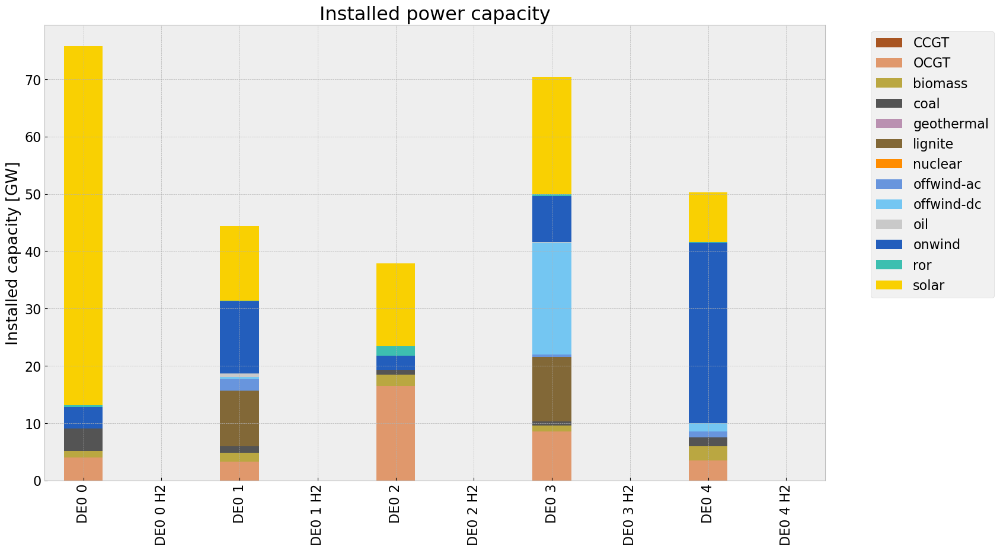

<Figure size 640x480 with 0 Axes>

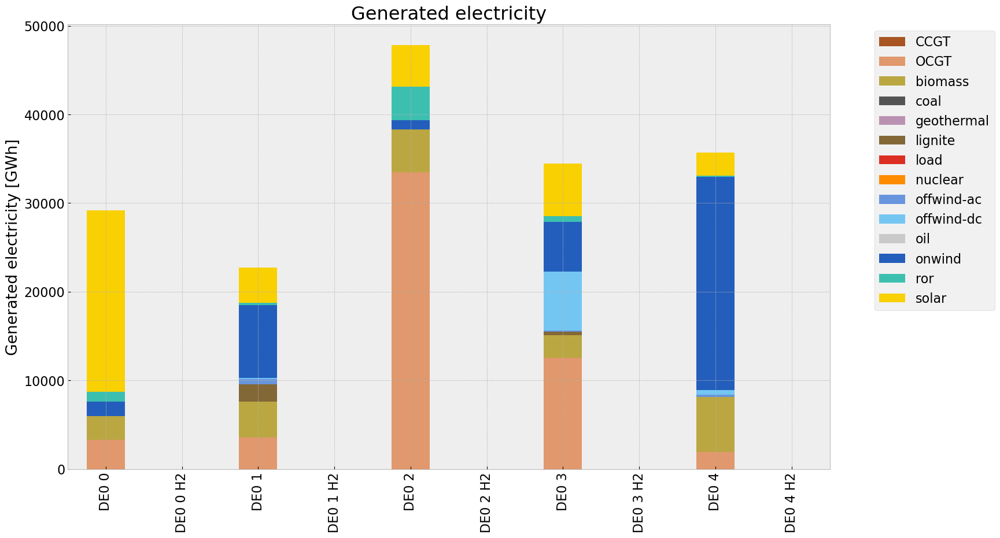

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\1913995090.py:33: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\1913995090.py:34: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carri

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.483700e+07,0.499437,0.1980,2.173994e+07
biomass,2.020635e+07,0.468000,0.0000,0.000000e+00
coal,1.103975e+02,0.329632,0.3361,1.125637e+02
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,2.340880e+06,0.358368,0.4069,2.657898e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,1.028653e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


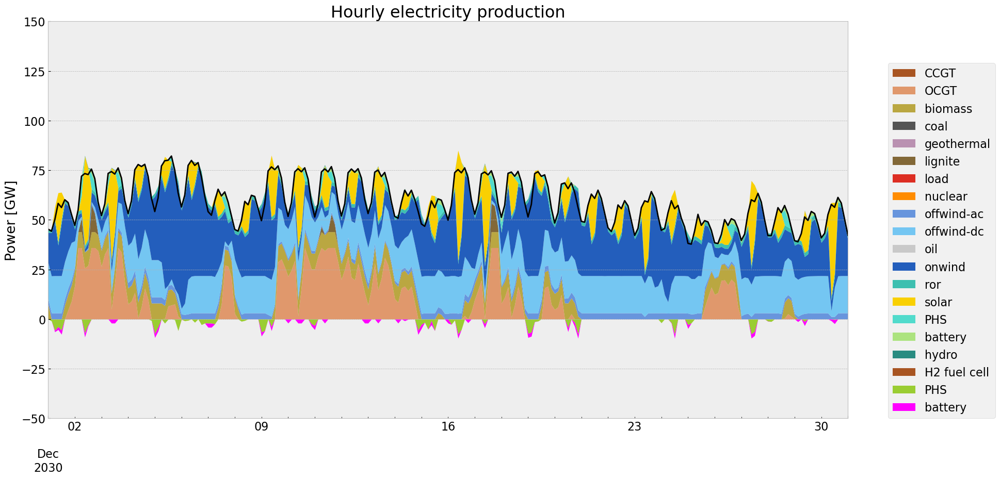

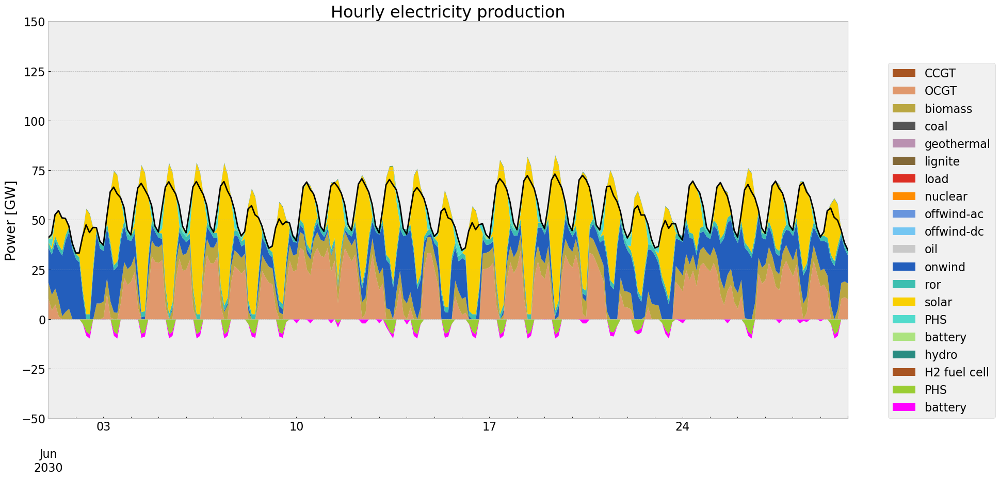

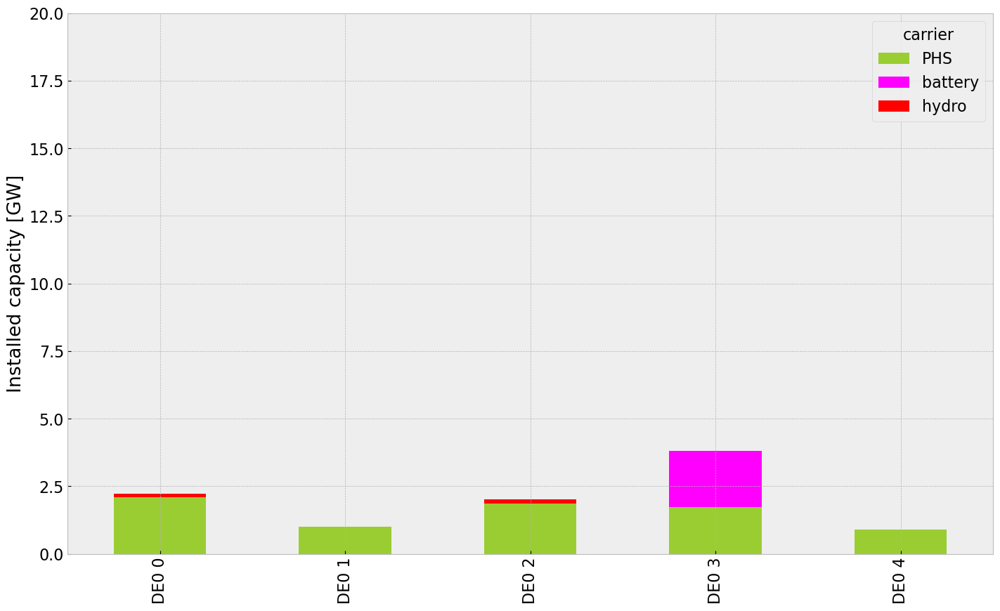

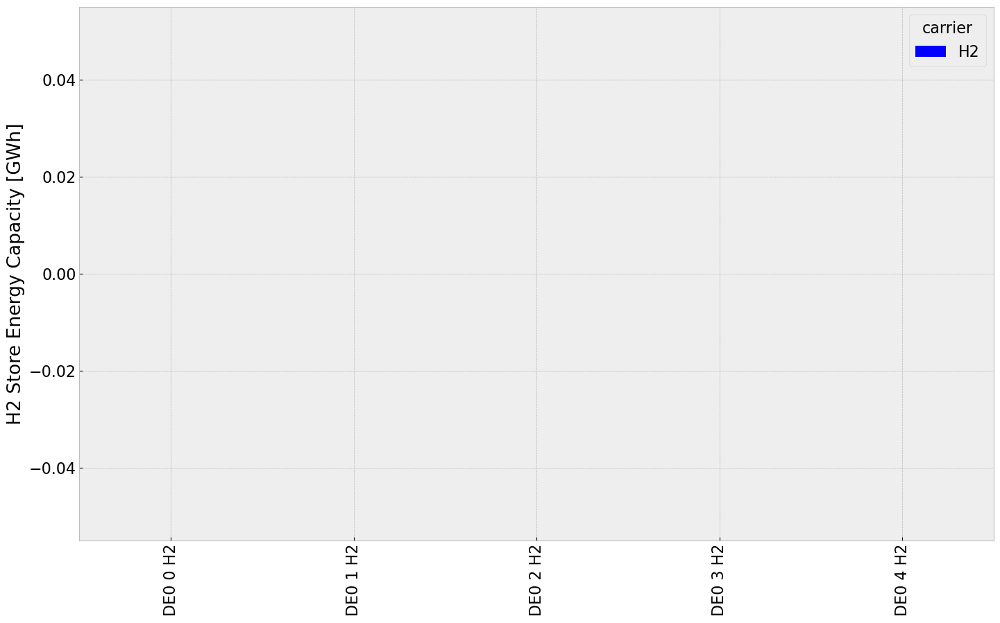

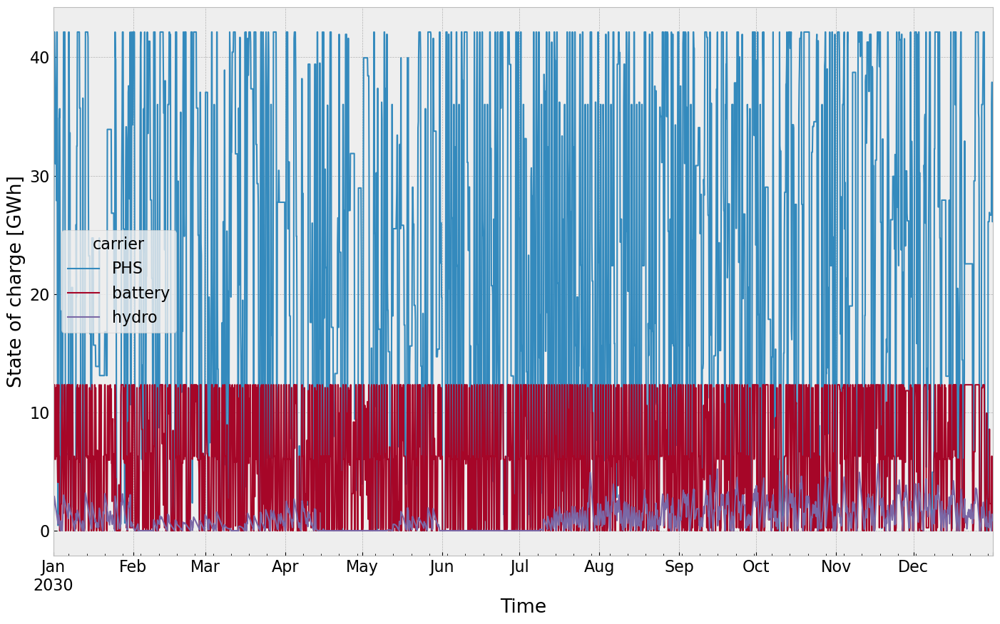

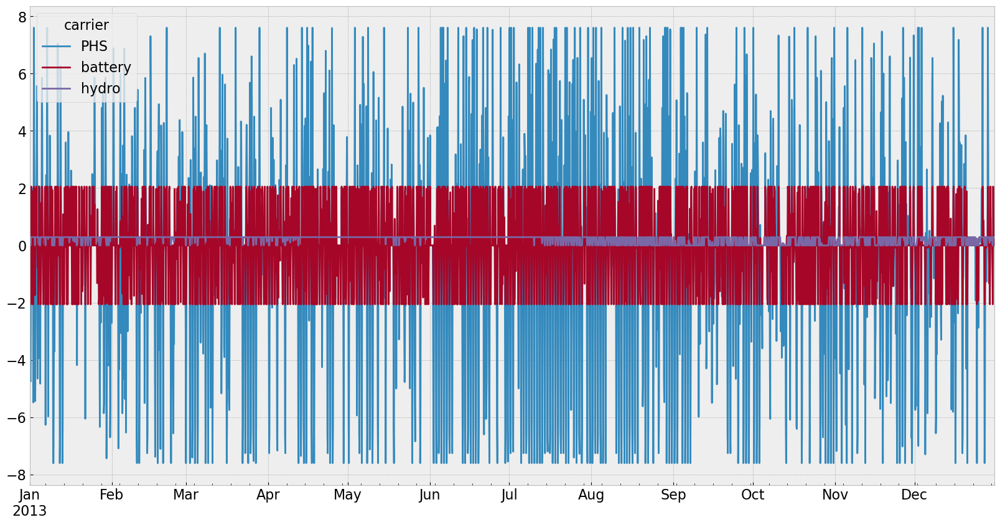

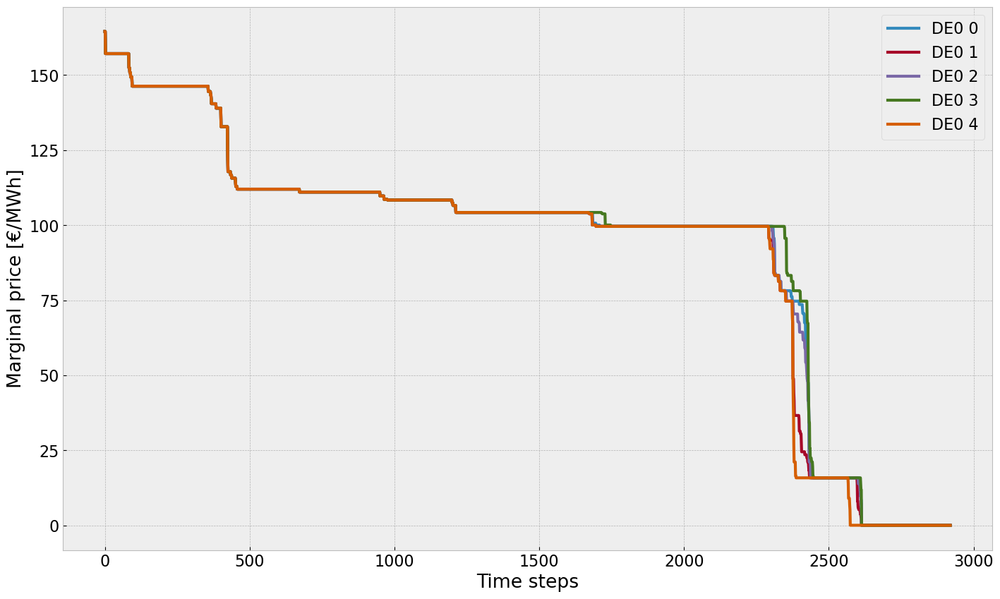

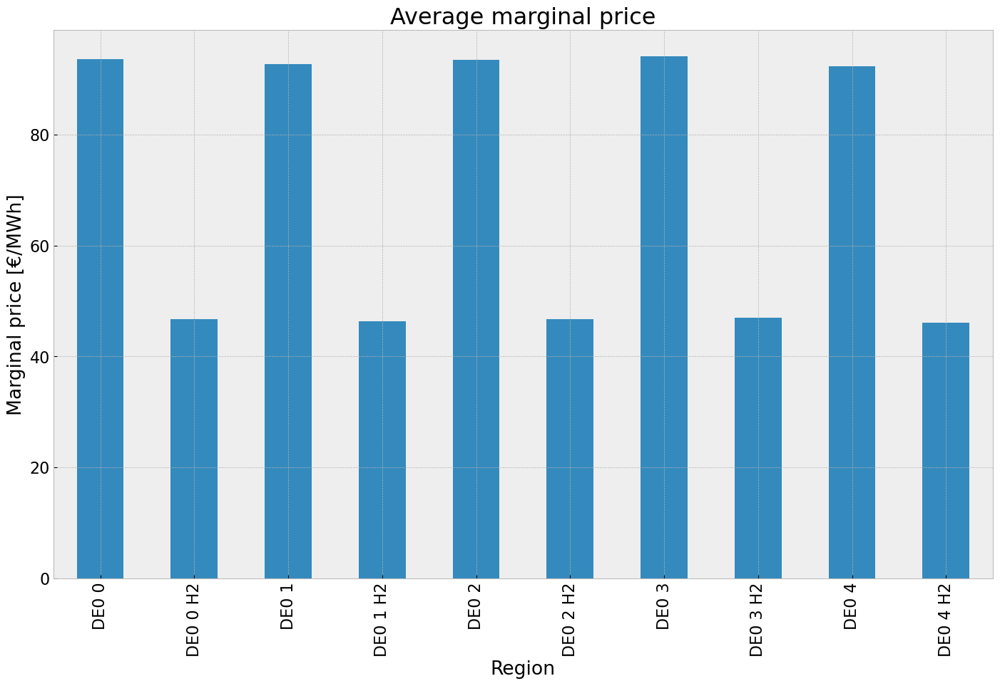

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


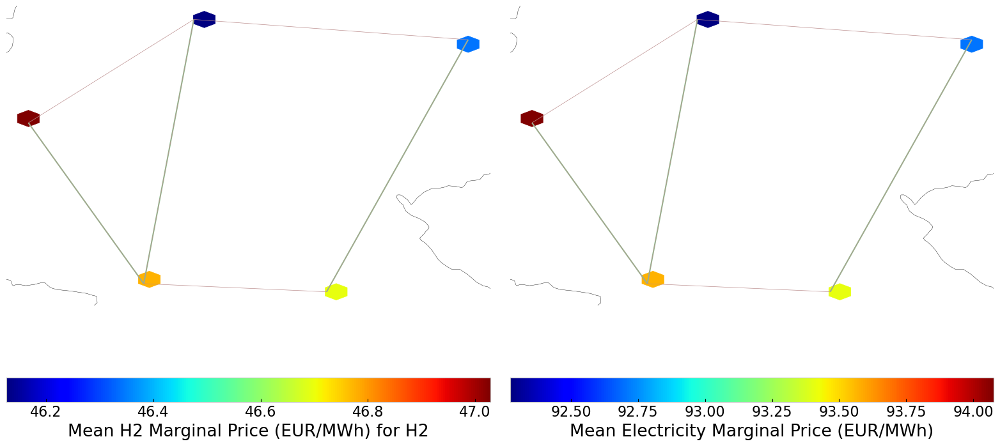

In [65]:
# Plotting
#installed cap
capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv_roll.fillna(0, inplace=True)
gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv_roll = inst_cap_table(n3, color_cap)

#Generation table
# consolidated generation table
carrier = n3.generators.carrier.unique()
df_tot_generation = n3.generators_t.p.sum()

generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
generations.fillna(0, inplace=True)

gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)

#Snapshot Summer and Winter
p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n3, '2030-12-01', '2030-12-31', colors_gen)
gen_curve(n3, '2030-06-01', '2030-06-30', colors_gen)

#installed storage unit & stores
inst_store_table(n3)
inst_storeh2_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)
price_regions(n3)

#Emission
em_noinv_roll =em_table(n3)
em_noinv_roll

# Scenario Analysis

## Installed Capacity

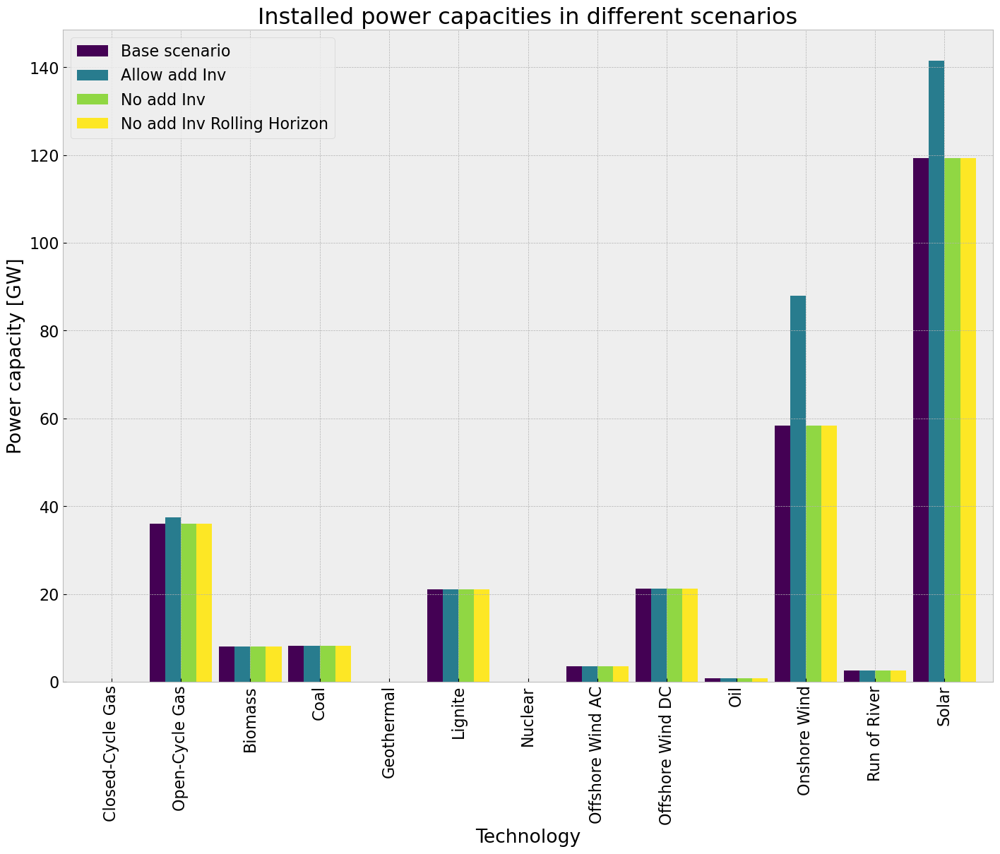

In [66]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

In [67]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,35.939257,37.521285,35.939257,35.939257
Biomass,8.011736,8.011736,8.011736,8.011736
Coal,8.158220,8.158220,8.158220,8.158220
Geothermal,0.000000,0.000000,0.000000,0.000000
Lignite,20.999170,20.999170,20.999170,20.999170
Nuclear,0.000000,0.000000,0.000000,0.000000
Offshore Wind AC,3.464309,3.464309,3.464309,3.464309
Offshore Wind DC,21.180997,21.180997,21.180997,21.180997


## Power Generation

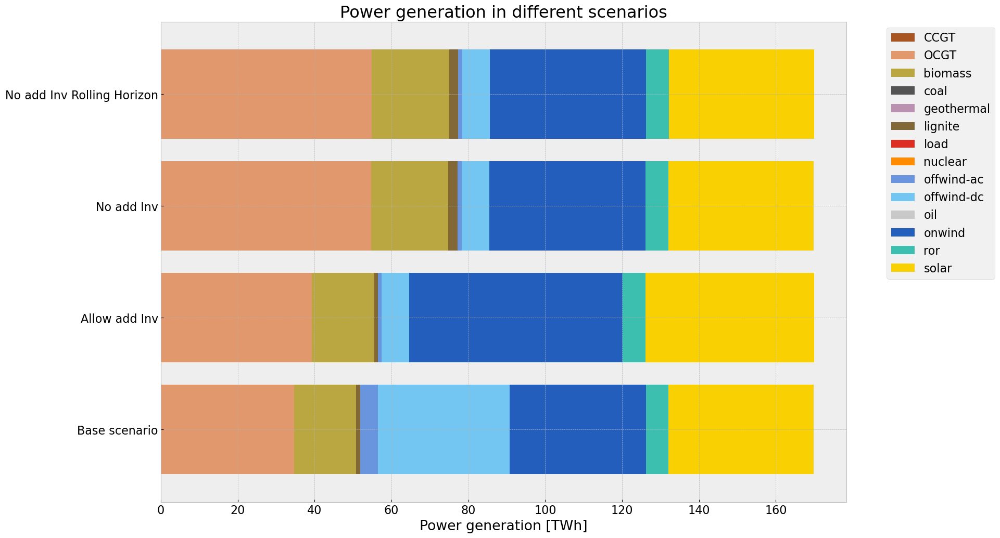

In [68]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        #xlim=[0,200],
                        width=0.8
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Average System Cost

In [69]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

#if 'AC' in system_cost_base:
#   comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
comp_system_cost.drop('-', axis=1, inplace=True)
#comp_system_cost.iloc[0,0] = system_cost_base.AC


comp_system_cost = comp_system_cost.mul(1e6).div(demand) #eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\3585904631.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\3585904631.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


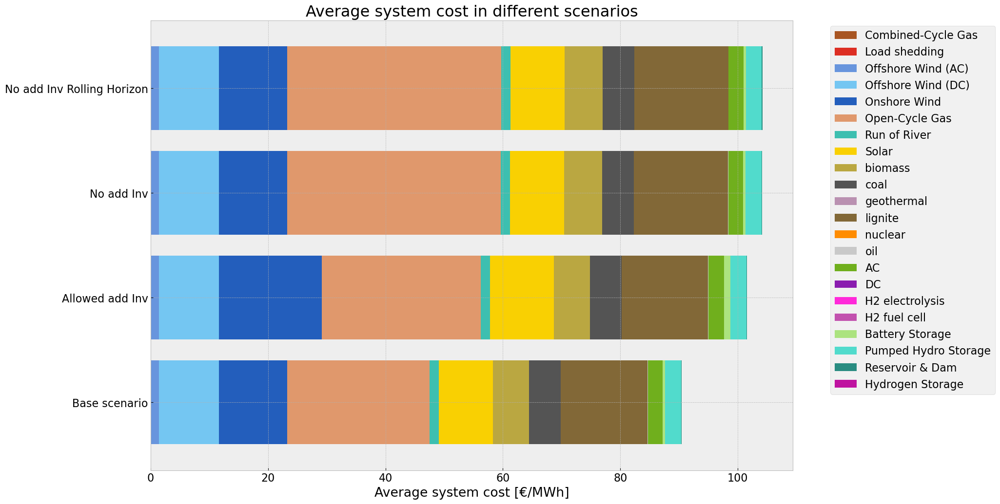

In [70]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="Average system cost [€/MWh]",
                        title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Curtailment

In [71]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [72]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


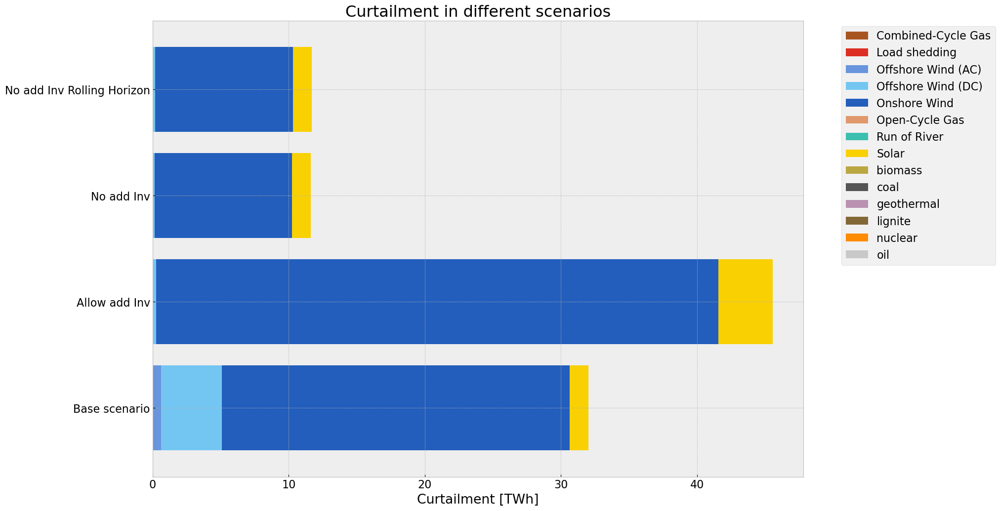

In [73]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        #xlim=[0,120],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Emission

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_14344\189732353.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


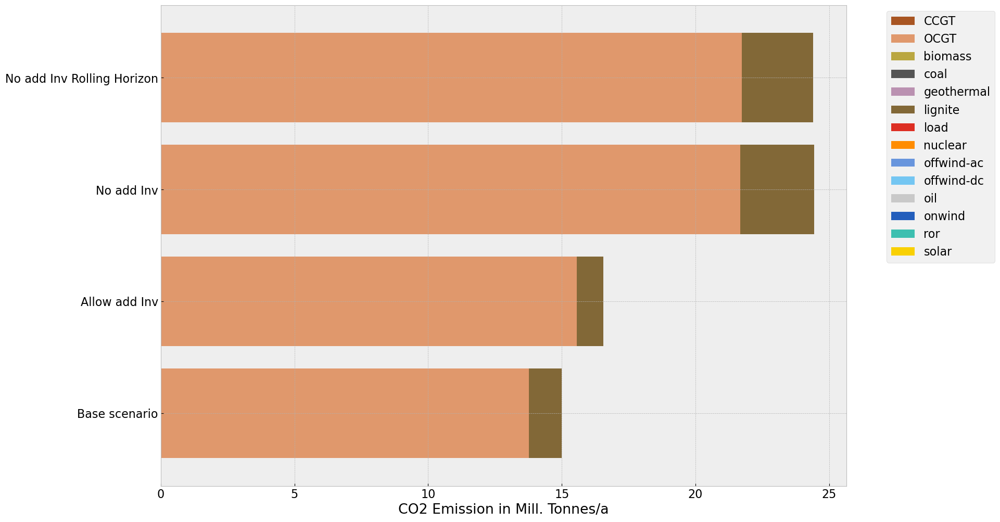

In [74]:
tech_comp = em_base.index.tolist()
comp_system_em = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_em.loc["Base scenario"] = em_base['emissions in Tonnes CO2']/1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["Allow add Inv"] = em_inv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv"] = em_noinv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv Rolling Horizon"] = em_noinv_roll['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a

comp_system_em.fillna(0, inplace=True)

colors_comp = []

for i in range(len(comp_system_em.columns)):
    for j in range(len(n.carriers.index)):
        if comp_system_em.columns[i] == n.carriers.index[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_em.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="CO2 Emission in Mill. Tonnes/a",
                        #title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
#global_constraint
#plt.axvline(x=n.global_constraints.loc['CO2Limit','constant']/1e6, color='r', linestyle='-', linewidth=2, label='CO2 cap')
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()